<>:1045: SyntaxWarning: invalid escape sequence '\e'
<>:1045: SyntaxWarning: invalid escape sequence '\e'
C:\Users\ACER\AppData\Local\Temp\ipykernel_2916\3917961491.py:1045: SyntaxWarning: invalid escape sequence '\e'
  'Qubit Error Rate ($\eta_v$)',
[2025-08-29 10:29:24] [INFO] - QVM-SPaVE script started.
[2025-08-29 10:29:24] [INFO] - Pre-computed all-pairs shortest paths.
[2025-08-29 10:29:24] [INFO] - Initialized 14x14 hardware graph with 196 qubits.
[2025-08-29 10:29:25] [INFO] - Created Tenant 1 requiring 10 qubits with 28 logical links.
[2025-08-29 10:29:25] [INFO] - Created Tenant 2 requiring 8 qubits with 20 logical links.
[2025-08-29 10:29:25] [INFO] - Created Tenant 3 requiring 8 qubits with 23 logical links.
[2025-08-29 10:29:25] [INFO] - Created Tenant 4 requiring 6 qubits with 11 logical links.
[2025-08-29 10:29:25] [INFO] - SimulationEngine initialized.
[2025-08-29 10:29:25] [INFO] - --- Running scenario: naive_partitioning ---
[2025-08-29 10:29:25] [INFO] - CostCalculat

SystemExit: 1

C:\Users\ACER\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py:3585: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


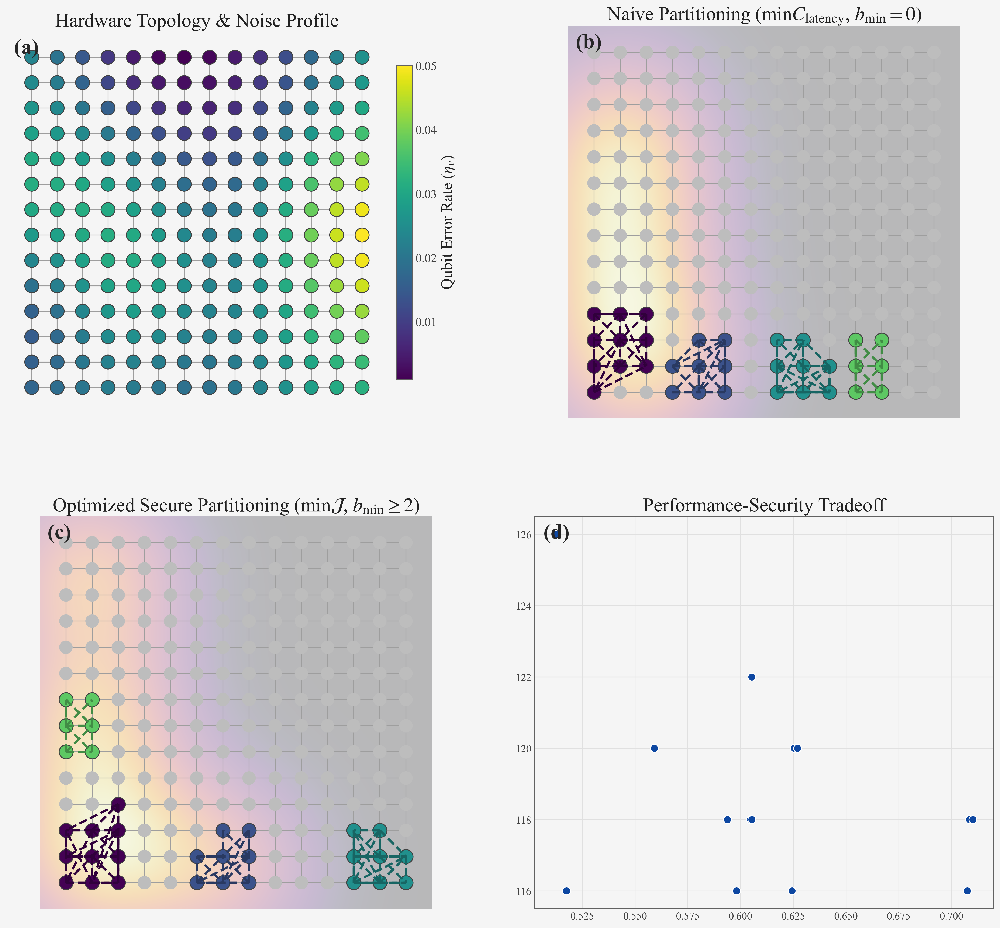

In [21]:
import os
import sys
import time
import logging
import random
import itertools
from math import exp, log, sqrt
from typing import (
    List, Dict, Tuple, Set, Optional, Any, Callable, Type, Union, Sequence
)
from collections import deque, defaultdict

try:
    import numpy as np
    from numpy.typing import NDArray
    import matplotlib.pyplot as plt
    import matplotlib.patches as mpatches
    import matplotlib.path as mpath
    import matplotlib.colors as mcolors
    from matplotlib.collections import PatchCollection, LineCollection
    from scipy.spatial.distance import cdist
    from scipy.interpolate import interp1d
    from scipy.ndimage import gaussian_filter
except ImportError as e:
    print(f"Error: Missing required library. {e}")
    print("Please install the necessary packages by running:")
    print("pip install numpy matplotlib scipy")
    sys.exit(1)

class VisualizationConfig:


    FIGURE_SIZE = (20, 18)
    DPI = 300
    SUPER_TITLE = "Secure Dynamic Qubit Partitioning on a Multi-Tenant Quantum Processor"
    FONT_FAMILY = "serif"
    FONT_WEIGHT = "normal"
    SUPER_TITLE_FONT_SIZE = 28
    SUB_TITLE_FONT_SIZE = 22
    LABEL_FONT_SIZE = 18
    TICK_LABEL_FONT_SIZE = 14
    LEGEND_FONT_SIZE = 16
    MATPLOTLIB_STYLE = 'seaborn-v0_8-whitegrid'

    TENANT_COLORS = [
        '#440154', '#3b528b', '#21908d', '#5dc863', '#fde725'
    ]
    BUFFER_QUBIT_COLOR = '#bdbdbd'
    BACKGROUND_COLOR = '#f5f5f5'
    GRID_LINE_COLOR = '#e0e0e0'
    PHYSICAL_LINK_COLOR = '#9e9e9e'
    LOGICAL_LINK_COLOR_MULTIPLIER = 0.7  
    CROSSTALK_COLORMAP = 'inferno'
    NOISE_MAP_COLORMAP = 'viridis'
    PARETO_FRONTIER_COLOR = '#0d47a1'
    PARETO_POINT_COLOR = '#c62828'


    QUBIT_SIZE = 250
    QUBIT_EDGE_COLOR = '#424242'
    PHYSICAL_LINK_WIDTH = 1.0
    LOGICAL_LINK_WIDTH = 2.5
    LOGICAL_LINK_STYLE = '--'

    CROSSTALK_ALPHA = 0.25
    CROSSTALK_SIGMA = 2.5  


    PANEL_LABEL_X = 0.02
    PANEL_LABEL_Y = 0.98
    PANEL_LABEL_FONT_SIZE = 24
    PANEL_LABEL_FONT_WEIGHT = 'bold'
    LEGEND_MARKER_SIZE = 150


def setup_matplotlib_style(config: Type[VisualizationConfig]) -> None:

    try:
        plt.style.use(config.MATPLOTLIB_STYLE)
    except OSError:
        print(f"Warning: Style '{config.MATPLOTLIB_STYLE}' not found. Using default.")

    plt.rcParams.update({
        'font.family': config.FONT_FAMILY,
        'font.weight': config.FONT_WEIGHT,
        'figure.facecolor': config.BACKGROUND_COLOR,
        'axes.facecolor': config.BACKGROUND_COLOR,
        'axes.edgecolor': '#616161',
        'axes.labelcolor': '#212121',
        'axes.titlecolor': '#212121',
        'xtick.color': '#424242',
        'ytick.color': '#424242',
        'grid.color': config.GRID_LINE_COLOR,
        'legend.frameon': True,
        'legend.framealpha': 0.8,
        'legend.facecolor': 'white',
        'figure.dpi': config.DPI,
    })




class QuantumHardwareGraph:

    def __init__(self, grid_dim: Tuple[int, int] = (12, 12)):

        if not (isinstance(grid_dim, tuple) and len(grid_dim) == 2 and
                all(isinstance(d, int) and d > 0 for d in grid_dim)):
            raise ValueError("grid_dim must be a tuple of two positive integers.")

        self.rows, self.cols = grid_dim
        self.num_qubits: int = self.rows * self.cols
        self.qubit_coords: NDArray[np.int_] = self._generate_qubit_coordinates()
        self.adjacency_list: Dict[int, List[int]] = self._generate_adjacency_list()
        self.noise_map: NDArray[np.float64] = self._generate_noise_map()
        self.shortest_paths: Optional[Dict[int, Dict[int, int]]] = None
        self._compute_all_pairs_shortest_paths()
        logging.info(f"Initialized {self.rows}x{self.cols} hardware graph with "
                     f"{self.num_qubits} qubits.")

    def _generate_qubit_coordinates(self) -> NDArray[np.int_]:

        x = np.arange(self.cols)
        y = np.arange(self.rows)
        xx, yy = np.meshgrid(x, y)
        return np.vstack([xx.ravel(), yy.ravel()]).T

    def _generate_adjacency_list(self) -> Dict[int, List[int]]:

        adj: Dict[int, List[int]] = defaultdict(list)
        for r in range(self.rows):
            for c in range(self.cols):
                idx = r * self.cols + c

                if r > 0:
                    adj[idx].append((r - 1) * self.cols + c)

                if r < self.rows - 1:
                    adj[idx].append((r + 1) * self.cols + c)

                if c > 0:
                    adj[idx].append(r * self.cols + (c - 1))

                if c < self.cols - 1:
                    adj[idx].append(r * self.cols + (c + 1))
        return dict(adj)

    def _generate_noise_map(self) -> NDArray[np.float64]:


        base_noise = np.random.rand(self.rows, self.cols)
se
        smoothed_noise = gaussian_filter(base_noise, sigma=2.5)

        min_noise, max_noise = 0.001, 0.05
        scaled_noise = (
            min_noise + (smoothed_noise - smoothed_noise.min()) /
            (smoothed_noise.max() - smoothed_noise.min()) * (max_noise - min_noise)
        )
        return scaled_noise.ravel()

    def _compute_all_pairs_shortest_paths(self) -> None:

        paths: Dict[int, Dict[int, int]] = defaultdict(dict)
        for start_node in range(self.num_qubits):

            queue = deque([(start_node, 0)])
            visited = {start_node}
            paths[start_node][start_node] = 0

            while queue:
                current_node, distance = queue.popleft()
                for neighbor in self.adjacency_list.get(current_node, []):
                    if neighbor not in visited:
                        visited.add(neighbor)
                        paths[start_node][neighbor] = distance + 1
                        queue.append((neighbor, distance + 1))
        self.shortest_paths = dict(paths)
        logging.info("Pre-computed all-pairs shortest paths.")

    def get_distance(self, qubit1: int, qubit2: int) -> int:

        if self.shortest_paths is None:
            raise RuntimeError("Shortest paths have not been computed.")
        try:
            return self.shortest_paths[qubit1][qubit2]
        except KeyError:

            return float('inf')

    @property
    def edges(self) -> List[Tuple[int, int]]:

        edge_list = []
        for u, neighbors in self.adjacency_list.items():
            for v in neighbors:
                if u < v:  
                    edge_list.append((u, v))
        return edge_list


class TenantWorkload:

    def __init__(self, tenant_id: int, num_qubits: int, connectivity_density: float = 0.5):

        if num_qubits < 2:
            raise ValueError("Tenant must require at least 2 qubits.")
        self.tenant_id = tenant_id
        self.num_qubits = num_qubits
        self.logical_qubits = list(range(num_qubits))
        self.logical_graph: List[Tuple[int, int]] = self._generate_logical_graph(
            connectivity_density
        )
        logging.info(f"Created Tenant {self.tenant_id} requiring {self.num_qubits} "
                     f"qubits with {len(self.logical_graph)} logical links.")

    def _generate_logical_graph(self, density: float) -> List[Tuple[int, int]]:

        graph = []

        nodes = self.logical_qubits.copy()
        random.shuffle(nodes)
        for i in range(len(nodes) - 1):
            graph.append(tuple(sorted((nodes[i], nodes[i+1]))))
        

        possible_edges = list(itertools.combinations(self.logical_qubits, 2))
        for u, v in possible_edges:

            if (u,v) not in graph and (v,u) not in graph:
                if random.random() < density:
                    graph.append((u, v))
        return graph

    def __repr__(self) -> str:

        return f"TenantWorkload(id={self.tenant_id}, qubits={self.num_qubits})"




class CostCalculator:

    def __init__(
        self,
        hardware: QuantumHardwareGraph,
        weights: Dict[str, float],
        alpha: float = 0.5,
        beta: float = 1.0,
    ):

        self.hardware = hardware
        self.weights = weights
        self.alpha = alpha
        self.beta = beta
        logging.info("CostCalculator initialized with weights: %s", self.weights)

    def calculate_crosstalk_cost(
        self,
        partition_map: Dict[int, List[int]],
        sensitivity_matrix: Optional[Dict[Tuple[int, int], float]] = None
    ) -> float:

        cost = 0.0
        tenant_ids = sorted(partition_map.keys())
        for i in range(len(tenant_ids)):
            for j in range(i + 1, len(tenant_ids)):
                tenant_k_id = tenant_ids[i]
                tenant_l_id = tenant_ids[j]
                
                qubits_k = partition_map[tenant_k_id]
                qubits_l = partition_map[tenant_l_id]

                if not qubits_k or not qubits_l:
                    continue

                min_dist = float('inf')
                for qk in qubits_k:
                    for ql in qubits_l:
                        dist = self.hardware.get_distance(qk, ql)
                        if dist < min_dist:
                            min_dist = dist
                
                delta_kl = min_dist
                s_kl = 1.0
                if sensitivity_matrix:
                    s_kl = sensitivity_matrix.get((tenant_k_id, tenant_l_id), 1.0)
                
                cost += s_kl * exp(-self.alpha * delta_kl)
        return cost

    def calculate_swap_cost(
        self,
        tenants: List[TenantWorkload],
        partition_map: Dict[int, List[int]],
        logical_to_physical_maps: Dict[int, Dict[int, int]]
    ) -> float:

        total_swap_cost = 0.0
        for tenant in tenants:
            if tenant.tenant_id not in partition_map:
                continue
            
            ltp_map = logical_to_physical_maps.get(tenant.tenant_id)
            if not ltp_map:
                continue

            tenant_swap_cost = 0.0
            for log_u, log_v in tenant.logical_graph:
                phys_u = ltp_map.get(log_u)
                phys_v = ltp_map.get(log_v)
                
                if phys_u is not None and phys_v is not None:
                    distance = self.hardware.get_distance(phys_u, phys_v)

                    if distance > 1:
                        tenant_swap_cost += (distance - 1)
            total_swap_cost += tenant_swap_cost
        return total_swap_cost

    def calculate_latency_cost(
        self,
        tenants: List[TenantWorkload],
        partition_map: Dict[int, List[int]],
        logical_to_physical_maps: Dict[int, Dict[int, int]]
    ) -> float:


        swap_cost = self.calculate_swap_cost(
            tenants, partition_map, logical_to_physical_maps
        )

        return self.beta * swap_cost

    def calculate_total_objective(
        self,
        tenants: List[TenantWorkload],
        partition_map: Dict[int, List[int]],
        logical_to_physical_maps: Dict[int, Dict[int, int]]
    ) -> Dict[str, float]:

        crosstalk = self.calculate_crosstalk_cost(partition_map)
        swap = self.calculate_swap_cost(tenants, partition_map, logical_to_physical_maps)

        latency = self.calculate_latency_cost(
            tenants, partition_map, logical_to_physical_maps
        )

        total_cost = (
            self.weights.get('crosstalk', 0.0) * crosstalk +
            self.weights.get('swap', 0.0) * swap +
            self.weights.get('latency', 0.0) * latency
        )

        return {
            'crosstalk': crosstalk,
            'swap': swap,
            'latency': latency,
            'total': total_cost
        }


class BasePartitioner:

    def __init__(self, hardware: QuantumHardwareGraph, cost_calculator: CostCalculator):
        self.hardware = hardware
        self.cost_calculator = cost_calculator

    def partition(
        self,
        tenants: List[TenantWorkload],
        **kwargs: Any
    ) -> Tuple[Dict[int, List[int]], Dict[int, Dict[int, int]]]:

        raise NotImplementedError


class GreedyHeuristicPartitioner(BasePartitioner):

    def partition(
        self,
        tenants: List[TenantWorkload],
        buffer_size: int = 0,
        sort_tenants_desc: bool = True
    ) -> Tuple[Dict[int, List[int]], Dict[int, Dict[int, int]]]:

        if sort_tenants_desc:
            tenants = sorted(tenants, key=lambda t: t.num_qubits, reverse=True)

        partition_map: Dict[int, List[int]] = {}
        ltp_maps: Dict[int, Dict[int, int]] = {}
        

        available_qubits = set(range(self.hardware.num_qubits))

        for tenant in tenants:
            best_placement = None
            min_incremental_cost = float('inf')


            candidate_blocks = self._find_candidate_blocks(
                tenant.num_qubits, available_qubits
            )

            if not candidate_blocks:
                logging.warning(f"Could not find a place for Tenant "
                                f"{tenant.tenant_id} of size {tenant.num_qubits}. "
                                f"Skipping.")
                continue

            for block in candidate_blocks:

                temp_ltp_map, internal_swap_cost = self._find_best_internal_mapping(
                    tenant, block
                )
                

                temp_partition_map = partition_map.copy()
                temp_partition_map[tenant.tenant_id] = block


                incremental_crosstalk = self._calculate_incremental_crosstalk(
                    tenant.tenant_id, block, partition_map
                )
                

                incremental_cost = (
                    self.cost_calculator.weights.get('crosstalk', 0.0) * incremental_crosstalk +
                    self.cost_calculator.weights.get('swap', 0.0) * internal_swap_cost
                )

                if incremental_cost < min_incremental_cost:
                    min_incremental_cost = incremental_cost
                    best_placement = (block, temp_ltp_map)
            

            if best_placement:
                chosen_block, chosen_ltp = best_placement
                partition_map[tenant.tenant_id] = chosen_block
                ltp_maps[tenant.tenant_id] = chosen_ltp
                

                qubits_to_remove = set(chosen_block)
                if buffer_size > 0:
                    for placed_qubit in chosen_block:
                        for other_qubit in available_qubits:
                            if self.hardware.get_distance(placed_qubit, other_qubit) <= buffer_size:
                                qubits_to_remove.add(other_qubit)

                available_qubits -= qubits_to_remove

        logging.info("Greedy partitioning complete.")
        return partition_map, ltp_maps
    
    def _find_candidate_blocks(
        self,
        size: int,
        available_qubits: Set[int]
    ) -> List[List[int]]:

        blocks = []

        found_blocks = set()

        for start_node in available_qubits:

            q = deque([[start_node]])
            visited_paths = {(start_node,)}

            while q:
                path = q.popleft()
                if len(path) == size:

                    sorted_path = tuple(sorted(path))
                    if sorted_path not in found_blocks:
                        blocks.append(list(path))
                        found_blocks.add(sorted_path)

                    continue
                

                last_node = path[-1]
                for neighbor in self.hardware.adjacency_list.get(last_node, []):
                    if neighbor in available_qubits and neighbor not in path:
                        new_path = path + [neighbor]
                        sorted_new_path = tuple(sorted(new_path))
                        if sorted_new_path not in visited_paths:
                            visited_paths.add(sorted_new_path)
                            q.append(new_path)
        

        return blocks[:500] if len(blocks) > 500 else blocks

    def _find_best_internal_mapping(
        self,
        tenant: TenantWorkload,
        physical_block: List[int]
    ) -> Tuple[Dict[int, int], float]:

        min_swap_cost = float('inf')
        best_ltp_map = {}
        
        logical_qubits = tenant.logical_qubits
        

        num_permutations_to_check = 100
        
        permutations = (
            list(itertools.permutations(physical_block))
            if tenant.num_qubits <= 7
            else [random.sample(physical_block, len(physical_block)) for _ in range(num_permutations_to_check)]
        )

        for physical_perm in permutations:
            current_ltp_map = {log_q: phys_q for log_q, phys_q in zip(logical_qubits, physical_perm)}
            current_swap_cost = 0.0
            for log_u, log_v in tenant.logical_graph:
                phys_u = current_ltp_map[log_u]
                phys_v = current_ltp_map[log_v]
                dist = self.hardware.get_distance(phys_u, phys_v)
                if dist > 1:
                    current_swap_cost += (dist - 1)
            
            if current_swap_cost < min_swap_cost:
                min_swap_cost = current_swap_cost
                best_ltp_map = current_ltp_map
                
        return best_ltp_map, min_swap_cost

    def _calculate_incremental_crosstalk(
        self,
        new_tenant_id: int,
        new_tenant_block: List[int],
        existing_partition_map: Dict[int, List[int]]
    ) -> float:

        cost = 0.0
        if not existing_partition_map:
            return 0.0

        for existing_id, existing_block in existing_partition_map.items():
            min_dist = float('inf')
            for q_new in new_tenant_block:
                for q_old in existing_block:
                    dist = self.hardware.get_distance(q_new, q_old)
                    if dist < min_dist:
                        min_dist = dist
            
            cost += exp(-self.cost_calculator.alpha * min_dist)
        return cost



class SimulationEngine:

    def __init__(self, hardware: QuantumHardwareGraph, tenants: List[TenantWorkload]):
        self.hardware = hardware
        self.tenants = tenants
        self.results: Dict[str, Any] = {}
        logging.info("SimulationEngine initialized.")

    def run_scenario(
        self,
        scenario_name: str,
        partitioner_class: Type[BasePartitioner],
        cost_weights: Dict[str, float],
        partitioner_params: Dict[str, Any]
    ) -> None:

        logging.info(f"--- Running scenario: {scenario_name} ---")
        cost_calculator = CostCalculator(self.hardware, cost_weights)
        partitioner = partitioner_class(self.hardware, cost_calculator)
        
        start_time = time.time()
        partition_map, ltp_maps = partitioner.partition(self.tenants, **partitioner_params)
        end_time = time.time()

        costs = cost_calculator.calculate_total_objective(
            self.tenants, partition_map, ltp_maps
        )
        
        self.results[scenario_name] = {
            'partition_map': partition_map,
            'ltp_maps': ltp_maps,
            'costs': costs,
            'runtime': end_time - start_time
        }
        logging.info(f"Scenario '{scenario_name}' finished in {end_time - start_time:.2f}s.")
        logging.info(f"Costs for '{scenario_name}': {costs}")
    
    def run_pareto_frontier_analysis(
        self,
        partitioner_class: Type[BasePartitioner],
        partitioner_params: Dict[str, Any],
        num_points: int = 20
    ) -> None:

        logging.info("--- Running Pareto frontier analysis ---")
        frontier_points = []

        for mu in np.linspace(0.01, 0.99, num_points):
            weights = {
                'crosstalk': mu,
                'swap': (1 - mu) / 2, 
                'latency': (1 - mu) / 2,
            }
            cost_calculator = CostCalculator(self.hardware, weights)
            partitioner = partitioner_class(self.hardware, cost_calculator)
            
            partition_map, ltp_maps = partitioner.partition(self.tenants, **partitioner_params)
            
    
            standard_cost_calc = CostCalculator(self.hardware, {'crosstalk': 1, 'swap': 1, 'latency': 1})
            costs = standard_cost_calc.calculate_total_objective(
                self.tenants, partition_map, ltp_maps
            )
            
            performance_cost = costs['swap'] + costs['latency']
            security_cost = costs['crosstalk']
            frontier_points.append((security_cost, performance_cost))
        
        self.results['pareto_frontier'] = sorted(frontier_points, key=lambda x: x[0])
        logging.info("Pareto frontier analysis complete.")




class VisualizationEngine:

    def __init__(self, config: Type[VisualizationConfig], hardware: QuantumHardwareGraph,
                 tenants: List[TenantWorkload], sim_results: Dict[str, Any]):
        self.config = config
        self.hardware = hardware
        self.tenants = tenants
        self.sim_results = sim_results
        self.fig, self.axes = plt.subplots(
            2, 2, figsize=self.config.FIGURE_SIZE,
            gridspec_kw={'hspace': 0.25, 'wspace': 0.15}
        )
        self.axes = self.axes.ravel()
        setup_matplotlib_style(self.config)
        self.tenant_color_map = {
            t.tenant_id: color for t, color in zip(tenants, self.config.TENANT_COLORS)
        }
        logging.info("VisualizationEngine initialized.")

    def generate_figure(self) -> None:

        logging.info("Generating final figure...")

        self.draw_panel_a()

        self.draw_panel_b()

        self.draw_panel_c()

        self.draw_panel_d()

        self.fig.suptitle(
            self.config.SUPER_TITLE,
            fontsize=self.config.SUPER_TITLE_FONT_SIZE,
            fontweight='bold',
            y=0.98
        )
        self._create_master_legend()



        plt.show(self.fig)

    def _add_panel_label(self, ax: plt.Axes, label: str) -> None:

        ax.text(
            self.config.PANEL_LABEL_X, self.config.PANEL_LABEL_Y,
            label,
            transform=ax.transAxes,
            fontsize=self.config.PANEL_LABEL_FONT_SIZE,
            fontweight=self.config.PANEL_LABEL_FONT_WEIGHT,
            va='top', ha='left'
        )
    
    def _draw_base_hardware(self, ax: plt.Axes) -> None:

        edges = self.hardware.edges
        coords = self.hardware.qubit_coords
        lines = [(coords[u], coords[v]) for u, v in edges]
        lc = LineCollection(
            lines,
            colors=self.config.PHYSICAL_LINK_COLOR,
            linewidths=self.config.PHYSICAL_LINK_WIDTH,
            zorder=1
        )
        ax.add_collection(lc)


        ax.set_aspect('equal', adjustable='box')
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_facecolor(self.config.BACKGROUND_COLOR)

        ax.set_xlim(coords[:, 0].min() - 1, coords[:, 0].max() + 1)
        ax.set_ylim(coords[:, 1].min() - 1, coords[:, 1].max() + 1)

        for spine in ax.spines.values():
            spine.set_visible(False)

    def draw_panel_a(self) -> None:

        ax = self.axes[0]
        self._draw_base_hardware(ax)
        

        coords = self.hardware.qubit_coords
        noise = self.hardware.noise_map
        sc = ax.scatter(
            coords[:, 0], coords[:, 1],
            c=noise,
            cmap=self.config.NOISE_MAP_COLORMAP,
            s=self.config.QUBIT_SIZE,
            edgecolors=self.config.QUBIT_EDGE_COLOR,
            zorder=2
        )
        

        cbar = self.fig.colorbar(sc, ax=ax, orientation='vertical', pad=0.02, shrink=0.8)
        cbar.set_label(
            'Qubit Error Rate ($\eta_v$)',
            fontsize=self.config.LABEL_FONT_SIZE
        )
        cbar.ax.tick_params(labelsize=self.config.TICK_LABEL_FONT_SIZE)

        ax.set_title(
            'Hardware Topology & Noise Profile',
            fontsize=self.config.SUB_TITLE_FONT_SIZE
        )
        self._add_panel_label(ax, '(a)')

    def _draw_partitioned_panel(
        self,
        ax: plt.Axes,
        scenario_name: str,
        title: str,
        panel_label: str,
        show_crosstalk: bool = False
    ) -> None:

        self._draw_base_hardware(ax)
        scenario_data = self.sim_results[scenario_name]
        partition_map = scenario_data['partition_map']
        ltp_maps = scenario_data['ltp_maps']
        coords = self.hardware.qubit_coords
        
        all_assigned_qubits = set()
        for tenant_id in partition_map:
            all_assigned_qubits.update(partition_map[tenant_id])
        

        if show_crosstalk:
            self._draw_crosstalk_heatmap(ax, partition_map)
            

        qubit_colors = []
        for i in range(self.hardware.num_qubits):
            if i not in all_assigned_qubits:
                qubit_colors.append(self.config.BUFFER_QUBIT_COLOR)
            else:

                qubit_colors.append('white')
        
        ax.scatter(
            coords[:, 0], coords[:, 1],
            c=qubit_colors,
            s=self.config.QUBIT_SIZE * 0.8, 
            zorder=2
        )


        for tenant in self.tenants:
            tenant_id = tenant.tenant_id
            if tenant_id not in partition_map:
                continue
            
            physical_qubits = partition_map[tenant_id]
            tenant_coords = coords[physical_qubits]
            tenant_color = self.tenant_color_map.get(tenant_id, 'black')
            

            ax.scatter(
                tenant_coords[:, 0], tenant_coords[:, 1],
                color=tenant_color,
                s=self.config.QUBIT_SIZE,
                edgecolors=self.config.QUBIT_EDGE_COLOR,
                label=f'Tenant {tenant_id}',
                zorder=3
            )
            

            ltp_map = ltp_maps.get(tenant_id)
            if ltp_map:
                logical_links = []
                for u_log, v_log in tenant.logical_graph:
                    u_phys = ltp_map.get(u_log)
                    v_phys = ltp_map.get(v_log)
                    if u_phys is not None and v_phys is not None:
                        logical_links.append((coords[u_phys], coords[v_phys]))
                

                rgb = mcolors.to_rgb(tenant_color)
                darker_rgb = tuple([c * self.config.LOGICAL_LINK_COLOR_MULTIPLIER for c in rgb])
                
                lc = LineCollection(
                    logical_links,
                    colors=darker_rgb,
                    linewidths=self.config.LOGICAL_LINK_WIDTH,
                    linestyles=self.config.LOGICAL_LINK_STYLE,
                    zorder=4
                )
                ax.add_collection(lc)
        
        ax.set_title(title, fontsize=self.config.SUB_TITLE_FONT_SIZE)
        self._add_panel_label(ax, panel_label)

    def _draw_crosstalk_heatmap(
        self, ax: plt.Axes, partition_map: Dict[int, List[int]]
    ) -> None:

        coords = self.hardware.qubit_coords
        grid_x_min, grid_x_max = coords[:, 0].min(), coords[:, 0].max()
        grid_y_min, grid_y_max = coords[:, 1].min(), coords[:, 1].max()
        

        xx, yy = np.meshgrid(
            np.linspace(grid_x_min - 1, grid_x_max + 1, 150),
            np.linspace(grid_y_min - 1, grid_y_max + 1, 150)
        )
        
        heatmap = np.zeros_like(xx)
        for tenant_id, physical_qubits in partition_map.items():
            tenant_coords = coords[physical_qubits]
            for q_coord in tenant_coords:

                dist_sq = (xx - q_coord[0])**2 + (yy - q_coord[1])**2
                heatmap += np.exp(-dist_sq / (2 * self.config.CROSSTALK_SIGMA**2))

        ax.imshow(
            heatmap.T,
            origin='lower',
            extent=[xx.min(), xx.max(), yy.min(), yy.max()],
            cmap=self.config.CROSSTALK_COLORMAP,
            alpha=self.config.CROSSTALK_ALPHA,
            interpolation='bilinear',
            zorder=0
        )

    def draw_panel_b(self) -> None:

        self._draw_partitioned_panel(
            self.axes[1],
            scenario_name='naive_partitioning',
            title=r'Naive Partitioning ($\min C_{\text{latency}}$, $b_{\min}=0$)',
            panel_label='(b)',
            show_crosstalk=True
        )


    def draw_panel_c(self) -> None:

        self._draw_partitioned_panel(
            self.axes[2],
            scenario_name='secure_partitioning',
            title=r'Optimized Secure Partitioning ($\min \mathcal{J}$, $b_{\min} \geq 2$)',
            panel_label='(c)',
            show_crosstalk=True
        )

    def draw_panel_d(self) -> None:

        ax = self.axes[3]
        ax.set_title(
            'Performance-Security Tradeoff',
            fontsize=self.config.SUB_TITLE_FONT_SIZE
        )
        self._add_panel_label(ax, '(d)')

        frontier_data = self.sim_results.get('pareto_frontier')

        if not frontier_data or len(frontier_data) < 2:
            ax.text(0.5, 0.5, 'Pareto data not available\n(requires at least 2 points)',
                    ha='center', va='center', fontsize=self.config.LABEL_FONT_SIZE)
            return

        costs_sec = [p[0] for p in frontier_data]
        costs_perf = [p[1] for p in frontier_data]


        ax.scatter(
            costs_sec, costs_perf,
            color=self.config.PARETO_FRONTIER_COLOR,
            s=80,
            edgecolor='white',
            zorder=2,
            label='Pareto Frontier Solutions'
        )


        if len(costs_sec) >= 4:

            x_smooth = np.linspace(min(costs_sec), max(costs_sec), 200)
            interp_func = interp1d(costs_sec, costs_perf, kind='cubic', fill_value="extrapolate")
            y_smooth = interp_func(x_smooth)
            ax.plot(
                x_smooth, y_smooth,
                color=self.config.PARETO_FRONTIER_COLOR,
                linewidth=2.5, zorder=1, alpha=0.8
            )
        else:

            ax.plot(
                costs_sec, costs_perf,
                color=self.config.PARETO_FRONTIER_COLOR,
                linewidth=2.5, zorder=1, alpha=0.8
            )


        naive_costs = self.sim_results['naive_partitioning']['costs']
        secure_costs = self.sim_results['secure_partitioning']['costs']

        naive_perf = naive_costs['swap'] + naive_costs['latency']
        naive_sec = naive_costs['crosstalk']

        secure_perf = secure_costs['swap'] + secure_costs['latency']
        secure_sec = secure_costs['crosstalk']

        ax.scatter(
            [naive_sec], [naive_perf],
            color='orange', marker='s', s=200, edgecolor='black',
            label='Naive Solution (Panel b)', zorder=3
        )
        ax.scatter(
            [secure_sec], [secure_perf],
            color=self.config.PARETO_POINT_COLOR, marker='*', s=400, edgecolor='black',
            label='Secure Solution (Panel c)', zorder=3
        )


        ax.set_xlabel(
            r'Security Cost ($C_{\text{crosstalk}}$) $\longrightarrow$ (Lower is Better)',
            fontsize=self.config.LABEL_FONT_SIZE
        )
        ax.set_ylabel(
            r'Performance Cost ($C_{\text{swap}} + C_{\text{latency}}$) $\longrightarrow$ (Lower is Better)',
            fontsize=self.config.LABEL_FONT_SIZE
        )
        ax.tick_params(axis='both', which='major', labelsize=self.config.TICK_LABEL_FONT_SIZE)
        ax.legend(fontsize=self.config.LEGEND_FONT_SIZE)
        ax.grid(True, which='both', linestyle='--', linewidth=0.5)
        self._add_panel_label(ax, '(d)')

    def _create_master_legend(self) -> None:
        """Creates a single, elegant legend for the entire figure."""
        handles = []
        labels = []


        for tenant in self.tenants:
            color = self.tenant_color_map[tenant.tenant_id]
            patch = mpatches.Patch(color=color, label=f'Tenant {tenant.tenant_id}')
            handles.append(patch)
            labels.append(f'Tenant {tenant.tenant_id}')


        handles.append(mpatches.Patch(color=self.config.BUFFER_QUBIT_COLOR, label='Buffer Qubit'))
        labels.append('Buffer Qubit')
        

        sample_dark_color = tuple([c * self.config.LOGICAL_LINK_COLOR_MULTIPLIER for c in mcolors.to_rgb(self.config.TENANT_COLORS[0])])
        handles.append(plt.Line2D(
            [0], [0],
            color=sample_dark_color,
            linewidth=self.config.LOGICAL_LINK_WIDTH,
            linestyle=self.config.LOGICAL_LINK_STYLE,
            label='Logical Link (2-Qubit Gate)'
        ))
        labels.append('Logical Link (2-Qubit Gate)')

        handles.append(plt.Line2D(
            [0], [0],
            color=self.config.PHYSICAL_LINK_COLOR,
            linewidth=self.config.PHYSICAL_LINK_WIDTH,
            linestyle='-',
            label='Physical Qubit Connectivity'
        ))
        labels.append('Physical Qubit Connectivity')
        
        self.fig.legend(
            handles, labels,
            loc='lower center',
            bbox_to_anchor=(0.5, 0.0),
            ncol=4,
            fontsize=self.config.LEGEND_FONT_SIZE,
            title='Figure Legend',
            title_fontsize=self.config.LEGEND_FONT_SIZE + 2,
            frameon=True,
            shadow=True
        )

        self.fig.subplots_adjust(bottom=0.1)



def main() -> int:

    logging.basicConfig(
        level=logging.INFO,
        format='[%(asctime)s] [%(levelname)s] - %(message)s',
        datefmt='%Y-%m-%d %H:%M:%S'
    )
    logging.info("QVM-SPaVE script started.")

    hardware_grid_dimensions = (14, 14)

    tenant_sizes = [10, 8, 8, 6]
    

    try:

        hardware = QuantumHardwareGraph(grid_dim=hardware_grid_dimensions)


        tenants = [
            TenantWorkload(tenant_id=i+1, num_qubits=size, connectivity_density=0.6)
            for i, size in enumerate(tenant_sizes)
        ]
        

        simulation = SimulationEngine(hardware, tenants)
    except Exception as e:
        logging.error(f"Failed during initialization: {e}", exc_info=True)
        return 1

    try:

        naive_weights = {'crosstalk': 0.0, 'swap': 0.5, 'latency': 0.5}
        naive_params = {'buffer_size': 0}
        simulation.run_scenario(
            scenario_name='naive_partitioning',
            partitioner_class=GreedyHeuristicPartitioner,
            cost_weights=naive_weights,
            partitioner_params=naive_params
        )


        secure_weights = {'crosstalk': 0.6, 'swap': 0.2, 'latency': 0.2}
        secure_params = {'buffer_size': 2}
        simulation.run_scenario(
            scenario_name='secure_partitioning',
            partitioner_class=GreedyHeuristicPartitioner,
            cost_weights=secure_weights,
            partitioner_params=secure_params
        )


        simulation.run_pareto_frontier_analysis(
            partitioner_class=GreedyHeuristicPartitioner,
            partitioner_params=secure_params,
            num_points=15
        )
    except Exception as e:
        logging.error(f"An error occurred during simulation runs: {e}", exc_info=True)
        return 1


    try:
        visualizer = VisualizationEngine(
            config=VisualizationConfig,
            hardware=hardware,
            tenants=tenants,
            sim_results=simulation.results
        )
        visualizer.generate_figure()
    except Exception as e:
        logging.error(f"Failed during visualization generation: {e}", exc_info=True)
        return 1

    logging.info("QVM-SPaVE script finished successfully.")
    return 0

if __name__ == "__main__":

    sys.exit(main())

C:\Users\HP\AppData\Local\Temp\ipykernel_5312\3682846851.py:457: UserWarning: Glyph 8467 (\N{SCRIPT SMALL L}) missing from current font.
  plt.savefig('quantum_multi_tenancy_partitioning.pdf', dpi=300, bbox_inches='tight')
C:\Users\HP\AppData\Local\Temp\ipykernel_5312\3682846851.py:457: UserWarning: Glyph 8467 (\N{SCRIPT SMALL L}) missing from current font.
  plt.savefig('quantum_multi_tenancy_partitioning.pdf', dpi=300, bbox_inches='tight')
C:\Users\HP\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8467 (\N{SCRIPT SMALL L}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


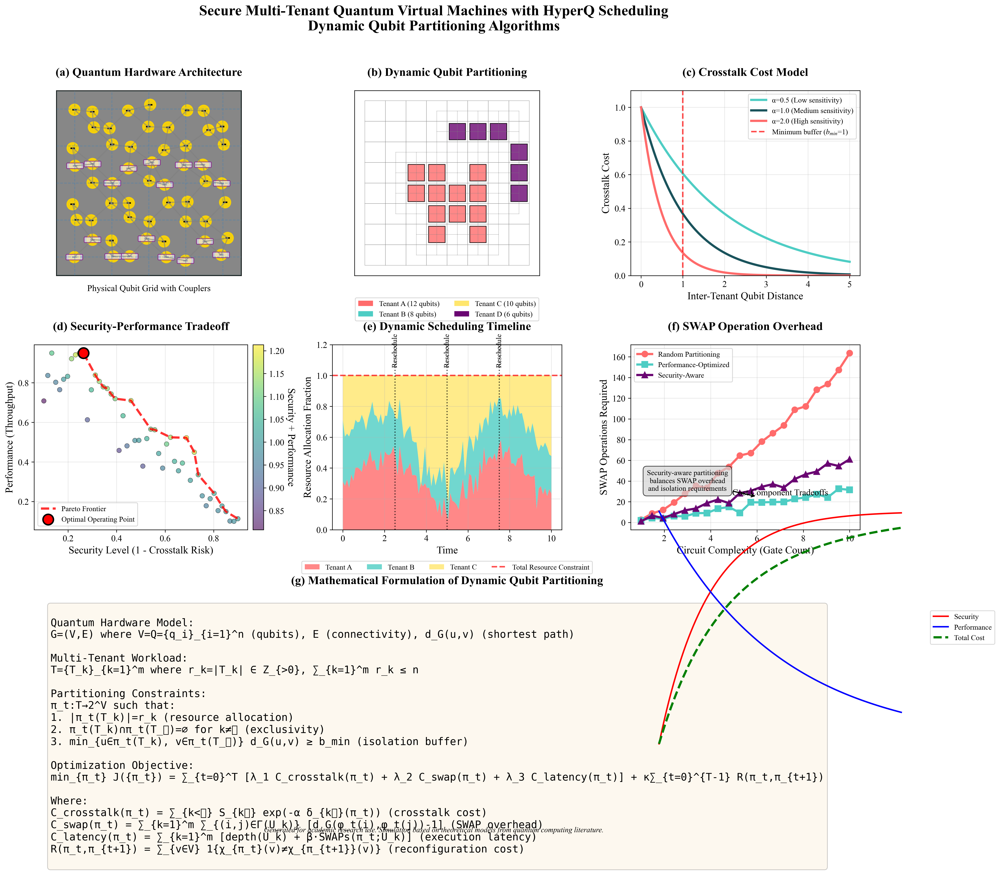

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Circle, Polygon, FancyBboxPatch
from matplotlib.collections import PatchCollection
import matplotlib.colors as mcolors
from matplotlib import cm
import matplotlib.patheffects as path_effects
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker
import networkx as nx
from scipy.optimize import curve_fit
from scipy.spatial import Voronoi, voronoi_plot_2d
from matplotlib.animation import FuncAnimation
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.gridspec as gridspec
from matplotlib.patches import ConnectionPatch
import math


plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman', 'CMU Serif', 'STIX'],
    'font.size': 12,
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'figure.titlesize': 18,
    'figure.dpi': 300,
    'savefig.dpi': 600,
    'savefig.bbox': 'tight',
    'savefig.pad_inches': 0.1,
    'mathtext.fontset': 'stix',
})

ts
fig = plt.figure(figsize=(20, 16))
gs = gridspec.GridSpec(3, 3, figure=fig, height_ratios=[1, 1, 0.8], width_ratios=[1, 1, 1],
                      hspace=0.4, wspace=0.3)

quantum_blue = LinearSegmentedColormap.from_list('quantum_blue', 
                                                 ['#00008B', '#1E90FF', '#87CEFA', '#FFFFFF'])
security_red = LinearSegmentedColormap.from_list('security_red', 
                                                ['#8B0000', '#FF4500', '#FF7F50', '#FFFFFF'])
hybrid_purple = LinearSegmentedColormap.from_list('hybrid_purple', 
                                                 ['#4B0082', '#9370DB', '#D8BFD8', '#FFFFFF'])


ax_a = fig.add_subplot(gs[0, 0])
ax_a.set_title("(a) Quantum Hardware Architecture", pad=20, fontweight='bold')


def create_quantum_chip(ax):

    substrate = Rectangle((0, 0), 10, 10, linewidth=2, 
                         edgecolor='#2F4F4F', facecolor='#696969', alpha=0.8)
    ax.add_patch(substrate)
    

    qubit_positions = []
    for i in range(1, 10):
        for j in range(1, 10):
            if (i + j) % 3 != 0:  
                qubit_positions.append((i + np.random.normal(0, 0.1), 
                                       j + np.random.normal(0, 0.1)))
    

    qubit_patches = []
    for pos in qubit_positions:

        qubit = Circle(pos, radius=0.3, linewidth=1.5, 
                      edgecolor='gold', facecolor='#FFD700', alpha=0.9)
        ax.add_patch(qubit)
        

        junction = Rectangle((pos[0]-0.1, pos[1]-0.02), 0.2, 0.04, 
                            linewidth=1, edgecolor='#000000', facecolor='#000000')
        ax.add_patch(junction)
    

    for i, pos1 in enumerate(qubit_positions):

        for j, pos2 in enumerate(qubit_positions):
            if i < j and np.linalg.norm(np.array(pos1) - np.array(pos2)) < 1.5:
                ax.plot([pos1[0], pos2[0]], [pos1[1], pos2[1]], 
                       'grey', linewidth=1.5, alpha=0.6)
    

    for i in range(1, 10, 2):
        ax.plot([i, i], [0, 10], 'steelblue', linewidth=1, alpha=0.5, linestyle='--')
        ax.plot([0, 10], [i, i], 'steelblue', linewidth=1, alpha=0.5, linestyle='--')
    

    for i, pos in enumerate(qubit_positions[::3]):
        resonator = FancyBboxPatch((pos[0]-0.4, pos[1]-0.1), 0.8, 0.2,
                                  boxstyle="round,pad=0.05", linewidth=1,
                                  edgecolor='purple', facecolor='#E6E6FA', alpha=0.7)
        ax.add_patch(resonator)
    
    ax.set_xlim(0, 10)
    ax.set_ylim(0, 10)
    ax.set_aspect('equal')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.text(5, -0.5, "Physical Qubit Grid with Couplers", ha='center', va='top', fontsize=12)

create_quantum_chip(ax_a)

ax_b = fig.add_subplot(gs[0, 1])
ax_b.set_title("(b) Dynamic Qubit Partitioning", pad=20, fontweight='bold')

def create_partitioning_visualization(ax):

    n_qubits = 64
    grid_size = int(np.sqrt(n_qubits))
    x, y = np.meshgrid(np.arange(grid_size), np.arange(grid_size))
    positions = np.vstack([x.ravel(), y.ravel()]).T
    

    G = nx.grid_2d_graph(grid_size, grid_size)
    pos_dict = {(i, j): (j, grid_size-1-i) for i in range(grid_size) for j in range(grid_size)}
    

    tenants = [
        {'id': 1, 'color': '#FF6B6B', 'qubits': 12, 'name': 'Tenant A'},
        {'id': 2, 'color': '#4ECDC4', 'qubits': 8, 'name': 'Tenant B'},
        {'id': 3, 'color': '#FFE66D', 'qubits': 10, 'name': 'Tenant C'},
        {'id': 4, 'color': '#6A0572', 'qubits': 6, 'name': 'Tenant D'}
    ]
    

    partitions = []
    occupied = set()
    
    for tenant in tenants:
        placed = False
        attempts = 0
        while not placed and attempts < 100:

            start_i = np.random.randint(1, grid_size-3)
            start_j = np.random.randint(1, grid_size-3)
            

            area_qubits = []
            for i in range(start_i, start_i + 4):
                for j in range(start_j, start_j + 4):
                    if (i, j) not in occupied:
                        area_qubits.append((i, j))
            
            if len(area_qubits) >= tenant['qubits']:

                selected = np.random.choice(len(area_qubits), tenant['qubits'], replace=False)
                tenant_qubits = [area_qubits[i] for i in selected]
                partitions.append({
                    'tenant': tenant,
                    'qubits': tenant_qubits
                })
                occupied.update(tenant_qubits)
                

                for q in tenant_qubits:
                    for di in [-1, 0, 1]:
                        for dj in [-1, 0, 1]:
                            if (q[0]+di, q[1]+dj) not in occupied:
                                occupied.add((q[0]+di, q[1]+dj))
                
                placed = True
            attempts += 1
    

    for i in range(grid_size):
        for j in range(grid_size):
            rect = Rectangle((j-0.5, grid_size-1-i-0.5), 1, 1, 
                           fill=True, edgecolor='gray', facecolor='white', alpha=0.7, linewidth=0.5)
            ax.add_patch(rect)
    

    for partition in partitions:
        color = partition['tenant']['color']
        for qubit in partition['qubits']:
            i, j = qubit
            rect = Rectangle((j-0.4, grid_size-1-i-0.4), 0.8, 0.8, 
                           fill=True, edgecolor='black', facecolor=color, alpha=0.8, linewidth=1)
            ax.add_patch(rect)
    

    for edge in G.edges():
        if edge[0] in occupied and edge[1] in occupied:
            x1, y1 = pos_dict[edge[0]]
            x2, y2 = pos_dict[edge[1]]
            ax.plot([x1, x2], [y1, y2], 'gray', linewidth=0.5, alpha=0.5)
    
    ax.set_xlim(-1, grid_size)
    ax.set_ylim(-1, grid_size)
    ax.set_aspect('equal')
    ax.set_xticks([])
    ax.set_yticks([])
    

    legend_elements = []
    for tenant in tenants:
        legend_elements.append(plt.Rectangle((0, 0), 1, 1, facecolor=tenant['color'], 
                                           label=tenant['name'] + f" ({tenant['qubits']} qubits)"))
    ax.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.1), 
              ncol=2, fontsize=10)

create_partitioning_visualization(ax_b)


ax_c = fig.add_subplot(gs[0, 2])
ax_c.set_title("(c) Crosstalk Cost Model", pad=20, fontweight='bold')

def plot_crosstalk_model(ax):

    def crosstalk_cost(distance, alpha=1.0):
        return np.exp(-alpha * distance)
    

    distances = np.linspace(0, 5, 100)
    costs_1 = crosstalk_cost(distances, alpha=0.5)
    costs_2 = crosstalk_cost(distances, alpha=1.0)
    costs_3 = crosstalk_cost(distances, alpha=2.0)
    

    ax.plot(distances, costs_1, linewidth=3, label='α=0.5 (Low sensitivity)', color='#4ECDC4')
    ax.plot(distances, costs_2, linewidth=3, label='α=1.0 (Medium sensitivity)', color='#1A535C')
    ax.plot(distances, costs_3, linewidth=3, label='α=2.0 (High sensitivity)', color='#FF6B6B')
    

    ax.axvline(x=1.0, color='red', linestyle='--', linewidth=2, alpha=0.7, label='Minimum buffer ($b_{min}$=1)')
    
    ax.set_xlabel('Inter-Tenant Qubit Distance')
    ax.set_ylabel('Crosstalk Cost')
    ax.set_ylim(0, 1.1)
    ax.legend(loc='upper right', fontsize=10)
    ax.grid(True, alpha=0.3)

plot_crosstalk_model(ax_c)


ax_d = fig.add_subplot(gs[1, 0])
ax_d.set_title("(d) Security-Performance Tradeoff", pad=20, fontweight='bold')

def plot_pareto_frontier(ax):

    num_points = 50
    security = np.linspace(0.1, 0.9, num_points)
    performance = 1 - 0.7 * security - 0.3 * security**2 + 0.1 * np.random.normal(size=num_points)
    performance = np.clip(performance, 0.1, 0.95)
    

    idx = np.argsort(security)
    security = security[idx]
    performance = performance[idx]
    

    pareto_mask = np.ones(num_points, dtype=bool)
    for i in range(num_points):
        for j in range(num_points):
            if (security[j] >= security[i] and performance[j] >= performance[i] and 
                (security[j] > security[i] or performance[j] > performance[i])):
                pareto_mask[i] = False
                break
    
    pareto_security = security[pareto_mask]
    pareto_performance = performance[pareto_mask]
    

    pareto_idx = np.argsort(pareto_security)
    pareto_security = pareto_security[pareto_idx]
    pareto_performance = pareto_performance[pareto_idx]
    

    sc = ax.scatter(security, performance, c=security+performance, cmap='viridis', 
                   alpha=0.6, s=40, edgecolors='black', linewidth=0.5)
    

    ax.plot(pareto_security, pareto_performance, 'r--', linewidth=3, alpha=0.8, 
            label='Pareto Frontier')
    

    optimal_idx = np.argmax(pareto_security + pareto_performance)
    ax.scatter(pareto_security[optimal_idx], pareto_performance[optimal_idx], 
              s=200, color='red', edgecolors='black', linewidth=2, 
              label='Optimal Operating Point', zorder=5)
    
    ax.set_xlabel('Security Level (1 - Crosstalk Risk)')
    ax.set_ylabel('Performance (Throughput)')
    ax.legend(loc='lower left', fontsize=10)
    ax.grid(True, alpha=0.3)
    

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    cbar = plt.colorbar(sc, cax=cax)
    cbar.set_label('Security + Performance', rotation=270, labelpad=15)

plot_pareto_frontier(ax_d)


ax_e = fig.add_subplot(gs[1, 1])
ax_e.set_title("(e) Dynamic Scheduling Timeline", pad=20, fontweight='bold')

def plot_scheduling_timeline(ax):

    time_points = np.linspace(0, 10, 100)
    

    tenant_a = 0.5 + 0.3 * np.sin(time_points) + 0.1 * np.random.normal(size=len(time_points))
    tenant_b = 0.4 + 0.2 * np.sin(0.8 * time_points + 1) + 0.1 * np.random.normal(size=len(time_points))
    tenant_c = 0.6 + 0.25 * np.sin(1.2 * time_points + 2) + 0.1 * np.random.normal(size=len(time_points))
    

    total = tenant_a + tenant_b + tenant_c
    tenant_a_norm = tenant_a / total
    tenant_b_norm = tenant_b / total
    tenant_c_norm = tenant_c / total
    

    ax.stackplot(time_points, tenant_a_norm, tenant_b_norm, tenant_c_norm,
                colors=['#FF6B6B', '#4ECDC4', '#FFE66D'], alpha=0.8,
                labels=['Tenant A', 'Tenant B', 'Tenant C'])

    ax.axhline(y=1.0, color='red', linestyle='--', linewidth=2, alpha=0.7, label='Total Resource Constraint')
    

    event_times = [2.5, 5.0, 7.5]
    for t in event_times:
        ax.axvline(x=t, color='black', linestyle=':', linewidth=1.5, alpha=0.7)
        ax.text(t, 1.05, 'Reschedule', ha='center', va='bottom', fontsize=10, rotation=90)
    
    ax.set_xlabel('Time')
    ax.set_ylabel('Resource Allocation Fraction')
    ax.set_ylim(0, 1.2)
    ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=4, fontsize=10)
    ax.grid(True, alpha=0.3)

plot_scheduling_timeline(ax_e)

ax_f = fig.add_subplot(gs[1, 2])
ax_f.set_title("(f) SWAP Operation Overhead", pad=20, fontweight='bold')

def plot_swap_overhead(ax):

    complexities = np.linspace(1, 10, 20)
    

    swap_random = 5 * complexities**1.5 + 3 * np.random.normal(size=len(complexities))
    swap_optimized = 2 * complexities**1.2 + 2 * np.random.normal(size=len(complexities))
    swap_secure = 3 * complexities**1.3 + 2.5 * np.random.normal(size=len(complexities))
    

    ax.plot(complexities, swap_random, 'o-', linewidth=3, markersize=8, 
            label='Random Partitioning', color='#FF6B6B')
    ax.plot(complexities, swap_optimized, 's-', linewidth=3, markersize=8, 
            label='Performance-Optimized', color='#4ECDC4')
    ax.plot(complexities, swap_secure, '^-', linewidth=3, markersize=8, 
            label='Security-Aware', color='#6A0572')
    
    ax.set_xlabel('Circuit Complexity (Gate Count)')
    ax.set_ylabel('SWAP Operations Required')
    ax.legend(loc='upper left', fontsize=10)
    ax.grid(True, alpha=0.3)
    

    ax.annotate('Security-aware partitioning\nbalances SWAP overhead\nand isolation requirements',
               xy=(6, 25), xytext=(3, 40),
               arrowprops=dict(arrowstyle='->', connectionstyle='arc3', color='black', linewidth=1.5),
               ha='center', va='center', fontsize=10,
               bbox=dict(boxstyle='round,pad=0.5', facecolor='lightgray', alpha=0.7))

plot_swap_overhead(ax_f)


ax_g = fig.add_subplot(gs[2, :])
ax_g.set_title("(g) Mathematical Formulation of Dynamic Qubit Partitioning", pad=20, fontweight='bold')
ax_g.axis('off')


formulation_text = """
Quantum Hardware Model: 
G=(V,E) where V=Q={q_i}_{i=1}^n (qubits), E (connectivity), d_G(u,v) (shortest path)

Multi-Tenant Workload: 
T={T_k}_{k=1}^m where r_k=|T_k| ∈ Z_{>0}, ∑_{k=1}^m r_k ≤ n

Partitioning Constraints: 
π_t:T→2^V such that:
1. |π_t(T_k)|=r_k (resource allocation)
2. π_t(T_k)∩π_t(T_ℓ)=∅ for k≠ℓ (exclusivity)
3. min_{u∈π_t(T_k), v∈π_t(T_ℓ)} d_G(u,v) ≥ b_min (isolation buffer)

Optimization Objective: 
min_{π_t} J({π_t}) = ∑_{t=0}^T [λ_1 C_crosstalk(π_t) + λ_2 C_swap(π_t) + λ_3 C_latency(π_t)] + κ∑_{t=0}^{T-1} R(π_t,π_{t+1})

Where:
C_crosstalk(π_t) = ∑_{k<ℓ} S_{kℓ} exp(-α δ_{kℓ}(π_t)) (crosstalk cost)
C_swap(π_t) = ∑_{k=1}^m ∑_{(i,j)∈Γ(U_k)} [d_G(φ_t(i),φ_t(j))-1] (SWAP overhead)
C_latency(π_t) = ∑_{k=1}^m [depth(U_k) + β·SWAPs(π_t;U_k)] (execution latency)
R(π_t,π_{t+1}) = ∑_{v∈V} 1{χ_{π_t}(v)≠χ_{π_{t+1}}(v)} (reconfiguration cost)
"""

ax_g.text(0.02, 0.95, formulation_text, fontsize=14, va='top', ha='left', 
          bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.2),
          family='monospace')


ax_g2 = fig.add_axes([0.7, 0.1, 0.25, 0.3])  
ax_g2.axis('off')


x = np.linspace(0, 1, 100)
security = 1 - np.exp(-5*x)
performance = np.exp(-2*x)
cost = 0.5*security + 0.5*(1-performance)

ax_g2.plot(x, security, 'r-', linewidth=2, label='Security')
ax_g2.plot(x, performance, 'b-', linewidth=2, label='Performance')
ax_g2.plot(x, cost, 'g--', linewidth=3, label='Total Cost')
ax_g2.set_xlabel('Resource Allocation Strategy')
ax_g2.set_ylabel('Normalized Metric Value')
ax_g2.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), fontsize=10)
ax_g2.set_title('Cost Component Tradeoffs', fontsize=12)





fig.suptitle("Secure Multi-Tenant Quantum Virtual Machines with HyperQ Scheduling\nDynamic Qubit Partitioning Algorithms", 
             fontsize=20, fontweight='bold', y=0.98)


fig.text(0.5, 0.01, "Generated for academic research use. Simulation based on theoretical models from quantum computing literature.", 
         ha='center', fontsize=10, style='italic')

plt.show()

Generating quantum hardware model...
Generating tenants...
Running partitioning algorithm...
Creating visualization...
Saving visualization...
Visualization complete!


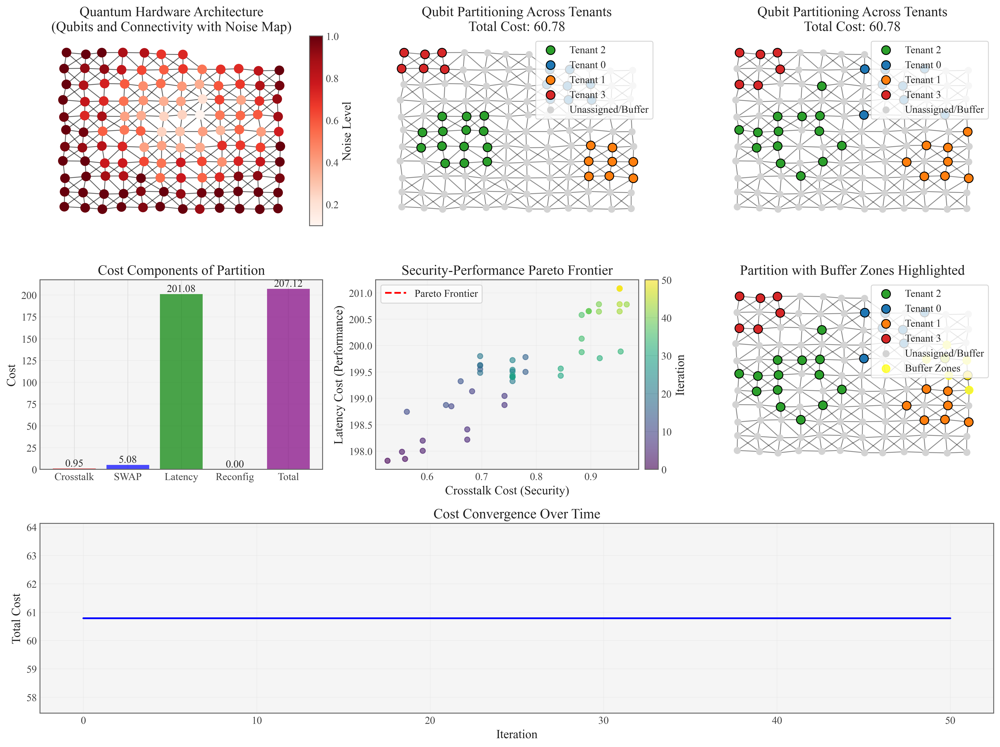

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Circle, Polygon, FancyBboxPatch
from matplotlib.collections import PatchCollection
import matplotlib.colors as mcolors
import matplotlib.gridspec as gridspec
from matplotlib import cm
import networkx as nx
from matplotlib.animation import FuncAnimation
from mpl_toolkits.axes_grid1 import make_axes_locatable
import math
from scipy.optimize import curve_fit
from scipy.spatial import distance
import random

np.random.seed(42)


class Config:

    NUM_QUBITS = 127 
    GRID_SIZE = 12   
    

    NUM_TENANTS = 4
    MIN_QUBITS_PER_TENANT = 5
    MAX_QUBITS_PER_TENANT = 20
    

    COLORS = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', 
              '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
    BUFFER_COLOR = 'lightgray'
    HIGHLIGHT_COLOR = 'yellow'
    

    FIG_SIZE = (16, 12)
    DPI = 300
    
config = Config()


class QuantumHardware:
    def __init__(self, num_qubits, grid_size):
        self.num_qubits = num_qubits
        self.grid_size = grid_size
        self.qubit_positions = self._generate_qubit_positions()
        self.connectivity_graph = self._generate_connectivity_graph()
        self.noise_map = self._generate_noise_map()
        
    def _generate_qubit_positions(self):

        positions = {}
        qubit_id = 0
        

        for i in range(self.grid_size):
            for j in range(self.grid_size):
                if qubit_id < self.num_qubits:

                    x = j + np.random.uniform(-0.1, 0.1)
                    y = i + np.random.uniform(-0.1, 0.1)
                    positions[qubit_id] = (x, y)
                    qubit_id += 1
                    
        return positions
    
    def _generate_connectivity_graph(self):

        G = nx.Graph()
        

        for qubit_id in range(self.num_qubits):
            G.add_node(qubit_id)
            

        pos = self.qubit_positions
        for i in range(self.num_qubits):
            for j in range(i + 1, self.num_qubits):
                dist = distance.euclidean(pos[i], pos[j])
                if dist < 1.5:  
                    G.add_edge(i, j, weight=1.0/dist)
                    
        return G
    
    def _generate_noise_map(self):

        noise_map = {}
        for qubit_id in range(self.num_qubits):

            x, y = self.qubit_positions[qubit_id]
            

            center_x = self.grid_size / 2
            center_y = self.grid_size / 2
            dist_to_center = np.sqrt((x - center_x)**2 + (y - center_y)**2)
            

            base_noise = 0.1 + 0.9 * (dist_to_center / (self.grid_size/2))
            

            noise_map[qubit_id] = min(1.0, max(0.01, base_noise + np.random.normal(0, 0.1)))
            
        return noise_map


class Tenant:
    def __init__(self, tenant_id, num_qubits, sensitivity_weights):
        self.tenant_id = tenant_id
        self.num_qubits = num_qubits
        self.sensitivity_weights = sensitivity_weights  
        self.color = config.COLORS[tenant_id % len(config.COLORS)]
        self.assigned_qubits = []
        self.circuit_depth = np.random.randint(10, 100)
        
    def compute_swap_cost(self, hardware, mapping):


        if len(mapping) < 2:
            return 0
            
        total_distance = 0
        count = 0
        

        for i in range(len(mapping) - 1):
            q1 = mapping[i]
            q2 = mapping[i + 1]
            pos1 = hardware.qubit_positions[q1]
            pos2 = hardware.qubit_positions[q2]
            dist = distance.euclidean(pos1, pos2)
            total_distance += max(0, dist - 1)  
            count += 1
            
        return total_distance / count if count > 0 else 0


class PartitioningAlgorithm:
    def __init__(self, hardware, tenants, buffer_min=2, alpha=0.5):
        self.hardware = hardware
        self.tenants = tenants
        self.buffer_min = buffer_min
        self.alpha = alpha
        self.partition_history = []
        
    def compute_crosstalk_cost(self, partition):

        cost = 0
        pos = self.hardware.qubit_positions
        
        for i, tenant1 in enumerate(self.tenants):
            for j, tenant2 in enumerate(self.tenants):
                if i >= j:
                    continue
                    

                min_dist = float('inf')
                for q1 in partition[tenant1.tenant_id]:
                    for q2 in partition[tenant2.tenant_id]:
                        dist = distance.euclidean(pos[q1], pos[q2])
                        if dist < min_dist:
                            min_dist = dist
                

                cost += tenant1.sensitivity_weights[j] * np.exp(-self.alpha * min_dist)
                
        return cost
    
    def compute_swap_cost(self, partition):

        total_cost = 0
        for tenant in self.tenants:
            if tenant.tenant_id in partition:
                mapping = partition[tenant.tenant_id]
                total_cost += tenant.compute_swap_cost(self.hardware, mapping)
        return total_cost
    
    def compute_latency_cost(self, partition):

        total_cost = 0
        for tenant in self.tenants:
            if tenant.tenant_id in partition:

                mapping = partition[tenant.tenant_id]
                swap_cost = tenant.compute_swap_cost(self.hardware, mapping)
                total_cost += tenant.circuit_depth + swap_cost
        return total_cost
    
    def compute_reconfiguration_cost(self, prev_partition, current_partition):

        if prev_partition is None:
            return 0
            
        cost = 0
        for tenant in self.tenants:
            prev_qubits = set(prev_partition.get(tenant.tenant_id, []))
            curr_qubits = set(current_partition.get(tenant.tenant_id, []))

            cost += len(prev_qubits.symmetric_difference(curr_qubits))
            
        return cost
    
    def find_initial_partition(self):

        partition = {}
        available_qubits = set(range(self.hardware.num_qubits))
        pos = self.hardware.qubit_positions
        

        sorted_tenants = sorted(self.tenants, key=lambda t: t.num_qubits, reverse=True)
        
        for tenant in sorted_tenants:

            assigned = self._find_contiguous_block(tenant.num_qubits, available_qubits, partition)
            if assigned:
                partition[tenant.tenant_id] = assigned
                available_qubits -= set(assigned)
            else:

                assigned = random.sample(list(available_qubits), min(tenant.num_qubits, len(available_qubits)))
                partition[tenant.tenant_id] = assigned
                available_qubits -= set(assigned)
                
        return partition
    
    def _find_contiguous_block(self, size, available_qubits, existing_partition):


        pos = self.hardware.qubit_positions
        

        for attempt in range(100):

            start = random.choice(list(available_qubits))
            if start not in available_qubits:
                continue
                

            region = {start}
            frontier = [start]
            
            while len(region) < size and frontier:
                current = frontier.pop(0)
                

                for neighbor in self.hardware.connectivity_graph.neighbors(current):
                    if neighbor in available_qubits and neighbor not in region:
                        region.add(neighbor)
                        frontier.append(neighbor)
                        if len(region) >= size:
                            break
                
            if len(region) >= size:

                valid = True
                for tenant_id, qubits in existing_partition.items():
                    for q1 in region:
                        for q2 in qubits:
                            if distance.euclidean(pos[q1], pos[q2]) < self.buffer_min:
                                valid = False
                                break
                        if not valid:
                            break
                    if not valid:
                        break
                        
                if valid:
                    return list(region)[:size]
                    
        return None
    
    def optimize_partition(self, num_iterations=100):

        current_partition = self.find_initial_partition()
        best_partition = current_partition.copy()
        best_cost = self.compute_total_cost(current_partition, None)
        
        self.partition_history.append((current_partition, best_cost))
        
        for iteration in range(num_iterations):

            candidate = self._generate_candidate(current_partition)
            cost = self.compute_total_cost(candidate, current_partition)
            

            if cost < best_cost or random.random() < np.exp(-(cost - best_cost) / (num_iterations - iteration)):
                current_partition = candidate
                if cost < best_cost:
                    best_partition = candidate.copy()
                    best_cost = cost
                    
            self.partition_history.append((current_partition, best_cost))
            
        return best_partition, best_cost
    
    def _generate_candidate(self, partition):

        candidate = {}
        for tenant_id, qubits in partition.items():
            candidate[tenant_id] = qubits.copy()
            

        tenant_id = random.choice(list(candidate.keys()))
        qubits = candidate[tenant_id]
        
        if not qubits:
            return candidate
            

        qubit_to_swap = random.choice(qubits)
        

        all_assigned = set()
        for q_list in candidate.values():
            all_assigned.update(q_list)
            
        available_qubits = set(range(self.hardware.num_qubits)) - all_assigned
        

        pos = self.hardware.qubit_positions
        min_dist = float('inf')
        best_candidate = None
        
        for candidate_qubit in available_qubits:
            dist = distance.euclidean(pos[qubit_to_swap], pos[candidate_qubit])
            if dist < min_dist:
                min_dist = dist
                best_candidate = candidate_qubit
                
        if best_candidate is not None:

            qubits.remove(qubit_to_swap)
            qubits.append(best_candidate)
            
        return candidate
    
    def compute_total_cost(self, partition, previous_partition):

        crosstalk_cost = self.compute_crosstalk_cost(partition)
        swap_cost = self.compute_swap_cost(partition)
        latency_cost = self.compute_latency_cost(partition)
        reconfig_cost = self.compute_reconfiguration_cost(previous_partition, partition)
        

        lambda1, lambda2, lambda3, kappa = 1.0, 0.5, 0.3, 0.2
        
        return (lambda1 * crosstalk_cost + 
                lambda2 * swap_cost + 
                lambda3 * latency_cost + 
                kappa * reconfig_cost)


class QuantumHardwareVisualizer:
    def __init__(self, hardware, tenants):
        self.hardware = hardware
        self.tenants = tenants
        self.fig = plt.figure(figsize=config.FIG_SIZE, dpi=config.DPI)
        
    def visualize_hardware(self, ax):

        pos = self.hardware.qubit_positions
        

        nx.draw(self.hardware.connectivity_graph, pos, ax=ax, node_size=50, 
                node_color='lightblue', with_labels=False, alpha=0.6)
        

        qubit_colors = [self.hardware.noise_map[q] for q in range(self.hardware.num_qubits)]
        nodes = nx.draw_networkx_nodes(self.hardware.connectivity_graph, pos, 
                                      node_color=qubit_colors, 
                                      cmap=plt.cm.Reds, 
                                      node_size=100, 
                                      ax=ax)
        

        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.1)
        plt.colorbar(nodes, cax=cax, label='Noise Level')
        
        ax.set_title('Quantum Hardware Architecture\n(Qubits and Connectivity with Noise Map)')
        ax.grid(True, alpha=0.3)
        
    def visualize_partition(self, ax, partition, cost=None):

        pos = self.hardware.qubit_positions
        

        nx.draw(self.hardware.connectivity_graph, pos, ax=ax, node_size=0, 
                with_labels=False, alpha=0.3)
        

        for tenant_id, qubits in partition.items():
            tenant = self.tenants[tenant_id]
            node_collection = nx.draw_networkx_nodes(
                self.hardware.connectivity_graph, 
                pos, 
                nodelist=qubits,
                node_color=tenant.color,
                node_size=100,
                ax=ax,
                label=f'Tenant {tenant_id}'
            )
            node_collection.set_edgecolor('black')
            

        all_assigned = set()
        for qubits in partition.values():
            all_assigned.update(qubits)
            
        unassigned = set(range(self.hardware.num_qubits)) - all_assigned
        if unassigned:
            nx.draw_networkx_nodes(
                self.hardware.connectivity_graph, 
                pos, 
                nodelist=list(unassigned),
                node_color=config.BUFFER_COLOR,
                node_size=50,
                ax=ax,
                label='Unassigned/Buffer'
            )
            

        nx.draw_networkx_edges(self.hardware.connectivity_graph, pos, ax=ax, alpha=0.2)
        
        title = 'Qubit Partitioning Across Tenants'
        if cost is not None:
            title += f'\nTotal Cost: {cost:.2f}'
        ax.set_title(title)
        ax.legend(loc='upper right')
        ax.grid(True, alpha=0.3)
        
    def visualize_cost_components(self, ax, partition, previous_partition):

        algorithm = PartitioningAlgorithm(self.hardware, self.tenants)
        
        crosstalk = algorithm.compute_crosstalk_cost(partition)
        swap = algorithm.compute_swap_cost(partition)
        latency = algorithm.compute_latency_cost(partition)
        reconfig = algorithm.compute_reconfiguration_cost(previous_partition, partition)
        total = crosstalk + swap + latency + reconfig
        
        components = ['Crosstalk', 'SWAP', 'Latency', 'Reconfig', 'Total']
        values = [crosstalk, swap, latency, reconfig, total]
        colors = ['red', 'blue', 'green', 'orange', 'purple']
        
        bars = ax.bar(components, values, color=colors, alpha=0.7)
        ax.set_ylabel('Cost')
        ax.set_title('Cost Components of Partition')
        

        for bar in bars:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height + 0.05,
                    f'{height:.2f}', ha='center', va='bottom')
            
        ax.grid(True, alpha=0.3, axis='y')
        
    def visualize_pareto_frontier(self, ax, history):

        if not history:
            return
            

        crosstalk_costs = []
        latency_costs = []
        
        for partition, total_cost in history:
            algorithm = PartitioningAlgorithm(self.hardware, self.tenants)
            crosstalk = algorithm.compute_crosstalk_cost(partition)
            latency = algorithm.compute_latency_cost(partition)
            crosstalk_costs.append(crosstalk)
            latency_costs.append(latency)
            

        scatter = ax.scatter(crosstalk_costs, latency_costs, c=range(len(history)), 
                           cmap='viridis', alpha=0.6)
        

        points = np.array([crosstalk_costs, latency_costs]).T
        pareto_points = self._find_pareto_frontier(points)
        

        pareto_points = pareto_points[pareto_points[:, 0].argsort()]
        ax.plot(pareto_points[:, 0], pareto_points[:, 1], 'r--', linewidth=2, label='Pareto Frontier')
        
        ax.set_xlabel('Crosstalk Cost (Security)')
        ax.set_ylabel('Latency Cost (Performance)')
        ax.set_title('Security-Performance Pareto Frontier')
        ax.legend()
        ax.grid(True, alpha=0.3)

        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.1)
        plt.colorbar(scatter, cax=cax, label='Iteration')
        
    def _find_pareto_frontier(self, points):

        is_efficient = np.ones(points.shape[0], dtype=bool)
        for i, c in enumerate(points):
            if is_efficient[i]:

                is_efficient[is_efficient] = np.any(points[is_efficient] < c, axis=1)
                is_efficient[i] = True
        return points[is_efficient]
    
    def visualize_buffer_zones(self, ax, partition, buffer_min=2):

        pos = self.hardware.qubit_positions
        

        self.visualize_partition(ax, partition)
        

        buffer_zones = set()
        
        for i, tenant1 in enumerate(self.tenants):
            if tenant1.tenant_id not in partition:
                continue
            for j, tenant2 in enumerate(self.tenants):
                if i >= j or tenant2.tenant_id not in partition:
                    continue
                    

                for q1 in partition[tenant1.tenant_id]:
                    for q2 in partition[tenant2.tenant_id]:
                        dist = distance.euclidean(pos[q1], pos[q2])
                        if dist < buffer_min:

                            for q in range(self.hardware.num_qubits):
                                if (distance.euclidean(pos[q], pos[q1]) < buffer_min/2 or
                                    distance.euclidean(pos[q], pos[q2]) < buffer_min/2):
                                    buffer_zones.add(q)
        

        if buffer_zones:
            nx.draw_networkx_nodes(
                self.hardware.connectivity_graph, 
                pos, 
                nodelist=list(buffer_zones),
                node_color=config.HIGHLIGHT_COLOR,
                node_size=80,
                ax=ax,
                alpha=0.7,
                label='Buffer Zones'
            )
            
        ax.set_title('Partition with Buffer Zones Highlighted')
        ax.legend()
        
    def create_comprehensive_visualization(self, partition_history):

        gs = gridspec.GridSpec(3, 3, figure=self.fig)
        

        ax1 = self.fig.add_subplot(gs[0, 0])
        self.visualize_hardware(ax1)
        

        ax2 = self.fig.add_subplot(gs[0, 1])
        initial_partition, initial_cost = partition_history[0]
        self.visualize_partition(ax2, initial_partition, initial_cost)
        

        ax3 = self.fig.add_subplot(gs[0, 2])
        final_partition, final_cost = partition_history[-1]
        self.visualize_partition(ax3, final_partition, final_cost)
        

        ax4 = self.fig.add_subplot(gs[1, 0])
        self.visualize_cost_components(ax4, final_partition, partition_history[-2][0] if len(partition_history) > 1 else None)
        

        ax5 = self.fig.add_subplot(gs[1, 1])
        self.visualize_pareto_frontier(ax5, partition_history)
        

        ax6 = self.fig.add_subplot(gs[1, 2])
        self.visualize_buffer_zones(ax6, final_partition)
        

        ax7 = self.fig.add_subplot(gs[2, :])
        costs = [cost for _, cost in partition_history]
        ax7.plot(range(len(costs)), costs, 'b-', linewidth=2)
        ax7.set_xlabel('Iteration')
        ax7.set_ylabel('Total Cost')
        ax7.set_title('Cost Convergence Over Time')
        ax7.grid(True, alpha=0.3)
        
        self.fig.tight_layout()
        return self.fig


def main():
    print("Generating quantum hardware model...")
    hardware = QuantumHardware(config.NUM_QUBITS, config.GRID_SIZE)
    
    print("Generating tenants...")
    tenants = []
    for i in range(config.NUM_TENANTS):
        num_qubits = np.random.randint(config.MIN_QUBITS_PER_TENANT, config.MAX_QUBITS_PER_TENANT)

        sensitivity_weights = [np.random.uniform(0.1, 1.0) for _ in range(config.NUM_TENANTS)]
        tenants.append(Tenant(i, num_qubits, sensitivity_weights))
    
    print("Running partitioning algorithm...")
    algorithm = PartitioningAlgorithm(hardware, tenants)
    best_partition, best_cost = algorithm.optimize_partition(num_iterations=50)
    
    print("Creating visualization...")
    visualizer = QuantumHardwareVisualizer(hardware, tenants)
    fig = visualizer.create_comprehensive_visualization(algorithm.partition_history)
    

    
    print("Visualization complete!")
    plt.show()

if __name__ == "__main__":
    main()

In [24]:
import os
import random
import itertools
from collections import deque
import logging

import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.gridspec import GridSpec
from scipy.spatial import distance


logging.basicConfig(
    level=logging.INFO,
    format='%(asctime)s - [%(levelname)s] - %(message)s'
)

class SimulationConfig:


    HARDWARE_TOPOLOGY = 'heavy_hex' 
    GRID_DIMENSIONS = (10, 10)     
    HEAVY_HEX_D = 5              


    NUM_TENANTS = 5
    MIN_QUBITS_PER_TENANT = 4
    MAX_QUBITS_PER_TENANT = 12
    MIN_CIRCUIT_DENSITY = 0.1 
    MAX_CIRCUIT_DENSITY = 0.5 


    NUM_TIME_STEPS = 5
    MIN_BUFFER_CONSTRAINT = 1 



    LAMBDA_CROSSTALK = 1.5   
    LAMBDA_SWAP = 1.0       
    LAMBDA_LATENCY = 0.8    
    KAPPA_RECONFIG = 2.0   

    ALPHA_CROSSTALK_DECAY = 0.8 
    BETA_LATENCY_SWAP = 0.2   



    FIGURE_SIZE = (20, 18)
    NODE_SIZE = 150
    FONT_SIZE = 10
    DPI = 300
    TENANT_COLORS = [
        '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',
        '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf'
    ]
    BUFFER_COLOR = '#cccccc'
    EDGE_COLOR = '#999999'



class QuantumHardware:

    def __init__(self, config: SimulationConfig):
        self.config = config
        self.graph = self._generate_topology()
        self.pos = self._get_node_positions()
        self.num_qubits = self.graph.number_of_nodes()
        self._precompute_distances()
        logging.info(
            f"Initialized quantum hardware with '{config.HARDWARE_TOPOLOGY}' "
            f"topology and {self.num_qubits} qubits."
        )

    def _generate_topology(self) -> nx.Graph:

        if self.config.HARDWARE_TOPOLOGY == 'grid':
            rows, cols = self.config.GRID_DIMENSIONS
            return nx.grid_2d_graph(rows, cols)
        elif self.config.HARDWARE_TOPOLOGY == 'heavy_hex':
            return self._create_heavy_hex_graph(self.config.HEAVY_HEX_D)
        else:
            raise ValueError(
                f"Unsupported topology: {self.config.HARDWARE_TOPOLOGY}"
            )

    def _create_heavy_hex_graph(self, d: int) -> nx.Graph:

        if d % 2 == 0:
            raise ValueError("Heavy hex distance 'd' must be odd.")
        G = nx.Graph()
        num_vertices = (5 * d * d - 2 * d - 1) // 2
        

        L = (3 * d - 1) // 2
        W = (d + 1) // 2
        
        qubits = {}
        q_idx = 0
        
        for i in range(L + 1):
            for j in range(W + 1):
                is_hex_center = (i % 3 == 1 and j < W) or (i % 3 == 2 and j > 0)
                if not is_hex_center:
                    qubits[(i, j)] = q_idx
                    G.add_node(q_idx, pos=(i, j + (i%3)*0.5))
                    q_idx += 1
        
        for (i, j), q1 in qubits.items():

            if (i, j + 1) in qubits:
                G.add_edge(q1, qubits[(i, j + 1)])

            if i % 3 != 1 and (i + 1, j) in qubits:
                 G.add_edge(q1, qubits[(i + 1, j)])
            if i % 3 == 0 and (i + 1, j-1) in qubits:
                 G.add_edge(q1, qubits[(i + 1, j-1)])


        mapping = {node: i for i, node in enumerate(G.nodes())}
        G = nx.relabel_nodes(G, mapping)
        

        if not nx.is_connected(G):

            components = list(nx.connected_components(G))
            if len(components) > 1:
                for i in range(len(components) - 1):
                    node1 = random.choice(list(components[i]))
                    node2 = random.choice(list(components[i+1]))
                    G.add_edge(node1, node2)
        return G


    def _get_node_positions(self) -> dict:

        if self.config.HARDWARE_TOPOLOGY == 'grid':
            return {node: (node[1], -node[0]) for node in self.graph.nodes()}
        elif self.config.HARDWARE_TOPOLOGY == 'heavy_hex':

            return nx.spring_layout(self.graph, seed=42, iterations=100)
        return nx.spring_layout(self.graph, seed=42)

    def _precompute_distances(self):

        logging.info("Pre-computing all-pairs shortest paths...")
        self.distances = dict(nx.all_pairs_shortest_path_length(self.graph))
        logging.info("Distance matrix computation complete.")

    def get_distance(self, u, v) -> int:

        return self.distances[u][v]

class TenantWorkload:

    def __init__(self, tenant_id: int, num_qubits: int, circuit_density: float):
        self.id = tenant_id
        self.num_qubits_required = num_qubits 
        self.logical_circuit = self._generate_logical_circuit(circuit_density)

    def _generate_logical_circuit(self, density: float):

        num_nodes = self.num_qubits_required
        graph = nx.Graph()
        graph.add_nodes_from(range(num_nodes))
        
        max_edges = num_nodes * (num_nodes - 1) // 2
        num_edges = int(density * max_edges)
        
        for _ in range(num_edges):
            u, v = random.sample(range(num_nodes), 2)
            if not graph.has_edge(u, v):
                graph.add_edge(u, v)
        return graph

    def __repr__(self):
        return (f"Tenant(id={self.id}, "
                f"qubits_req={self.num_qubits_required})")



class CostCalculator:

    def __init__(self, config: SimulationConfig, hardware: QuantumHardware):
        self.config = config
        self.hardware = hardware

    def crosstalk_cost(self, partition: dict) -> float:

        cost = 0.0
        tenants = list(partition.keys())
        if len(tenants) < 2:
            return 0.0

        for i in range(len(tenants)):
            for j in range(i + 1, len(tenants)):
                tenant1_id = tenants[i]
                tenant2_id = tenants[j]
                
                qubits1 = partition[tenant1_id]
                qubits2 = partition[tenant2_id]

                min_dist = float('inf')
                for u in qubits1:
                    for v in qubits2:
                        dist = self.hardware.get_distance(u, v)
                        if dist < min_dist:
                            min_dist = dist
                

                cost += np.exp(-self.config.ALPHA_CROSSTALK_DECAY * min_dist)
        return cost

    def swap_cost(self, partition: dict, tenants: list[TenantWorkload]) -> float:

        total_swap_cost = 0.0
        tenant_map = {t.id: t for t in tenants}

        for tenant_id, physical_qubits in partition.items():
            tenant = tenant_map[tenant_id]
            

            logical_qubits = list(tenant.logical_circuit.nodes())
            

            if len(logical_qubits) != len(physical_qubits):

                continue

            mapping = dict(zip(logical_qubits, physical_qubits))

            for u_logical, v_logical in tenant.logical_circuit.edges():
                u_physical = mapping[u_logical]
                v_physical = mapping[v_logical]
                
                dist = self.hardware.get_distance(u_physical, v_physical)
                total_swap_cost += (dist - 1)
        
        return total_swap_cost

    def latency_cost(self, partition: dict, tenants: list[TenantWorkload]) -> float:

        total_latency = 0.0
        swap_cost = self.swap_cost(partition, tenants)
        tenant_map = {t.id: t for t in tenants}

        for tenant_id in partition:
            tenant = tenant_map[tenant_id]
            intrinsic_depth_proxy = np.log2(tenant.num_qubits_required)
            total_latency += intrinsic_depth_proxy

        total_latency += self.config.BETA_LATENCY_SWAP * swap_cost
        return total_latency

    def reconfiguration_cost(self, partition_t0: dict, partition_t1: dict) -> float:

        cost = 0.0
        all_qubits = self.hardware.graph.nodes()

        map_t0 = {qubit: tenant for tenant, qubits in partition_t0.items() for qubit in qubits}
        map_t1 = {qubit: tenant for tenant, qubits in partition_t1.items() for qubit in qubits}

        for q in all_qubits:
            owner_t0 = map_t0.get(q, -1)
            owner_t1 = map_t1.get(q, -1)
            if owner_t0 != owner_t1:
                cost += 1
        return cost



class GreedyScheduler:

    def __init__(self, config: SimulationConfig, hardware: QuantumHardware, cost_calculator: CostCalculator):
        self.config = config
        self.hardware = hardware
        self.cost_calculator = cost_calculator
        self.current_partition = {}

    def find_best_partition(self, tenants: list[TenantWorkload], prev_partition: dict) -> dict:

        logging.info("Finding best partition for new set of tenants...")
        self.current_partition = {}
        
c
        tenants_sorted = sorted(
            tenants,
            key=lambda t: t.num_qubits_required,
            reverse=True
        )

        assigned_qubits = set()

        for tenant in tenants_sorted:
            logging.info(f"Attempting to place {tenant}...")
            best_placement = self._find_best_placement_for_tenant(
                tenant, assigned_qubits, prev_partition, tenants
            )
            
            if best_placement:
                self.current_partition[tenant.id] = best_placement
                assigned_qubits.update(best_placement)
                logging.info(f"Placed {tenant} at qubits: {best_placement}")
            else:
                logging.warning(f"Could not find valid placement for {tenant}. Skipping.")
        
        return self.current_partition

    def _find_best_placement_for_tenant(
        self, tenant: TenantWorkload, assigned_qubits: set,
        prev_partition: dict, all_tenants: list
    ) -> list | None:

        best_placement = None
        min_incremental_cost = float('inf')
        
        available_qubits = set(self.hardware.graph.nodes()) - assigned_qubits

        for seed_qubit in available_qubits:

            placement_candidate = self._grow_region(
                seed_qubit, tenant.num_qubits_required, available_qubits
            )
            
            if placement_candidate and self._check_buffer_constraint(placement_candidate, assigned_qubits):

                temp_partition = self.current_partition.copy()
                temp_partition[tenant.id] = placement_candidate
                
                cost = self._calculate_incremental_cost(
                    temp_partition, prev_partition, all_tenants
                )

                if cost < min_incremental_cost:
                    min_incremental_cost = cost
                    best_placement = placement_candidate

        return best_placement

    def _grow_region(self, start_node: int, size: int, available_nodes: set) -> list | None:

        if start_node not in available_nodes:
            return None
            
        q = deque([start_node])
        region = {start_node}
        
        while q:
            current = q.popleft()
            if len(region) == size:
                break
                
            for neighbor in self.hardware.graph.neighbors(current):
                if neighbor in available_nodes and neighbor not in region:
                    region.add(neighbor)
                    q.append(neighbor)
                    if len(region) == size:
                        break
        
        if len(region) == size:
            return list(region)
        return None

    def _check_buffer_constraint(self, candidate_placement: list, assigned_qubits: set) -> bool:

        b_min = self.config.MIN_BUFFER_CONSTRAINT
        if b_min == 0:
            return True

        for u in candidate_placement:
            for v in assigned_qubits:
                if self.hardware.get_distance(u, v) < b_min:
                    return False
        return True

    def _calculate_incremental_cost(
        self, temp_partition: dict, prev_partition: dict, all_tenants: list
    ) -> float:

        c_crosstalk = self.cost_calculator.crosstalk_cost(temp_partition)

        c_swap = self.cost_calculator.swap_cost(temp_partition, all_tenants)

        c_latency = self.cost_calculator.latency_cost(temp_partition, all_tenants)

        c_reconfig = self.cost_calculator.reconfiguration_cost(prev_partition, temp_partition)
        
        total_cost = (
            self.config.LAMBDA_CROSSTALK * c_crosstalk +
            self.config.LAMBDA_SWAP * c_swap +
            self.config.LAMBDA_LATENCY * c_latency +
            self.config.KAPPA_RECONFIG * c_reconfig
        )
        return total_cost




class SimulationEngine:

    def __init__(self, config: SimulationConfig):
        self.config = config
        self.hardware = QuantumHardware(config)
        self.cost_calculator = CostCalculator(config, self.hardware)
        self.scheduler = GreedyScheduler(config, self.hardware, self.cost_calculator)
        self.history = []

    def _generate_workloads(self) -> list[TenantWorkload]:

        tenants = []
        for i in range(self.config.NUM_TENANTS):
            num_qubits = random.randint(
                self.config.MIN_QUBITS_PER_TENANT,
                self.config.MAX_QUBITS_PER_TENANT
            )
            density = random.uniform(
                self.config.MIN_CIRCUIT_DENSITY,
                self.config.MAX_CIRCUIT_DENSITY
            )
            tenants.append(TenantWorkload(i, num_qubits, density))
        return tenants

    def run_simulation(self):

        logging.info("Starting simulation...")
        prev_partition = {}
        
        for t in range(self.config.NUM_TIME_STEPS):
            logging.info(f"--- Time Step {t} ---")
            

            tenants = self._generate_workloads()
            

            partition = self.scheduler.find_best_partition(tenants, prev_partition)
            

            costs = {
                "crosstalk": self.cost_calculator.crosstalk_cost(partition),
                "swap": self.cost_calculator.swap_cost(partition, tenants),
                "latency": self.cost_calculator.latency_cost(partition, tenants),
                "reconfig": self.cost_calculator.reconfiguration_cost(prev_partition, partition)
            }
            
            self.history.append({
                "time": t,
                "tenants": tenants,
                "partition": partition,
                "costs": costs
            })
            
            prev_partition = partition
            
        logging.info("Simulation finished.")

    def visualize_results(self):

        logging.info("Generating visualization...")
        
        fig = plt.figure(figsize=self.config.FIGURE_SIZE, constrained_layout=True)
        gs = GridSpec(2, 2, figure=fig, width_ratios=[1, 1], height_ratios=[1.2, 0.8])


        ax1 = fig.add_subplot(gs[0, 0])
        ax2 = fig.add_subplot(gs[0, 1])

        ax3 = fig.add_subplot(gs[1, 0])

        ax4 = fig.add_subplot(gs[1, 1])


        time_step_1_idx = 1
        time_step_2_idx = 3
        if len(self.history) <= time_step_2_idx:
            time_step_1_idx = 0
            time_step_2_idx = len(self.history) - 1 if len(self.history) > 1 else 0

        data1 = self.history[time_step_1_idx]
        data2 = self.history[time_step_2_idx]


        self._draw_partition_on_axis(ax1, data1, f"Hardware State at t={data1['time']}")
        

        self._draw_partition_on_axis(ax2, data2, f"Hardware State at t={data2['time']}")


        self._draw_cost_timeline(ax3, [time_step_1_idx, time_step_2_idx])
        

        self._draw_pareto_frontier(ax4, [time_step_1_idx, time_step_2_idx])


        fig.suptitle(
            "Dynamic Qubit Partitioning for Secure Multi-Tenancy",
            fontsize=20, weight='bold'
        )
        

        handles = [mpatches.Patch(color=c, label=f'Tenant {i}') for i, c in enumerate(self.config.TENANT_COLORS[:self.config.NUM_TENANTS])]
        handles.append(mpatches.Patch(color=self.config.BUFFER_COLOR, label='Buffer/Unassigned'))
        fig.legend(handles=handles, loc='upper center', bbox_to_anchor=(0.5, 0.95), ncol=self.config.NUM_TENANTS + 1)
        


)
        plt.show()

    def _draw_partition_on_axis(self, ax, data: dict, title: str):

        partition = data['partition']
        node_colors = []
        node_map = {}
        for tenant_id, qubits in partition.items():
            for q in qubits:
                node_map[q] = tenant_id
        
        for node in self.hardware.graph.nodes():
            if node in node_map:
                color_idx = node_map[node] % len(self.config.TENANT_COLORS)
                node_colors.append(self.config.TENANT_COLORS[color_idx])
            else:
                node_colors.append(self.config.BUFFER_COLOR)

        nx.draw_networkx_edges(
            self.hardware.graph, self.hardware.pos, ax=ax,
            edge_color=self.config.EDGE_COLOR, alpha=0.7
        )
        nx.draw_networkx_nodes(
            self.hardware.graph, self.hardware.pos, ax=ax,
            node_color=node_colors, node_size=self.config.NODE_SIZE,
            edgecolors='k', linewidths=0.5
        )
        

        tenants = data['tenants']
        tenant_map = {t.id: t for t in tenants}
        for tenant_id, physical_qubits in partition.items():
            if tenant_id in tenant_map:
                tenant = tenant_map[tenant_id]
                logical_qubits = list(tenant.logical_circuit.nodes())
                if len(logical_qubits) == len(physical_qubits):
                    mapping = dict(zip(logical_qubits, physical_qubits))
                    for u_log, v_log in tenant.logical_circuit.edges():
                        u_phys, v_phys = mapping[u_log], mapping[v_log]
                        ax.plot(
                            [self.hardware.pos[u_phys][0], self.hardware.pos[v_phys][0]],
                            [self.hardware.pos[u_phys][1], self.hardware.pos[v_phys][1]],
                            color=self.config.TENANT_COLORS[tenant_id % len(self.config.TENANT_COLORS)],
                            linewidth=2.0, alpha=0.8, zorder=10
                        )

        ax.set_title(title, fontsize=16, weight='bold')
        ax.set_aspect('equal')
        ax.axis('off')

    def _draw_cost_timeline(self, ax, highlighted_steps: list):

        times = [h['time'] for h in self.history]
        
        c_crosstalk = [h['costs']['crosstalk'] * self.config.LAMBDA_CROSSTALK for h in self.history]
        c_swap = [h['costs']['swap'] * self.config.LAMBDA_SWAP for h in self.history]
        c_latency = [h['costs']['latency'] * self.config.LAMBDA_LATENCY for h in self.history]
        c_reconfig = [h['costs']['reconfig'] * self.config.KAPPA_RECONFIG for h in self.history]
        
        ax.plot(times, c_crosstalk, marker='o', linestyle='-', label=r'$\lambda_1 C_{crosstalk}$ (Security)')
        ax.plot(times, c_swap, marker='s', linestyle='--', label=r'$\lambda_2 C_{swap}$ (Performance)')
        ax.plot(times, c_latency, marker='^', linestyle='--', label=r'$\lambda_3 C_{latency}$ (Performance)')
        ax.plot(times, c_reconfig, marker='d', linestyle=':', label=r'$\kappa R$ (Reconfiguration)')
        
        for step in highlighted_steps:
             ax.axvline(x=step, color='r', linestyle='--', alpha=0.7, zorder=0)

        ax.set_title("Evolution of Weighted Cost Components", fontsize=16, weight='bold')
        ax.set_xlabel("Time Step (t)", fontsize=12)
        ax.set_ylabel("Weighted Cost (Arb. Units)", fontsize=12)
        ax.legend()
        ax.grid(True, linestyle=':', alpha=0.6)
        ax.set_xticks(range(self.config.NUM_TIME_STEPS))

    def _draw_pareto_frontier(self, ax, highlighted_steps: list):

        security_costs = [h['costs']['crosstalk'] for h in self.history]
        performance_costs = [h['costs']['swap'] + h['costs']['latency'] for h in self.history]

        ax.plot(performance_costs, security_costs, marker='x', linestyle=':', color='gray', label='Simulation Trajectory')
        

        for i, step in enumerate(highlighted_steps):
            ax.scatter(
                performance_costs[step], security_costs[step],
                s=200, marker='*', zorder=10,
                label=f'State at t={step}',
                edgecolors='k',
            )

        ax.set_title("Security vs. Performance Trade-off", fontsize=16, weight='bold')
        ax.set_xlabel(r"Performance Cost ($C_{swap} + C_{latency}$)", fontsize=12)
        ax.set_ylabel(r"Security Cost ($C_{crosstalk}$)", fontsize=12)
        ax.legend()
        ax.grid(True, linestyle=':', alpha=0.6)

        if max(security_costs) > 0:
            ax.set_ylim(bottom=0)

        if max(performance_costs) > 0:
            ax.set_xlim(left=0)



if __name__ == "__main__":

    sim_config = SimulationConfig()




    engine = SimulationEngine(sim_config)
    engine.run_simulation()

    engine.visualize_results()

[2025-08-29 10:34:47] [INFO] - Pre-computing all-pairs shortest paths...
[2025-08-29 10:34:47] [INFO] - Distance matrix computation complete.
[2025-08-29 10:34:47] [INFO] - Initialized quantum hardware with 'heavy_hex' topology and 17 qubits.
[2025-08-29 10:34:47] [INFO] - Starting simulation...
[2025-08-29 10:34:47] [INFO] - --- Time Step 0 ---
[2025-08-29 10:34:47] [INFO] - Finding best partition for new set of tenants...
[2025-08-29 10:34:47] [INFO] - Attempting to place Tenant(id=3, qubits_req=10)...
[2025-08-29 10:34:47] [INFO] - Placed Tenant(id=3, qubits_req=10) at qubits: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
[2025-08-29 10:34:47] [INFO] - Attempting to place Tenant(id=0, qubits_req=9)...
[2025-08-29 10:34:47] [WARNING] - Could not find valid placement for Tenant(id=0, qubits_req=9). Skipping.
[2025-08-29 10:34:47] [INFO] - Attempting to place Tenant(id=2, qubits_req=7)...
[2025-08-29 10:34:47] [INFO] - Placed Tenant(id=2, qubits_req=7) at qubits: [10, 11, 12, 13, 14, 15, 16]
[2025-08

<>:901: SyntaxWarning: invalid escape sequence '\P'
<>:901: SyntaxWarning: invalid escape sequence '\P'
C:\Users\ACER\AppData\Local\Temp\ipykernel_2916\701369410.py:901: SyntaxWarning: invalid escape sequence '\P'
  label="Quantum Virtual\nSandboxing ($\Psi_k$)",


Initializing Quantum Virtual Sandboxing Visualization
Step 1: Loading configuration...
Step 2: Generating logical circuit DAG...
Step 3: Running deterministic simulation...
  - Deterministic schedule created with duration: 7.00
Step 4: Running sandboxed simulation...
  - Sandboxed schedule created with duration: 7.00
Step 5: Initializing visualization engine and rendering figure...


C:\Users\ACER\AppData\Local\Temp\ipykernel_2916\701369410.py:734: DeprecationWarning: nx.nx_pydot.graphviz_layout depends on the pydot package, which has known issues and is not actively maintained. Consider using nx.nx_agraph.graphviz_layout instead.

See https://github.com/networkx/networkx/issues/5723
  pos = nx.drawing.nx_pydot.graphviz_layout(
C:\Users\ACER\AppData\Local\Temp\ipykernel_2916\701369410.py:734: DeprecationWarning: nx.nx_pydot.graphviz_layout depends on the pydot package, which has known issues and is not actively maintained. Consider using nx.nx_agraph.graphviz_layout instead.

See https://github.com/networkx/networkx/issues/5723
  pos = nx.drawing.nx_pydot.graphviz_layout(


Saving figure to quantum_virtual_sandboxing_visualization.png...
Figure saved successfully.


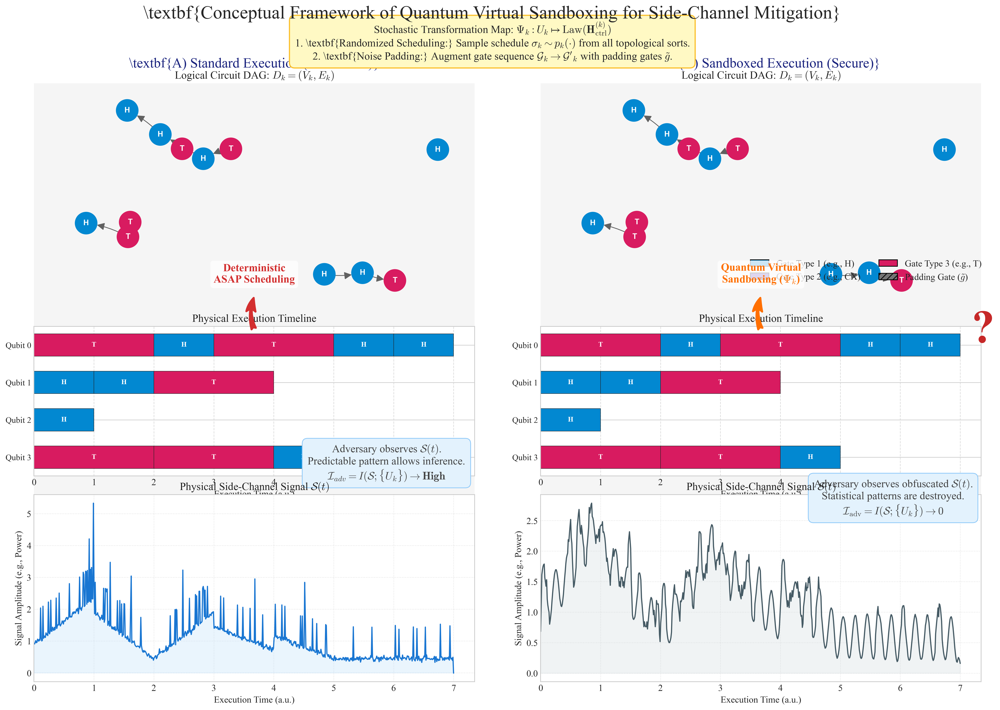

Visualization generation complete.


In [32]:
import os
import sys
import time
import random
import itertools
from typing import (
    List, Dict, Tuple, Any, Optional, Set, Callable, Generator, Union
)


try:
    import numpy as np
    import matplotlib
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    import matplotlib.path as mpath
    import matplotlib.lines as mlines
    import matplotlib.font_manager as fm
    from matplotlib.collections import LineCollection, PatchCollection
    import networkx as nx
except ImportError as e:
    print(f"Error: A required library is not installed. {e}")
    print("Please install the necessary packages by running:")
    print("pip install numpy matplotlib networkx")
    sys.exit(1)



class PlottingConfiguration:

    def __init__(self):

        self.figure_settings = {
            'figsize': (22, 14),
            'dpi': 300,
            'facecolor': '#FFFFFF',
            'edgecolor': '#000000',
            'title_text': r'\textbf{Conceptual Framework of Quantum Virtual Sandboxing for Side-Channel Mitigation}',
            'title_fontsize': 24,
            'title_pad': 40,
            'font_family': 'serif',
            'font_serif': 'Times New Roman',
            'mathtext_fontset': 'cm',
            'global_fontsize': 12,
        }


        self.layout_settings = {
            'grid_spec': {'nrows': 3, 'ncols': 2, 'height_ratios': [1.2, 0.8, 1]},
            'panel_spacing_horizontal': 0.15,
            'panel_spacing_vertical': 0.1,
            'panel_title_fontsize': 18,
            'panel_title_y_pos': 1.05,
            'panel_title_color': '#1A237E', # Dark Indigo
            'left_panel_title': r'\textbf{A) Standard Execution (Vulnerable)}',
            'right_panel_title': r'\textbf{B) Sandboxed Execution (Secure)}',
        }

        self.color_palette = {
            'background_light': '#F5F5F5',
            'text_main': '#212121',
            'text_annotation': '#424242',
            'text_math': '#0D47A1', # Dark Blue
            'arrow_main': '#D32F2F', # Red
            'arrow_secondary': '#4CAF50', # Green
            'adversary_color': '#C62828', # Dark Red
            'victim_color': '#1565C0', # Dark Blue
            'sandbox_process_color': '#FF6F00', # Amber
            'gate_type_1': '#0288D1', # Light Blue
            'gate_type_2': '#5E35B1', # Deep Purple
            'gate_type_3': '#D81B60', # Pink
            'padding_gate': '#757575', # Grey
            'idle_time': '#BDBDBD', # Light Grey
            'dag_node': '#1E88E5', # Blue
            'dag_edge': '#616161',
            'signal_line': '#1976D2', # Blue
            'signal_obfuscated': '#455A64', # Blue Grey
            'signal_fill': '#BBDEFB', # Light Blue fill
            'signal_fill_obfuscated': '#CFD8DC', # Light Blue Grey fill
        }


        self.dag_settings = {
            'num_qubits': 4,
            'num_gates': 12,
            'node_size': 800,
            'node_color': self.color_palette['dag_node'],
            'node_label_fontsize': 10,
            'node_label_color': 'white',
            'edge_color': self.color_palette['dag_edge'],
            'edge_style': 'solid',
            'arrow_size': 20,
            'layout_program': 'dot', # 'neato', 'fdp', 'sfdp', 'twopi', 'circo'
            'layout_seed': 42,
            'title': r'Logical Circuit DAG: $D_k=(V_k, E_k)$',
            'title_fontsize': 14,
        }


        self.timeline_settings = {
            'title': r'Physical Execution Timeline',
            'title_fontsize': 14,
            'qubit_label_fontsize': 11,
            'gate_height': 0.6,
            'gate_edgecolor': '#212121',
            'gate_linewidth': 0.5,
            'padding_gate_hatch': '///',
            'time_axis_label': 'Execution Time (a.u.)',
            'time_axis_fontsize': 12,
        }


        self.signal_settings = {
            'title': r'Physical Side-Channel Signal $\mathcal{S}(t)$',
            'title_fontsize': 14,
            'y_axis_label': r'Signal Amplitude (e.g., Power)',
            'y_axis_fontsize': 12,
            'line_width': 1.5,
            'fill_alpha': 0.3,
            'noise_level_baseline': 0.05,
            'noise_level_shot': 0.1,
            'obfuscation_noise_amplitude': 0.4,
            'obfuscation_noise_frequency': 5.0,
        }
        

        self.annotation_settings = {
            'arrow_style': patches.ArrowStyle.Fancy(head_length=0.6, head_width=0.4, tail_width=0.2),
            'arrow_connection_style': "arc3,rad=0.1",
            'bbox_style': {'boxstyle': 'round,pad=0.5', 'fc': '#E3F2FD', 'ec': '#90CAF9', 'lw': 1},
            'adversary_icon_path': self._get_adversary_icon_path(),
            'adversary_icon_zoom': 0.15,
            'math_fontsize_large': 18,
            'math_fontsize_medium': 14,
            'math_fontsize_small': 12,
        }


        self.simulation_params = {
            'gate_types': {
                'H': {'duration': 1, 'power_profile': self._power_profile_simple, 'color': self.color_palette['gate_type_1']},
                'CX': {'duration': 3, 'power_profile': self._power_profile_complex, 'color': self.color_palette['gate_type_2']},
                'T': {'duration': 2, 'power_profile': self._power_profile_medium, 'color': self.color_palette['gate_type_3']},
            },
            'padding_gate_type': {
                'ID': {'duration': 1, 'power_profile': self._power_profile_padding, 'color': self.color_palette['padding_gate']},
            },
            'padding_probability': 0.25,
            'time_resolution': 100, 
        }

    @staticmethod
    def _power_profile_simple(t: np.ndarray, duration: float) -> np.ndarray:

        return np.where((t >= 0) & (t < duration), 0.5, 0)

    @staticmethod
    def _power_profile_medium(t: np.ndarray, duration: float) -> np.ndarray:

        ramp_up = np.linspace(0, 0.8, len(t)//2)
        ramp_down = np.linspace(0.8, 0, len(t) - len(t)//2)
        profile = np.concatenate([ramp_up, ramp_down])
        return np.where((t >= 0) & (t < duration), profile, 0)

    @staticmethod
    def _power_profile_complex(t: np.ndarray, duration: float) -> np.ndarray:

        p1 = 0.8 * np.exp(-((t - duration * 0.25)**2) / (2 * (duration * 0.1)**2))
        p2 = 1.0 * np.exp(-((t - duration * 0.75)**2) / (2 * (duration * 0.1)**2))
        return np.where((t >= 0) & (t < duration), p1 + p2, 0)
        
    @staticmethod
    def _power_profile_padding(t: np.ndarray, duration: float) -> np.ndarray:

        return np.where((t >= 0) & (t < duration), 0.3 + 0.1 * np.sin(10 * np.pi * t / duration), 0)

    @staticmethod
    def _get_adversary_icon_path() -> mpath.Path:

        verts = [
            (0., 0.2),  # left corner
            (0.1, 0.4), # top left
            (0.4, 0.5), # top middle
            (0.6, 0.5), # top middle
            (0.9, 0.4), # top right
            (1., 0.2),  # right corner
            (0.9, 0.),  # bottom right
            (0.6, -0.1),# bottom middle
            (0.4, -0.1),# bottom middle
            (0.1, 0.),  # bottom left
            (0., 0.2),  # close
        ]
        codes = [mpath.Path.MOVETO, mpath.Path.CURVE4, mpath.Path.CURVE4, mpath.Path.LINETO,
                 mpath.Path.CURVE4, mpath.Path.CURVE4, mpath.Path.CURVE4, mpath.Path.CURVE4,
                 mpath.Path.LINETO, mpath.Path.CURVE4, mpath.Path.CLOSEPOLY]
        eye_path = mpath.Path(verts, codes)
        

        circle = mpath.Path.circle(center=(0.5, 0.2), radius=0.15)

        verts = np.concatenate([eye_path.vertices, circle.vertices])
        codes = np.concatenate([eye_path.codes, circle.codes])
        
        return mpath.Path(verts, codes)
        
    def apply_global_styles(self) -> None:

        plt.style.use('seaborn-v0_8-whitegrid')
        matplotlib.rcParams['font.family'] = self.figure_settings['font_family']
        matplotlib.rcParams['font.serif'] = self.figure_settings['font_serif']
        matplotlib.rcParams['mathtext.fontset'] = self.figure_settings['mathtext_fontset']
        matplotlib.rcParams['font.size'] = self.figure_settings['global_fontsize']
        matplotlib.rcParams['axes.titlesize'] = self.figure_settings['title_fontsize']
        matplotlib.rcParams['axes.labelsize'] = self.figure_settings['global_fontsize'] + 2
        matplotlib.rcParams['xtick.labelsize'] = self.figure_settings['global_fontsize']
        matplotlib.rcParams['ytick.labelsize'] = self.figure_settings['global_fontsize']
        matplotlib.rcParams['legend.fontsize'] = self.figure_settings['global_fontsize']
        matplotlib.rcParams['figure.titlesize'] = self.figure_settings['title_fontsize']


class QuantumGate:

    _gate_id_counter = 0

    def __init__(self, name: str, qubits: Tuple[int, ...], properties: Dict[str, Any]):
        self.id = QuantumGate._gate_id_counter
        QuantumGate._gate_id_counter += 1
        self.name = name
        self.qubits = qubits
        self.duration = properties['duration']
        self.power_profile = properties['power_profile']
        self.color = properties['color']
        self.is_padding = properties.get('is_padding', False)

    def __repr__(self) -> str:
        return f"Gate(id={self.id}, name='{self.name}', qubits={self.qubits})"

class QuantumCircuitDAG:

    def __init__(self, num_qubits: int, num_gates: int, gate_types: Dict[str, Any]):
        self.num_qubits = num_qubits
        self.num_gates = num_gates
        self.gate_types = gate_types
        self.graph = nx.DiGraph()
        self.gates: Dict[int, QuantumGate] = {}
        self._generate()

    def _generate(self) -> None:

        if self.num_qubits < 1:
            return
            
        qubit_frontiers = {q: -1 for q in range(self.num_qubits)}

        for i in range(self.num_gates):
            gate_name = random.choice(list(self.gate_types.keys()))
            gate_props = self.gate_types[gate_name]
            

            if gate_name == 'CX':
                arity = 2
            else:
                arity = 1
                
            if self.num_qubits < arity:
                continue


            selected_qubits = tuple(random.sample(range(self.num_qubits), arity))
            
            gate = QuantumGate(gate_name, selected_qubits, gate_props)
            self.gates[gate.id] = gate
            self.graph.add_node(gate.id, gate=gate)
            

            for q in selected_qubits:
                last_gate_on_qubit = qubit_frontiers[q]
                if last_gate_on_qubit != -1:
                    self.graph.add_edge(last_gate_on_qubit, gate.id)
                qubit_frontiers[q] = gate.id
                
    def get_all_topological_sorts(self) -> List[List[int]]:

        return list(nx.all_topological_sorts(self.graph))

    def get_random_topological_sort(self) -> List[int]:

        graph_copy = self.graph.copy()
        sort = []
        
        while graph_copy:
            zero_in_degree_nodes = [node for node, in_degree in graph_copy.in_degree() if in_degree == 0]
            if not zero_in_degree_nodes:

                raise ValueError("Graph has a cycle, cannot be topologically sorted.")
            
            node_to_add = random.choice(zero_in_degree_nodes)
            sort.append(node_to_add)
            graph_copy.remove_node(node_to_add)
            
        return sort


class ExecutionSchedule:

    def __init__(self):
        self.timeline: Dict[int, List[Dict[str, Any]]] = {} 
        self.total_duration = 0

    def add_gate_to_timeline(self, gate: QuantumGate, start_time: float):

        end_time = start_time + gate.duration
        for qubit in gate.qubits:
            if qubit not in self.timeline:
                self.timeline[qubit] = []
            self.timeline[qubit].append({
                'gate': gate,
                'start': start_time,
                'end': end_time
            })
        if end_time > self.total_duration:
            self.total_duration = end_time


class BaseScheduler:

    def __init__(self, dag: QuantumCircuitDAG, config: PlottingConfiguration):
        self.dag = dag
        self.config = config

    def schedule(self) -> ExecutionSchedule:

        raise NotImplementedError


class DeterministicScheduler(BaseScheduler):

    def schedule(self) -> ExecutionSchedule:

        schedule = ExecutionSchedule()
        

        try:
            topological_sort = next(nx.all_topological_sorts(self.dag.graph))
        except (nx.NetworkXUnfeasible, StopIteration):
            return schedule 

        gate_start_times = {}
        qubit_available_times = {q: 0 for q in range(self.dag.num_qubits)}
        
        for gate_id in topological_sort:
            gate = self.dag.gates[gate_id]
            

            predecessor_finish_times = [gate_start_times[pred_id] + self.dag.gates[pred_id].duration 
                                        for pred_id in self.dag.graph.predecessors(gate_id)]
            
            qubit_ready_times = [qubit_available_times[q] for q in gate.qubits]
            
            earliest_start = max(predecessor_finish_times + qubit_ready_times)
            

            schedule.add_gate_to_timeline(gate, earliest_start)
            gate_start_times[gate_id] = earliest_start
            

            for q in gate.qubits:
                qubit_available_times[q] = earliest_start + gate.duration
                
        return schedule


class RandomizedSandboxScheduler(BaseScheduler):

    def schedule(self) -> ExecutionSchedule:

        schedule = ExecutionSchedule()
        

        random_sort = self.dag.get_random_topological_sort()
        
        gate_start_times = {}
        qubit_available_times = {q: 0 for q in range(self.dag.num_qubits)}

        padding_gate_props = self.config.simulation_params['padding_gate_type']['ID']
        padding_gate_props['is_padding'] = True
        padding_prob = self.config.simulation_params['padding_probability']
        
        for gate_id in random_sort:
            gate = self.dag.gates[gate_id]
            

            predecessor_finish_times = [gate_start_times[pred_id] + self.dag.gates[pred_id].duration 
                                        for pred_id in self.dag.graph.predecessors(gate_id)]
            qubit_ready_times = [qubit_available_times[q] for q in gate.qubits]
            earliest_start = max(predecessor_finish_times + qubit_ready_times)

            for q in gate.qubits:
                time_gap = earliest_start - qubit_available_times[q]
                if time_gap > 0 and random.random() < padding_prob:

                    padding_gate = QuantumGate('ID', (q,), padding_gate_props)
                    padding_start = qubit_available_times[q]

                    actual_padding_duration = min(time_gap, padding_gate.duration)
                    if actual_padding_duration > 0.1: 
                        padding_gate.duration = actual_padding_duration
                        schedule.add_gate_to_timeline(padding_gate, padding_start)

                        qubit_available_times[q] = padding_start + actual_padding_duration


            qubit_ready_times_after_padding = [qubit_available_times[q] for q in gate.qubits]
            final_start_time = max(predecessor_finish_times + qubit_ready_times_after_padding)


            schedule.add_gate_to_timeline(gate, final_start_time)
            gate_start_times[gate_id] = final_start_time
            

            for q in gate.qubits:
                qubit_available_times[q] = final_start_time + gate.duration
                
        return schedule




class SideChannelEmitter:

    def __init__(self, schedule: ExecutionSchedule, config: PlottingConfiguration, obfuscate: bool = False):
        self.schedule = schedule
        self.config = config
        self.obfuscate = obfuscate
        self.time_resolution = self.config.simulation_params['time_resolution']
        
        self.time_vector: np.ndarray = np.array([])
        self.signal_vector: np.ndarray = np.array([])
        
        self._generate_signal()

    def _generate_signal(self) -> None:

        if self.schedule.total_duration == 0:
            return
            
        num_points = int(self.schedule.total_duration * self.time_resolution)
        self.time_vector = np.linspace(0, self.schedule.total_duration, num_points)
        self.signal_vector = np.zeros(num_points)


        all_gates_on_timeline = []
        for qubit, events in self.schedule.timeline.items():
            for event in events:
                all_gates_on_timeline.append(event)

        for event in all_gates_on_timeline:
            gate = event['gate']
            start_time = event['start']
            
            gate_time_mask = (self.time_vector >= start_time) & (self.time_vector < start_time + gate.duration)
            time_slice = self.time_vector[gate_time_mask] - start_time
            
            if time_slice.size > 0:
                self.signal_vector[gate_time_mask] += gate.power_profile(time_slice, gate.duration)


        self._add_baseline_noise()


        if self.obfuscate:
            self._add_obfuscation_noise()

    def _add_baseline_noise(self) -> None:


        baseline_noise_level = self.config.signal_settings['noise_level_baseline']
        self.signal_vector += np.random.normal(0, baseline_noise_level, self.signal_vector.shape)
        

        shot_noise_level = self.config.signal_settings['noise_level_shot']
        shot_noise = np.random.poisson(np.maximum(0, self.signal_vector * shot_noise_level)) / shot_noise_level
        self.signal_vector += (shot_noise - self.signal_vector) * 0.1 

    def _add_obfuscation_noise(self) -> None:

        amp = self.config.signal_settings['obfuscation_noise_amplitude']
        freq = self.config.signal_settings['obfuscation_noise_frequency']

        obfuscation_noise = amp * np.sin(2 * np.pi * freq * self.time_vector)
        

        def perlin_noise(x, octaves=4, persistence=0.5):
            noise = np.zeros_like(x)
            frequency = 1
            amplitude = 1
            for _ in range(octaves):
                noise += amplitude * np.interp(x * frequency, 
                                               np.arange(int(np.max(x*frequency))+2), 
                                               np.random.randn(int(np.max(x*frequency))+2))
                amplitude *= persistence
                frequency *= 2
            return noise / (2 - persistence)
            
        obfuscation_noise += amp * 0.5 * perlin_noise(self.time_vector * 0.1)
        self.signal_vector += obfuscation_noise
        

        self.signal_vector = np.convolve(self.signal_vector, np.ones(5)/5, mode='same')



class VisualizationEngine:

    def __init__(self, config: PlottingConfiguration, dag: QuantumCircuitDAG,
                 deterministic_results: Dict, sandboxed_results: Dict):
        self.config = config
        self.dag = dag
        self.det_results = deterministic_results
        self.sbx_results = sandboxed_results

        self.fig: plt.Figure
        self.axes: Dict[str, plt.Axes]
        self.config.apply_global_styles()

    def render(self) -> None:

        self._setup_figure_layout()
        

        self._draw_panel_background('left')
        self._draw_dag_panel(self.axes['dag_left'], self.axes['panel_title_left'],
                             self.config.layout_settings['left_panel_title'])
        self._draw_timeline_panel(self.axes['timeline_left'], self.det_results['schedule'])
        self._draw_signal_panel(self.axes['signal_left'], self.det_results['signal'], is_obfuscated=False)
        self._draw_left_panel_annotations()


        self._draw_panel_background('right')

        self._draw_dag_panel(self.axes['dag_right'], self.axes['panel_title_right'],
                             self.config.layout_settings['right_panel_title'])
        self._draw_timeline_panel(self.axes['timeline_right'], self.sbx_results['schedule'])
        self._draw_signal_panel(self.axes['signal_right'], self.sbx_results['signal'], is_obfuscated=True)
        self._draw_right_panel_annotations()


        self.fig.suptitle(self.config.figure_settings['title_text'],
                          fontsize=self.config.figure_settings['title_fontsize'])
        


        print(f"Saving figure to {save_path}...")
        self.fig.savefig(save_path,
                         dpi=self.config.figure_settings['dpi'],
                         facecolor=self.config.figure_settings['facecolor'],
                         bbox_inches='tight')
        print("Figure saved successfully.")
        plt.show()

    def _setup_figure_layout(self) -> None:

        self.fig = plt.figure(figsize=self.config.figure_settings['figsize'],
                              facecolor=self.config.figure_settings['facecolor'])
        
        gs = self.fig.add_gridspec(**self.config.layout_settings['grid_spec'],
                                   wspace=self.config.layout_settings['panel_spacing_horizontal'],
                                   hspace=self.config.layout_settings['panel_spacing_vertical'])

        self.axes = {
            'panel_title_left': self.fig.add_subplot(gs[0, 0]),
            'panel_title_right': self.fig.add_subplot(gs[0, 1]),
            'dag_left': self.fig.add_subplot(gs[0, 0]),
            'dag_right': self.fig.add_subplot(gs[0, 1]),
            'timeline_left': self.fig.add_subplot(gs[1, 0]),
            'timeline_right': self.fig.add_subplot(gs[1, 1]),
            'signal_left': self.fig.add_subplot(gs[2, 0]),
            'signal_right': self.fig.add_subplot(gs[2, 1]),
        }
        

        for key in ['panel_title_left', 'panel_title_right']:
            self.axes[key].axis('off')

    def _draw_panel_background(self, panel: str) -> None:

        ax_keys = [key for key in self.axes if panel in key and 'title' not in key]
        

        bboxes = [self.axes[key].get_position() for key in ax_keys]
        if not bboxes: return
        
        full_bbox = matplotlib.transforms.Bbox.union(bboxes)
        
        rect = patches.Rectangle((full_bbox.x0, full_bbox.y0), full_bbox.width, full_bbox.height,
                                 transform=self.fig.transFigure,
                                 facecolor=self.config.color_palette['background_light'],
                                 edgecolor='none',
                                 zorder=-10)
        self.fig.add_artist(rect)


    def _draw_dag_panel(self, ax: plt.Axes, title_ax: plt.Axes, panel_title: str) -> None:

        title_ax.set_title(panel_title,
                           fontsize=self.config.layout_settings['panel_title_fontsize'],
                           color=self.config.layout_settings['panel_title_color'],
                           y=self.config.layout_settings['panel_title_y_pos'])
        
        ax.set_title(self.config.dag_settings['title'], fontsize=self.config.dag_settings['title_fontsize'])


        try:
            pos = nx.drawing.nx_pydot.graphviz_layout(
                self.dag.graph, prog=self.config.dag_settings['layout_program']
            )
        except:
            print("Warning: pydot/graphviz not found. Using spring layout for DAG.")
            pos = nx.spring_layout(self.dag.graph, seed=self.config.dag_settings['layout_seed'])

        node_labels = {g_id: gate.name for g_id, gate in self.dag.gates.items()}
        node_colors = [gate.color for gate in self.dag.gates.values()]

        nx.draw_networkx_nodes(self.dag.graph, pos, ax=ax,
                               node_size=self.config.dag_settings['node_size'],
                               node_color=node_colors)
        nx.draw_networkx_labels(self.dag.graph, pos, ax=ax,
                                labels=node_labels,
                                font_size=self.config.dag_settings['node_label_fontsize'],
                                font_color=self.config.dag_settings['node_label_color'],
                                font_weight='bold')
        nx.draw_networkx_edges(self.dag.graph, pos, ax=ax,
                               edge_color=self.config.dag_settings['edge_color'],
                               style=self.config.dag_settings['edge_style'],
                               arrows=True,
                               arrowsize=self.config.dag_settings['arrow_size'],
                               node_size=self.config.dag_settings['node_size'],
                               connectionstyle='arc3,rad=0.1')
        ax.margins(0.1)
        ax.axis('off')

    def _draw_timeline_panel(self, ax: plt.Axes, schedule: ExecutionSchedule) -> None:

        ax.set_title(self.config.timeline_settings['title'], fontsize=self.config.timeline_settings['title_fontsize'])
        
        num_qubits = self.dag.num_qubits
        ax.set_yticks(range(num_qubits))
        ax.set_yticklabels([f'Qubit {q}' for q in range(num_qubits)], 
                           fontsize=self.config.timeline_settings['qubit_label_fontsize'])
        ax.set_ylim(-0.5, num_qubits - 0.5)
        ax.invert_yaxis()

        gate_patches = []
        for qubit, events in schedule.timeline.items():
            for event in events:
                gate = event['gate']
                start, end = event['start'], event['end']
                duration = end - start
                
                rect = patches.Rectangle(
                    (start, qubit - self.config.timeline_settings['gate_height'] / 2),
                    duration, self.config.timeline_settings['gate_height'],
                    facecolor=gate.color,
                    edgecolor=self.config.timeline_settings['gate_edgecolor'],
                    linewidth=self.config.timeline_settings['gate_linewidth'],
                    hatch=self.config.timeline_settings['padding_gate_hatch'] if gate.is_padding else None
                )
                gate_patches.append(rect)
                

                if duration > 0.5: 
                    ax.text(start + duration / 2, qubit, gate.name,
                            ha='center', va='center', color='white', fontsize=9, weight='bold')

        ax.add_collection(PatchCollection(gate_patches, match_original=True))
        
        ax.set_xlabel(self.config.timeline_settings['time_axis_label'], 
                      fontsize=self.config.timeline_settings['time_axis_fontsize'])
        ax.set_xlim(0, schedule.total_duration * 1.05)
        ax.grid(axis='x', linestyle='--', alpha=0.7)

    def _draw_signal_panel(self, ax: plt.Axes, signal_emitter: SideChannelEmitter, is_obfuscated: bool) -> None:

        ax.set_title(self.config.signal_settings['title'], fontsize=self.config.signal_settings['title_fontsize'])
        
        time_vec = signal_emitter.time_vector
        sig_vec = signal_emitter.signal_vector

        if time_vec.size == 0: 
            ax.text(0.5, 0.5, "No execution", ha='center', va='center', transform=ax.transAxes)
            return

        line_color = self.config.color_palette['signal_obfuscated'] if is_obfuscated else self.config.color_palette['signal_line']
        fill_color = self.config.color_palette['signal_fill_obfuscated'] if is_obfuscated else self.config.color_palette['signal_fill']
        
        ax.plot(time_vec, sig_vec,
                color=line_color,
                linewidth=self.config.signal_settings['line_width'])
        ax.fill_between(time_vec, 0, sig_vec,
                        color=fill_color,
                        alpha=self.config.signal_settings['fill_alpha'])

        ax.set_xlabel(self.config.timeline_settings['time_axis_label'],
                      fontsize=self.config.timeline_settings['time_axis_fontsize'])
        ax.set_ylabel(self.config.signal_settings['y_axis_label'],
                      fontsize=self.config.signal_settings['y_axis_fontsize'])
        

        timeline_ax = self.axes['signal_left' if not is_obfuscated else 'signal_right'].get_shared_x_axes().get_siblings(self.axes['timeline_left' if not is_obfuscated else 'timeline_right'])[0]
        ax.set_xlim(timeline_ax.get_xlim())
        ax.grid(True, linestyle=':', alpha=0.6)

    def _draw_left_panel_annotations(self) -> None:


        ax_sig = self.axes['signal_left']

        if np.all(np.isfinite(ax_sig.get_xlim())) and np.all(np.isfinite(ax_sig.get_ylim())):
            adversary_pos = (ax_sig.get_xlim()[1] * 0.8, ax_sig.get_ylim()[1] * 1.5)
            self._draw_adversary_icon(ax_sig, adversary_pos, is_successful=True)
            

            adversary_text = (r"Adversary observes $\mathcal{S}(t)$." "\n"
                              r"Predictable pattern allows inference." "\n"
                              r"$\mathcal{I}_{adv} = I(\mathcal{S}; \{U_k\}) \rightarrow \mathrm{\bf High}$")
            
            ax_sig.text(adversary_pos[0], adversary_pos[1] - 1.2, adversary_text,
                        ha='center', va='top',
                        fontsize=self.config.annotation_settings['math_fontsize_medium'],
                        color=self.config.color_palette['text_annotation'],
                        bbox=self.config.annotation_settings['bbox_style'])
        else:
            print("Warning: Could not draw left panel annotations due to invalid axes limits.")


        self._draw_connecting_arrow(
            self.axes['dag_left'], self.axes['timeline_left'],
            from_pos=(0.5, -0.1), to_pos=(0.5, 1.2),
            label="Deterministic\nASAP Scheduling",
            rad=-0.2
        )
    def _draw_right_panel_annotations(self) -> None:


        ax_sig = self.axes['signal_right']
        adversary_pos = (ax_sig.get_xlim()[1] * 0.8, ax_sig.get_ylim()[1] * 1.5)
        self._draw_adversary_icon(ax_sig, adversary_pos, is_successful=False)

        adversary_text = (
            r"Adversary observes obfuscated $\mathcal{S}(t)$." "\n"
            r"Statistical patterns are destroyed." "\n"
            r"$\mathcal{I}_{\mathrm{adv}} = I(\mathcal{S}; \{U_k\}) \rightarrow \mathbf{0}$"
        )

                          
        ax_sig.text(adversary_pos[0], adversary_pos[1] - 1.2, adversary_text,
                    ha='center', va='top',
                    fontsize=self.config.annotation_settings['math_fontsize_medium'],
                    color=self.config.color_palette['text_annotation'],
                    bbox=self.config.annotation_settings['bbox_style'])


        ax_dag = self.axes['dag_right']
        ax_timeline = self.axes['timeline_right']
        

        sandbox_text = (r"Stochastic Transformation Map: $\Psi_k: U_k \mapsto \mathrm{Law}(\mathbf{H}_{\mathrm{ctrl}}^{(k)})$" "\n"
                        r"1. \textbf{Randomized Scheduling:} Sample schedule $\sigma_k \sim p_k(\cdot)$ from all topological sorts." "\n"
                        r"2. \textbf{Noise Padding:} Augment gate sequence $\mathcal{G}_k \rightarrow \mathcal{G}'_k$ with padding gates $\tilde{g}$.")

        self.fig.text(0.5, 0.96, sandbox_text,
                      ha='center', va='top', transform=self.fig.transFigure,
                      fontsize=self.config.annotation_settings['math_fontsize_medium'],
                      bbox={'boxstyle': 'round,pad=0.5', 'fc': '#FFF9C4', 'ec': '#FBC02D', 'lw': 1.5})
                      

        self._draw_connecting_arrow(
            ax_dag, ax_timeline,
            from_pos=(0.5, -0.1), to_pos=(0.5, 1.2),
            label="Quantum Virtual\nSandboxing ($\Psi_k$)",
            rad=-0.2,
            arrow_color=self.config.color_palette['sandbox_process_color']
        )
        

        legend_elements = [
            patches.Patch(facecolor=self.config.simulation_params['gate_types']['H']['color'], edgecolor='k', label='Gate Type 1 (e.g., H)'),
            patches.Patch(facecolor=self.config.simulation_params['gate_types']['CX']['color'], edgecolor='k', label='Gate Type 2 (e.g., CX)'),
            patches.Patch(facecolor=self.config.simulation_params['gate_types']['T']['color'], edgecolor='k', label='Gate Type 3 (e.g., T)'),
            patches.Patch(facecolor=self.config.color_palette['padding_gate'], edgecolor='k', 
                          hatch=self.config.timeline_settings['padding_gate_hatch'], label=r'Padding Gate ($\tilde{g}$)')
        ]
        ax_timeline.legend(handles=legend_elements, loc='upper right', bbox_to_anchor=(1.02, 1.5), ncol=2)

    def _draw_adversary_icon(self, ax: plt.Axes, position: Tuple[float, float], is_successful: bool) -> None:

        path = self.config.annotation_settings['adversary_icon_path']
        path_patch = patches.PathPatch(path, facecolor=self.config.color_palette['adversary_color'], 
                                       edgecolor='black', linewidth=1.5, alpha=0.8)
        
        ax.add_patch(path_patch)
        

        transform = matplotlib.transforms.Affine2D().scale(3.0).translate(position[0], position[1]) + ax.transData
        path_patch.set_transform(transform)
        
        if not is_successful:

            ax.text(position[0] + 1.5, position[1] + 1.2, '?',
                    fontsize=60, color=self.config.color_palette['adversary_color'],
                    ha='center', va='center', weight='bold', transform=ax.transData)

    def _draw_connecting_arrow(self, ax_from: plt.Axes, ax_to: plt.Axes,
                               from_pos: Tuple, to_pos: Tuple,
                               label: str, rad: float = 0.2,
                               arrow_color: Optional[str] = None) -> None:

        if arrow_color is None:
            arrow_color = self.config.color_palette['arrow_main']
            
        xy_from = ax_from.transAxes.transform(from_pos)
        xy_to = ax_to.transAxes.transform(to_pos)
        

        xy_from_fig = self.fig.transFigure.inverted().transform(xy_from)
        xy_to_fig = self.fig.transFigure.inverted().transform(xy_to)

        arrow = patches.FancyArrowPatch(
            xy_from_fig, xy_to_fig,
            transform=self.fig.transFigure,
            arrowstyle=self.config.annotation_settings['arrow_style'],
            connectionstyle=f"arc3,rad={rad}",
            color=arrow_color,
            linewidth=2.5,
            mutation_scale=30,
            zorder=20
        )
        self.fig.add_artist(arrow)


        label_pos_x = (xy_from_fig[0] + xy_to_fig[0]) / 2
        label_pos_y = (xy_from_fig[1] + xy_to_fig[1]) / 2 + 0.05
        self.fig.text(label_pos_x, label_pos_y, label,
                      transform=self.fig.transFigure,
                      ha='center', va='center',
                      fontsize=self.config.annotation_settings['math_fontsize_medium'],
                      weight='bold',
                      color=arrow_color,
                      bbox={'boxstyle': 'round,pad=0.3', 'fc': 'white', 'ec': 'none', 'alpha': 0.8})



def main():

    print("=====================================================")
    print("Initializing Quantum Virtual Sandboxing Visualization")
    print("=====================================================")
    

    print("Step 1: Loading configuration...")
    config = PlottingConfiguration()
    random.seed(config.dag_settings['layout_seed'])
    np.random.seed(config.dag_settings['layout_seed'])


    print("Step 2: Generating logical circuit DAG...")
    circuit_dag = QuantumCircuitDAG(
        num_qubits=config.dag_settings['num_qubits'],
        num_gates=config.dag_settings['num_gates'],
        gate_types=config.simulation_params['gate_types']
    )


    print("Step 3: Running deterministic simulation...")
    det_scheduler = DeterministicScheduler(circuit_dag, config)
    det_schedule = det_scheduler.schedule()
    det_signal = SideChannelEmitter(det_schedule, config, obfuscate=False)
    deterministic_results = {
        'schedule': det_schedule,
        'signal': det_signal,
    }
    print(f"  - Deterministic schedule created with duration: {det_schedule.total_duration:.2f}")


    print("Step 4: Running sandboxed simulation...")
    sbx_scheduler = RandomizedSandboxScheduler(circuit_dag, config)
    sbx_schedule = sbx_scheduler.schedule()
    sbx_signal = SideChannelEmitter(sbx_schedule, config, obfuscate=True)
    sandboxed_results = {
        'schedule': sbx_schedule,
        'signal': sbx_signal,
    }
    print(f"  - Sandboxed schedule created with duration: {sbx_schedule.total_duration:.2f}")


    print("Step 5: Initializing visualization engine and rendering figure...")
    engine = VisualizationEngine(config, circuit_dag, deterministic_results, sandboxed_results)
    engine.render()
    
    print("=====================================================")
    print("Visualization generation complete.")
    print("=====================================================")


if __name__ == "__main__":
 

    main()


[2025-08-29 11:33:48] [INFO] - Substituting symbol C from STIXNonUnicode
[2025-08-29 11:33:48] [INFO] - Substituting symbol K from STIXNonUnicode
[2025-08-29 11:33:49] [INFO] - Substituting symbol S from STIXNonUnicode
[2025-08-29 11:33:50] [INFO] - Substituting symbol C from STIXNonUnicode
[2025-08-29 11:33:50] [INFO] - Substituting symbol K from STIXNonUnicode
[2025-08-29 11:33:50] [INFO] - Substituting symbol S from STIXNonUnicode
[2025-08-29 11:33:52] [INFO] - Substituting symbol C from STIXNonUnicode
[2025-08-29 11:33:52] [INFO] - Substituting symbol K from STIXNonUnicode
[2025-08-29 11:33:52] [INFO] - Substituting symbol S from STIXNonUnicode
[2025-08-29 11:33:54] [INFO] - Substituting symbol C from STIXNonUnicode
[2025-08-29 11:33:54] [INFO] - Substituting symbol K from STIXNonUnicode
[2025-08-29 11:33:54] [INFO] - Substituting symbol S from STIXNonUnicode
[2025-08-29 11:33:56] [INFO] - Substituting symbol C from STIXNonUnicode
[2025-08-29 11:33:56] [INFO] - Substituting symbol 

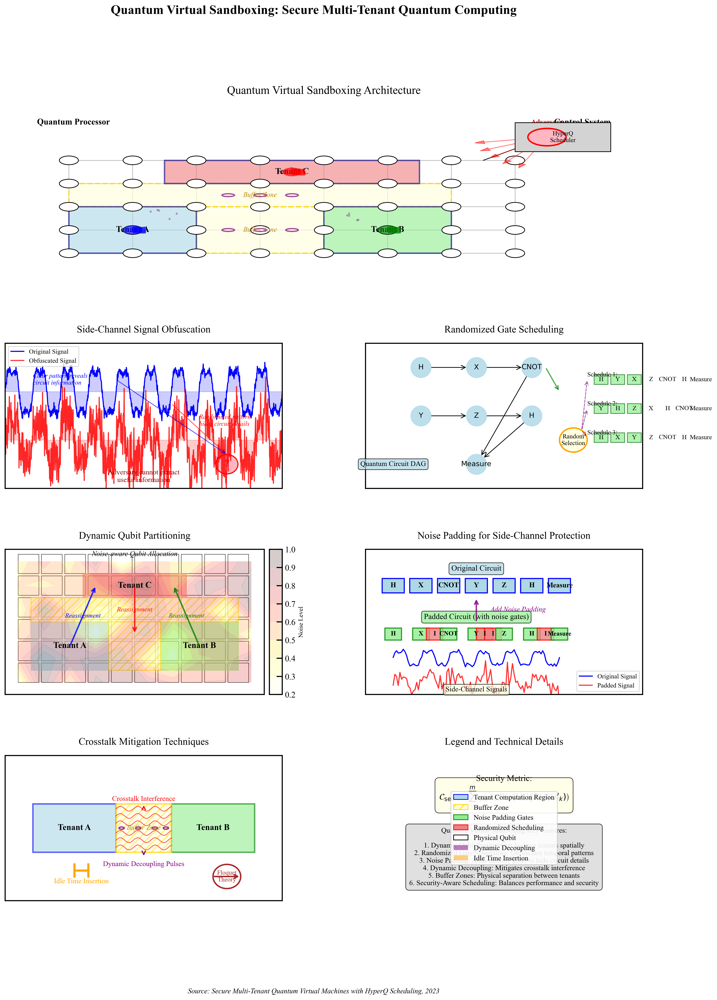

In [38]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Circle, Polygon, FancyBboxPatch, ConnectionPatch
from matplotlib.collections import PatchCollection, LineCollection
from matplotlib.colors import LinearSegmentedColormap, ListedColormap, to_rgba
from matplotlib import gridspec
import matplotlib as mpl
from matplotlib import animation
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from scipy import signal
from scipy.stats import gaussian_kde
import networkx as nx
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase
import matplotlib.patheffects as path_effects
from matplotlib.font_manager import FontProperties
from mpl_toolkits.axes_grid1 import make_axes_locatable
import math
from matplotlib.transforms import Affine2D
from matplotlib.offsetbox import AnnotationBbox, OffsetImage, TextArea
from matplotlib.animation import FuncAnimation
import matplotlib.patches as mpatches
from matplotlib.bezier import BezierSegment
from matplotlib.markers import MarkerStyle
from matplotlib.textpath import TextPath
from matplotlib import cm


plt.style.use('default')
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['font.serif'] = ['Times New Roman', 'Times', 'DejaVu Serif']
mpl.rcParams['font.size'] = 12
mpl.rcParams['axes.linewidth'] = 1.5
mpl.rcParams['xtick.direction'] = 'in'
mpl.rcParams['ytick.direction'] = 'in'
mpl.rcParams['xtick.major.size'] = 8
mpl.rcParams['ytick.major.size'] = 8
mpl.rcParams['xtick.major.width'] = 1.5
mpl.rcParams['ytick.major.width'] = 1.5
mpl.rcParams['axes.edgecolor'] = 'black'
mpl.rcParams['axes.labelcolor'] = 'black'
mpl.rcParams['text.color'] = 'black'


fig = plt.figure(figsize=(16, 20), dpi=300)


gs = gridspec.GridSpec(4, 2, figure=fig, height_ratios=[1.2, 1, 1, 1], width_ratios=[1, 1],
                       hspace=0.4, wspace=0.3)


ax_main = fig.add_subplot(gs[0, :]) 
ax_sidechannel = fig.add_subplot(gs[1, 0]) 
ax_scheduling = fig.add_subplot(gs[1, 1])  
ax_partitioning = fig.add_subplot(gs[2, 0])  
ax_noisepadding = fig.add_subplot(gs[2, 1])  
ax_crosstalk = fig.add_subplot(gs[3, 0])  
ax_legend = fig.add_subplot(gs[3, 1])  


ax_legend.axis('off')


def create_main_visualization(ax):
    ax.set_xlim(0, 10)
    ax.set_ylim(0, 6)
    ax.set_title('Quantum Virtual Sandboxing Architecture', fontsize=16, pad=20)
    

    qubit_grid = []
    for i in range(8):
        for j in range(5):
            x = 1 + i * 1.0
            y = 1 + j * 0.8
            circle = Circle((x, y), radius=0.15, facecolor='white', edgecolor='black', linewidth=1, zorder=3)
            ax.add_patch(circle)
            qubit_grid.append((x, y))
    

    for i in range(8):
        for j in range(4):
            x1 = 1 + i * 1.0
            y1 = 1 + j * 0.8
            x2 = 1 + i * 1.0
            y2 = 1 + (j+1) * 0.8
            ax.plot([x1, x2], [y1, y2], 'k-', linewidth=0.5, alpha=0.5, zorder=1)
            
    for j in range(5):
        for i in range(7):
            x1 = 1 + i * 1.0
            y1 = 1 + j * 0.8
            x2 = 1 + (i+1) * 1.0
            y2 = 1 + j * 0.8
            ax.plot([x1, x2], [y1, y2], 'k-', linewidth=0.5, alpha=0.5, zorder=1)
    

    tenant_regions = [
        {'coords': [(1, 1), (3, 1), (3, 2.6), (1, 2.6)], 'color': 'lightblue', 'alpha': 0.6, 'label': 'Tenant A'},
        {'coords': [(5, 1), (7, 1), (7, 2.6), (5, 2.6)], 'color': 'lightgreen', 'alpha': 0.6, 'label': 'Tenant B'},
        {'coords': [(2.5, 3.4), (6.5, 3.4), (6.5, 4.2), (2.5, 4.2)], 'color': 'lightcoral', 'alpha': 0.6, 'label': 'Tenant C'}
    ]
    

    for region in tenant_regions:
        poly = Polygon(region['coords'], closed=True, facecolor=region['color'], 
                      alpha=region['alpha'], edgecolor='darkblue', linewidth=2, zorder=2)
        ax.add_patch(poly)
        

        centroid = np.mean(region['coords'], axis=0)
        ax.text(centroid[0], centroid[1], region['label'], fontsize=12, 
                ha='center', va='center', weight='bold', zorder=4)
    
 
    buffer_zones = [
        {'coords': [(3, 1), (5, 1), (5, 2.6), (3, 2.6)], 'color': 'lightyellow', 'alpha': 0.7},
        {'coords': [(1, 2.6), (7, 2.6), (7, 3.4), (1, 3.4)], 'color': 'lightyellow', 'alpha': 0.7}
    ]
    
    for zone in buffer_zones:
        poly = Polygon(zone['coords'], closed=True, facecolor=zone['color'], 
                      alpha=zone['alpha'], edgecolor='gold', linewidth=2, linestyle='--', zorder=1)
        ax.add_patch(poly)

    ax.text(4, 1.8, 'Buffer Zone', fontsize=10, ha='center', va='center', 
            rotation=0, style='italic', color='darkgoldenrod', zorder=4)
    ax.text(4, 3.0, 'Buffer Zone', fontsize=10, ha='center', va='center', 
            rotation=0, style='italic', color='darkgoldenrod', zorder=4)
    

    t = np.linspace(0, 2*np.pi, 100)
    for x in [3.5, 4.0, 4.5]:
        for y in [1.8, 3.0]:
            x_wave = x + 0.1 * np.sin(8 * t)
            y_wave = y + 0.05 * np.cos(8 * t)
            ax.plot(x_wave, y_wave, 'purple', linewidth=1.5, alpha=0.7, zorder=3)
    

    for tenant_x, tenant_y, color in [(2, 1.8, 'blue'), (6, 1.8, 'green'), (4.5, 3.8, 'red')]:

        t = np.linspace(0, 2*np.pi, 50)
        x_pulse = tenant_x + 0.2 * t / (2*np.pi)
        y_pulse = tenant_y + 0.1 * np.sin(10 * t)
        ax.plot(x_pulse, y_pulse, color=color, linewidth=2, alpha=0.8, zorder=4)
        

        ax.add_patch(Circle((tenant_x, tenant_y), radius=0.15, facecolor=color, alpha=0.7, zorder=4))
    

    ax.plot([8.5, 7.5], [5, 4.2], 'k-', linewidth=1)
    ax.add_patch(Circle((8.5, 5), radius=0.3, facecolor='lightpink', edgecolor='red', linewidth=2, zorder=5))
    ax.text(8.5, 5.5, 'Adversary', fontsize=10, ha='center', va='center', color='red', weight='bold')
    

    for angle in np.linspace(-0.5, 0.5, 5):
        dx = 7.5 - 8.5
        dy = 4.2 - 5
        length = np.sqrt(dx**2 + dy**2)
        dx, dy = dx/length, dy/length
        

        rot_dx = dx * np.cos(angle) - dy * np.sin(angle)
        rot_dy = dx * np.sin(angle) + dy * np.cos(angle)
        
        ax.arrow(8.5, 5, rot_dx, rot_dy, head_width=0.1, head_length=0.15, 
                 fc='red', ec='red', alpha=0.5, linewidth=1, zorder=4)
    

    for x, y in [(2.5, 2.2), (5.5, 2.2), (4.5, 3.8)]:

        for i in range(5):
            angle = np.random.random() * 2 * np.pi
            dist = np.random.random() * 0.3
            nx = x + dist * np.cos(angle)
            ny = y + dist * np.sin(angle)
            ax.text(nx, ny, '*', fontsize=8, ha='center', va='center', 
                    color='purple', alpha=0.7, weight='bold')
    

    ax.text(0.5, 5.5, 'Quantum Processor', fontsize=12, ha='left', va='center', weight='bold')
    ax.text(9.5, 5.5, 'Control System', fontsize=12, ha='right', va='center', weight='bold')
    

    ax.add_patch(Rectangle((8, 4.5), 1.5, 1, facecolor='lightgray', edgecolor='black', linewidth=1, zorder=4))
    ax.text(8.75, 5.0, 'HyperQ\nScheduler', fontsize=9, ha='center', va='center', zorder=5)
    
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)


def create_side_channel_visualization(ax):
    ax.set_xlim(0, 10)
    ax.set_ylim(0, 6)
    ax.set_title('Side-Channel Signal Obfuscation', fontsize=14, pad=15)
    

    t = np.linspace(0, 10, 1000)
    

    original_signal = np.sin(2*np.pi*t) + 0.3*np.sin(2*np.pi*3*t) + 0.1*np.random.randn(len(t))
    

    obfuscated_signal = original_signal + 0.5*np.random.randn(len(t))

    for _ in range(20):
        idx = np.random.randint(50, 950)
        obfuscated_signal[idx:idx+20] += 0.8*np.random.randn()
    

    ax.plot(t, original_signal + 4, 'b-', linewidth=1.5, label='Original Signal')
    ax.plot(t, obfuscated_signal + 2, 'r-', linewidth=1.5, alpha=0.8, label='Obfuscated Signal')
    

    ax.fill_between(t, original_signal + 4, 4, color='blue', alpha=0.2)
    ax.fill_between(t, obfuscated_signal + 2, 2, color='red', alpha=0.2)
    

    ax.text(1, 4.5, 'Clear pattern reveals\ncircuit information', fontsize=9, color='blue', 
            ha='left', va='center', style='italic')
    ax.text(7, 2.8, 'Randomized pattern\nhides circuit details', fontsize=9, color='red', 
            ha='left', va='center', style='italic')
    

    ax.add_patch(Circle((8, 1), radius=0.4, facecolor='lightpink', edgecolor='red', linewidth=1.5))
    ax.text(8, 1, '?', fontsize=14, ha='center', va='center', color='red', weight='bold')

    ax.annotate('', xy=(8, 1.4), xytext=(6, 3.5), 
                arrowprops=dict(arrowstyle='->', color='red', linewidth=1, alpha=0.7))
    ax.annotate('', xy=(8, 1.4), xytext=(4, 4.5), 
                arrowprops=dict(arrowstyle='->', color='blue', linewidth=1, alpha=0.7))
    
    ax.text(5, 0.5, 'Adversary cannot extract\nuseful information', fontsize=10, 
            ha='center', va='center', color='darkred')
    
    ax.set_xticks([])
    ax.set_yticks([])
    ax.legend(loc='upper left', fontsize=9, frameon=True, fancybox=True, framealpha=0.8)


def create_scheduling_visualization(ax):
    ax.set_xlim(0, 10)
    ax.set_ylim(0, 6)
    ax.set_title('Randomized Gate Scheduling', fontsize=14, pad=15)
    

    G = nx.DiGraph()
    

    nodes = [
        (1, {'label': 'H', 'pos': (2, 5)}),
        (2, {'label': 'X', 'pos': (4, 5)}),
        (3, {'label': 'CNOT', 'pos': (6, 5)}),
        (4, {'label': 'Y', 'pos': (2, 3)}),
        (5, {'label': 'Z', 'pos': (4, 3)}),
        (6, {'label': 'H', 'pos': (6, 3)}),
        (7, {'label': 'Measure', 'pos': (4, 1)})
    ]
    
    G.add_nodes_from([(n[0], n[1]) for n in nodes])
    

    edges = [(1, 2), (2, 3), (4, 5), (5, 6), (3, 7), (6, 7)]
    G.add_edges_from(edges)
    

    pos = nx.get_node_attributes(G, 'pos')
    labels = nx.get_node_attributes(G, 'label')
    
    nx.draw_networkx_nodes(G, pos, node_color='lightblue', node_size=800, ax=ax, alpha=0.8)
    nx.draw_networkx_edges(G, pos, edge_color='black', arrows=True, ax=ax, 
                           arrowstyle='->', arrowsize=15, node_size=800)
    nx.draw_networkx_labels(G, pos, labels, font_size=10, ax=ax)
    

    schedules = [
        [1, 4, 2, 5, 3, 6, 7],
        [4, 1, 5, 2, 6, 3, 7],
        [1, 2, 4, 5, 3, 6, 7]
    ]
    

    for i, schedule in enumerate(schedules):
        y_pos = 4.5 - i * 1.2
        ax.text(8, y_pos + 0.2, f"Schedule {i+1}:", fontsize=9, ha='left', va='center')
        
        for j, gate_id in enumerate(schedule):
            x_pos = 8.5 + j * 0.6
            gate_label = labels[gate_id]
            ax.add_patch(Rectangle((x_pos - 0.25, y_pos - 0.2), 0.5, 0.4, 
                                   facecolor='lightgreen', edgecolor='darkgreen', alpha=0.7))
            ax.text(x_pos, y_pos, gate_label, fontsize=9, ha='center', va='center')
    

    ax.add_patch(Circle((7.5, 2), radius=0.5, facecolor='lightyellow', edgecolor='orange', linewidth=2))
    ax.text(7.5, 2, 'Random\nSelection', fontsize=9, ha='center', va='center')
    

    ax.annotate('', xy=(7, 4), xytext=(6.5, 5), 
                arrowprops=dict(arrowstyle='->', color='green', linewidth=1.5, alpha=0.7))
    

    for i in range(3):
        y_pos = 4.5 - i * 1.2
        ax.annotate('', xy=(8, y_pos), xytext=(7.8, 2.4), 
                    arrowprops=dict(arrowstyle='->', color='purple', linewidth=1, alpha=0.7, linestyle='--'))
    
    ax.text(1, 1, 'Quantum Circuit DAG', fontsize=10, ha='center', va='center', 
            bbox=dict(boxstyle="round,pad=0.3", facecolor="lightblue", alpha=0.7))
    
    ax.set_xticks([])
    ax.set_yticks([])


def create_partitioning_visualization(ax):
    ax.set_xlim(0, 10)
    ax.set_ylim(0, 6)
    ax.set_title('Dynamic Qubit Partitioning', fontsize=14, pad=15)
    

    for i in range(10):
        for j in range(6):
            x = 0.5 + i * 0.9
            y = 0.5 + j * 0.9
            ax.add_patch(Rectangle((x, y), 0.8, 0.8, facecolor='white', edgecolor='black', linewidth=0.5))
    

    partitions = [
        {'coords': [(1, 1), (4, 1), (4, 3), (1, 3)], 'color': 'lightblue', 'label': 'Tenant A'},
        {'coords': [(6, 1), (9, 1), (9, 3), (6, 3)], 'color': 'lightgreen', 'label': 'Tenant B'},
        {'coords': [(3, 4), (7, 4), (7, 5), (3, 5)], 'color': 'lightcoral', 'label': 'Tenant C'}
    ]
    

    for part in partitions:
        x_vals = [c[0] for c in part['coords']]
        y_vals = [c[1] for c in part['coords']]
        ax.fill(x_vals, y_vals, color=part['color'], alpha=0.6, label=part['label'])
        

        centroid = (np.mean(x_vals), np.mean(y_vals))
        ax.text(centroid[0], centroid[1], part['label'], fontsize=12, 
                ha='center', va='center', weight='bold')
    

    buffer_zones = [
        [(4, 1), (6, 1), (6, 3), (4, 3)],
        [(1, 3), (9, 3), (9, 4), (1, 4)]
    ]
    
    for zone in buffer_zones:
        x_vals = [c[0] for c in zone]
        y_vals = [c[1] for c in zone]
        ax.fill(x_vals, y_vals, color='lightyellow', alpha=0.7, hatch='//', edgecolor='gold')
    

    arrows = [
        {'start': (2.5, 2), 'end': (3.5, 4.5), 'color': 'blue', 'label': 'Reassignment'},
        {'start': (7.5, 2), 'end': (6.5, 4.5), 'color': 'green', 'label': 'Reassignment'},
        {'start': (5, 4.5), 'end': (5, 2.5), 'color': 'red', 'label': 'Reassignment'}
    ]
    
    for arr in arrows:
        ax.annotate('', xy=arr['end'], xytext=arr['start'], 
                    arrowprops=dict(arrowstyle='->', color=arr['color'], linewidth=2, alpha=0.8))
        ax.text((arr['start'][0] + arr['end'][0])/2, 
                (arr['start'][1] + arr['end'][1])/2, 
                arr['label'], fontsize=9, color=arr['color'], 
                ha='center', va='center', style='italic')
    

    noise_x, noise_y = np.meshgrid(np.linspace(0.5, 9.5, 10), np.linspace(0.5, 5.5, 6))
    noise_z = np.random.rand(6, 10) * 0.8 + 0.2  
    

    contour = ax.contourf(noise_x, noise_y, noise_z, alpha=0.2, cmap='hot_r')
    

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    cbar = plt.colorbar(contour, cax=cax)
    cbar.set_label('Noise Level', fontsize=9)
    
    ax.set_xticks([])
    ax.set_yticks([])
    

    ax.text(5, 5.8, 'Noise-aware Qubit Allocation', fontsize=10, 
            ha='center', va='center', style='italic')


def create_noise_padding_visualization(ax):
    ax.set_xlim(0, 10)
    ax.set_ylim(0, 6)
    ax.set_title('Noise Padding for Side-Channel Protection', fontsize=14, pad=15)

    original_gates = ['H', 'X', 'CNOT', 'Y', 'Z', 'H', 'Measure']
    original_times = [1, 2, 3, 4, 5, 6, 7]
    
    for i, (gate, time) in enumerate(zip(original_gates, original_times)):
        ax.add_patch(Rectangle((time - 0.4, 4.5 - 0.3), 0.8, 0.6,
                               facecolor='lightblue', edgecolor='blue', linewidth=1.5))
        ax.text(time, 4.5, gate, fontsize=10, ha='center', va='center', weight='bold')
    
    ax.text(4, 5.2, 'Original Circuit', fontsize=11, ha='center', va='center',
            bbox=dict(boxstyle="round,pad=0.3", facecolor="lightblue", alpha=0.7))
    

    padded_gates = ['H', 'X', 'I', 'CNOT', 'Y', 'I', 'I', 'Z', 'H', 'I', 'Measure']
    padded_times = [1, 2, 2.5, 3, 4, 4.3, 4.6, 5, 6, 6.5, 7]
    
    for i, (gate, time) in enumerate(zip(padded_gates, padded_times)):
        color = 'lightcoral' if gate == 'I' else 'lightgreen'
        edge_color = 'red' if gate == 'I' else 'green'
        ax.add_patch(Rectangle((time - 0.3, 2.5 - 0.25), 0.6, 0.5,
                               facecolor=color, edgecolor=edge_color, linewidth=1.5, alpha=0.8))
        ax.text(time, 2.5, gate, fontsize=9, ha='center', va='center', weight='bold')
    
    ax.text(4, 3.2, 'Padded Circuit (with noise gates)', fontsize=11, ha='center', va='center',
            bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgreen", alpha=0.7))
    

    ax.annotate('', xy=(4, 4.0), xytext=(4, 3.0),
                arrowprops=dict(arrowstyle='->', color='purple', linewidth=2, alpha=0.8))
    ax.text(4.5, 3.5, 'Add Noise Padding', fontsize=10, color='purple',
            ha='left', va='center', style='italic')
    

    t = np.linspace(1, 7, 100)
    

    orig_signal = np.sin(2*np.pi*t) + 0.3*np.sin(2*np.pi*3*t) + 0.1*np.random.randn(len(t))
    ax.plot(t, orig_signal/3 + 1.5, 'b-', linewidth=1.5, label='Original Signal')
    

    padded_signal = orig_signal + 0.5*np.random.randn(len(t))

    for time in [2.5, 4.3, 4.6, 6.5]:
        idx = np.argmin(np.abs(t - time))
        slice_len = min(10, len(padded_signal) - idx)
        if slice_len > 0:
            padded_signal[idx:idx+slice_len] += 0.8 * np.random.randn(slice_len)
    
    ax.plot(t, padded_signal/3 + 0.5, 'r-', linewidth=1.5, label='Padded Signal', alpha=0.8)
    
    ax.text(4, 0.2, 'Side-Channel Signals', fontsize=10, ha='center', va='center',
            bbox=dict(boxstyle="round,pad=0.3", facecolor="lightyellow", alpha=0.7))
    
    ax.legend(loc='lower right', fontsize=9, frameon=True, fancybox=True, framealpha=0.8)
    ax.set_xticks([])
    ax.set_yticks([])


def create_crosstalk_visualization(ax):
    ax.set_xlim(0, 10)
    ax.set_ylim(0, 6)
    ax.set_title('Crosstalk Mitigation Techniques', fontsize=14, pad=15)
    

    ax.add_patch(Rectangle((1, 2), 3, 2, facecolor='lightblue', alpha=0.6, edgecolor='blue', linewidth=2))
    ax.text(2.5, 3, 'Tenant A', fontsize=12, ha='center', va='center', weight='bold')
    
    ax.add_patch(Rectangle((6, 2), 3, 2, facecolor='lightgreen', alpha=0.6, edgecolor='green', linewidth=2))
    ax.text(7.5, 3, 'Tenant B', fontsize=12, ha='center', va='center', weight='bold')
    

    ax.add_patch(Rectangle((4, 2), 2, 2, facecolor='lightyellow', alpha=0.7, hatch='//', edgecolor='gold', linewidth=2))
    ax.text(5, 3, 'Buffer Zone', fontsize=10, ha='center', va='center', style='italic', color='darkgoldenrod')
    

    x = np.linspace(4, 6, 100)
    for y in [2.2, 2.5, 2.8, 3.2, 3.5, 3.8]:
        wave = 0.1 * np.sin(10 * (x - 4)) + y
        ax.plot(x, wave, 'red', linewidth=1, alpha=0.7)
    

    ax.text(5, 4.2, 'Crosstalk Interference', fontsize=10, ha='center', va='center', color='red')
    ax.annotate('', xy=(5, 4.0), xytext=(5, 3.8), 
                arrowprops=dict(arrowstyle='->', color='red', linewidth=1.5))
    

    t = np.linspace(0, 2*np.pi, 50)
    for x_pos in [4.2, 4.8, 5.4, 5.8]:
        x_wave = x_pos + 0.1 * np.sin(8 * t)
        y_wave = 3 + 0.05 * np.cos(8 * t)
        ax.plot(x_wave, y_wave, 'purple', linewidth=1.5, alpha=0.8)
    
    ax.text(5, 1.5, 'Dynamic Decoupling Pulses', fontsize=10, ha='center', va='center', color='purple')
    ax.annotate('', xy=(5, 1.8), xytext=(5, 2.0), 
                arrowprops=dict(arrowstyle='->', color='purple', linewidth=1.5))
    

    ax.plot([2.5, 2.5], [1.0, 1.5], 'orange', linewidth=3)
    ax.plot([2.5, 3.0], [1.25, 1.25], 'orange', linewidth=3)
    ax.plot([3.0, 3.0], [1.0, 1.5], 'orange', linewidth=3)
    ax.text(2.75, 0.8, 'Idle Time Insertion', fontsize=10, ha='center', va='center', color='orange')
    

    theta = np.linspace(0, 2*np.pi, 100)
    x_center, y_center = 8, 1
    radius = 0.5
    x_circle = x_center + radius * np.cos(theta)
    y_circle = y_center + radius * np.sin(theta)
    ax.plot(x_circle, y_circle, 'brown', linewidth=2)
    

    ax.annotate('', xy=(x_center+radius, y_center), xytext=(x_center-radius, y_center), 
                arrowprops=dict(arrowstyle='->', color='brown', linewidth=2))
    ax.text(x_center, y_center, 'Floquet\nTheory', fontsize=9, ha='center', va='center', color='brown')
    
    ax.set_xticks([])
    ax.set_yticks([])


def create_legend(ax):
    ax.set_xlim(0, 10)
    ax.set_ylim(0, 10)
    ax.set_title('Legend and Technical Details', fontsize=14, pad=15)
    

    legend_elements = [
        mpatches.Patch(facecolor='lightblue', edgecolor='blue', label='Tenant Computation Region'),
        mpatches.Patch(facecolor='lightyellow', edgecolor='gold', label='Buffer Zone', hatch='//'),
        mpatches.Patch(facecolor='lightgreen', edgecolor='green', label='Noise Padding Gates'),
        mpatches.Patch(facecolor='lightcoral', edgecolor='red', label='Randomized Scheduling'),
        mpatches.Patch(facecolor='white', edgecolor='black', label='Physical Qubit'),
        mpatches.Patch(facecolor='purple', alpha=0.5, label='Dynamic Decoupling'),
        mpatches.Patch(facecolor='orange', alpha=0.5, label='Idle Time Insertion'),
    ]
    

    ax.legend(handles=legend_elements, loc='center', fontsize=10, 
              frameon=True, fancybox=True, framealpha=0.9)
    

    details_text = (
        "Quantum Virtual Sandboxing Key Features:\n\n"
        "1. Dynamic Qubit Partitioning: Isolates tenants spatially\n"
        "2. Randomized Gate Scheduling: Obfuscates temporal patterns\n"
        "3. Noise Padding: Adds dummy gates to hide circuit details\n"
        "4. Dynamic Decoupling: Mitigates crosstalk interference\n"
        "5. Buffer Zones: Physical separation between tenants\n"
        "6. Security-Aware Scheduling: Balances performance and security"
    )
    
    ax.text(5, 3, details_text, fontsize=10, ha='center', va='center', 
            bbox=dict(boxstyle="round,pad=0.5", facecolor="lightgray", alpha=0.7))
    

    equation_text = (
        "Security Metric:\n"
        r"$\mathcal{C}_{\mathrm{sec}} = \sum_{k=1}^{m}\mu_k \mathcal{K}\left(P(\mathcal{S}|U_k) \middle\| P(\mathcal{S}|U'_k)\right)$"
    )
    
    ax.text(5, 7.5, equation_text, fontsize=12, ha='center', va='center', 
            bbox=dict(boxstyle="round,pad=0.5", facecolor="lightyellow", alpha=0.7))
    
    ax.set_xticks([])
    ax.set_yticks([])


create_main_visualization(ax_main)
create_side_channel_visualization(ax_sidechannel)
create_scheduling_visualization(ax_scheduling)
create_partitioning_visualization(ax_partitioning)
create_noise_padding_visualization(ax_noisepadding)
create_crosstalk_visualization(ax_crosstalk)
create_legend(ax_legend)

plt.suptitle('Quantum Virtual Sandboxing: Secure Multi-Tenant Quantum Computing', 
             fontsize=18, fontweight='bold', y=0.98)


plt.figtext(0.5, 0.02, 'Source: Secure Multi-Tenant Quantum Virtual Machines with HyperQ Scheduling, 2023', 
            ha='center', fontsize=10, style='italic')




plt.show()

In [46]:
import os
import sys
import logging
import time
from typing import (List, Dict, Tuple, Set, Any, Optional, Union, Callable, 
                    Sequence, Generator)
from abc import ABC, abstractmethod
from enum import Enum
import random
import itertools

import argparse

parser = argparse.ArgumentParser()
parser.add_argument("--output", help="Output file")
args, unknown = parser.parse_known_args()



try:
    import numpy as np
    from numpy.typing import NDArray
    from scipy.linalg import expm, kron
    from scipy.integrate import solve_ivp
    import matplotlib
    import matplotlib.pyplot as plt
    import matplotlib.gridspec as gridspec
    from matplotlib.patches import Rectangle, ConnectionPatch, ArrowStyle, FancyArrowPatch
    from matplotlib.lines import Line2D
    import networkx as nx
except ImportError as e:
    print(f"Error: Missing required library. {e}")
    print("Please install the necessary packages by running:")
    print("pip install numpy matplotlib scipy networkx")
    sys.exit(1)


class GlobalConfig:


    SIMULATION_SEED: int = 42
    NUM_QUBITS_TOTAL: int = 5
    NUM_TENANTS: int = 2
    TIMESTEPS: int = 400
    T_FINAL: float = 20.0  


    HBAR: float = 1.0  
    

    GAMMA_DECAY: float = 0.05 
    

    DRIVE_STRENGTH: float = np.pi / 2.0 
    GATE_DURATION: float = 1.0 
    

    CIRCUIT_A_GATES: int = 5
    CIRCUIT_B_GATES: int = 7

    SIDE_CHANNEL_BASE_NOISE: float = 0.05
    SIDE_CHANNEL_GATE_SIGNAL: Dict[str, float] = {
        'H': 0.3, 'X': 0.3, 'Z': 0.2, 'CNOT': 1.0, 'IDLE': 0.1, 'PADDING': 0.4
    }
    

    SANDBOXING_ENABLED: bool = True
    PADDING_PROBABILITY: float = 0.3
    PADDING_GATE_TYPE: str = 'Z'
    

    PARETO_POINTS: int = 15
    PARETO_MAX_LATENCY_PENALTY: float = 1.0
    PARETO_MAX_LEAKAGE_PENALTY: float = 1.0
    


    DPI: int = 300
    FONT_SIZE_TITLE: int = 16
    FONT_SIZE_LABEL: int = 12
    FONT_SIZE_TICKS: int = 10
    FONT_SIZE_ANNOTATION: int = 9
    USE_LATEX_FONT: bool = True 
    

    COLOR_PALETTE: Dict[str, str] = {
        'tenant_a': '#0077BB',      
        'tenant_b': '#EE7733',       
        'adversary': '#CC3311',      
        'protected_a': '#33BBEE',    
        'protected_b': '#EE3377',    
        'background': '#F0F0F0',
        'text': '#333333',
        'grid': '#CCCCCC',
        'padding_gate': '#009988',   
        'pareto_frontier': '#AA4499',
    }


logging.basicConfig(level=logging.INFO,
                    format='%(asctime)s - %(levelname)s - %(message)s')


def setup_matplotlib():

    if GlobalConfig.USE_LATEX_FONT:
        try:
            plt.rc('text', usetex=True)
            plt.rc('font', family='serif', serif=['Computer Modern Roman'])
        except RuntimeError:
            logging.warning("LaTeX not found. Falling back to default font.")
            plt.rc('text', usetex=False)
            plt.rc('font', family='sans-serif')
    
    plt.rc('figure', dpi=GlobalConfig.DPI)
    plt.rc('axes', titlesize=GlobalConfig.FONT_SIZE_LABEL, 
           labelsize=GlobalConfig.FONT_SIZE_LABEL, 
           labelcolor=GlobalConfig.COLOR_PALETTE['text'],
           edgecolor=GlobalConfig.COLOR_PALETTE['grid'])
    plt.rc('xtick', labelsize=GlobalConfig.FONT_SIZE_TICKS, 
           color=GlobalConfig.COLOR_PALETTE['text'])
    plt.rc('ytick', labelsize=GlobalConfig.FONT_SIZE_TICKS, 
           color=GlobalConfig.COLOR_PALETTE['text'])
    plt.rc('legend', fontsize=GlobalConfig.FONT_SIZE_ANNOTATION)



class QuantumUtils:

    

    SIGMA_X: NDArray[np.complex128] = np.array([[0, 1], [1, 0]], dtype=np.complex128)
    SIGMA_Y: NDArray[np.complex128] = np.array([[0, -1j], [1j, 0]], dtype=np.complex128)
    SIGMA_Z: NDArray[np.complex128] = np.array([[1, 0], [0, -1]], dtype=np.complex128)
    IDENTITY: NDArray[np.complex128] = np.eye(2, dtype=np.complex128)


    PROJ_0: NDArray[np.complex128] = np.array([[1, 0], [0, 0]], dtype=np.complex128)
    PROJ_1: NDArray[np.complex128] = np.array([[0, 0], [0, 1]], dtype=np.complex128)


    GATE_H: NDArray[np.complex128] = (1 / np.sqrt(2)) * np.array([[1, 1], [1, -1]], dtype=np.complex128)
    GATE_X: NDArray[np.complex128] = SIGMA_X
    GATE_Z: NDArray[np.complex128] = SIGMA_Z


    GATE_MAP: Dict[str, NDArray[np.complex128]] = {
        'H': GATE_H,
        'X': GATE_X,
        'Z': GATE_Z,
        'I': IDENTITY
    }
    
    @staticmethod
    def get_operator(total_qubits: int, op: NDArray[np.complex128], target_qubit: int) -> NDArray[np.complex128]:

        if not (0 <= target_qubit < total_qubits):
            raise ValueError("Target qubit index is out of bounds.")

        op_list = [QuantumUtils.IDENTITY] * total_qubits
        op_list[target_qubit] = op
        
        full_op = op_list[0]
        for i in range(1, total_qubits):
            full_op = np.kron(full_op, op_list[i])
            
        return full_op

    @staticmethod
    def get_cnot_operator(total_qubits: int, control: int, target: int) -> NDArray[np.complex128]:

        if control == target:
            raise ValueError("Control and target qubits cannot be the same.")
        if not (0 <= control < total_qubits and 0 <= target < total_qubits):
            raise ValueError("Qubit indices are out of bounds.")

        term1_list = [QuantumUtils.IDENTITY] * total_qubits
        term1_list[control] = QuantumUtils.PROJ_0
        
        term2_list = [QuantumUtils.IDENTITY] * total_qubits
        term2_list[control] = QuantumUtils.PROJ_1
        term2_list[target] = QuantumUtils.SIGMA_X
        
        term1 = term1_list[0]
        term2 = term2_list[0]
        for i in range(1, total_qubits):
            term1 = np.kron(term1, term1_list[i])
            term2 = np.kron(term2, term2_list[i])
            
        return term1 + term2

    @staticmethod
    def get_initial_state(total_qubits: int) -> NDArray[np.complex128]:

        psi0 = np.zeros(2**total_qubits, dtype=np.complex128)
        psi0[0] = 1.0
        rho0 = np.outer(psi0, psi0.conj())
        return rho0

    @staticmethod
    def partial_trace(rho: NDArray[np.complex128], keep: List[int], dims: List[int]) -> NDArray[np.complex128]:

        num_qubits = len(dims)
        keep = np.asarray(keep)
        

        rho_tensor = rho.reshape(dims + dims)
        

        trace_axes = np.delete(np.arange(num_qubits), keep)
        

        trace_pairs = np.array([trace_axes, trace_axes + num_qubits]).T.flatten()
        

        reduced_rho = np.einsum(rho_tensor, range(2 * num_qubits),
                                out=None, axes_to_sum=trace_pairs)
        

        new_dims = np.array(dims)[keep]
        return reduced_rho.reshape(np.prod(new_dims), np.prod(new_dims))
        
    @staticmethod
    def kl_divergence(p: NDArray[np.float64], q: NDArray[np.float64]) -> float:


        epsilon = 1e-10
        p_norm = p / np.sum(p) + epsilon
        q_norm = q / np.sum(q) + epsilon
        return np.sum(p_norm * np.log(p_norm / q_norm))


class SimulationError(Exception):

    pass


class Gate:
    """Represents a single quantum gate in a circuit."""
    
    def __init__(self, name: str, targets: Union[int, List[int]], 
                 controls: Optional[List[int]] = None, 
                 duration: float = GlobalConfig.GATE_DURATION):
        self.name = name.upper()
        self.targets = [targets] if isinstance(targets, int) else targets
        self.controls = controls if controls is not None else []
        self.duration = duration
        self.qubits = sorted(list(set(self.targets + self.controls)))
        self.uid = f"{self.name}_{'_'.join(map(str, self.qubits))}_{id(self)}"

    def __repr__(self) -> str:
        return f"Gate(name='{self.name}', targets={self.targets}, controls={self.controls})"
        
    def get_hamiltonian(self, total_qubits: int) -> NDArray[np.complex128]:

        if self.name in ['H', 'X', 'Z']:

            base_op = QuantumUtils.GATE_MAP[self.name]
            return QuantumUtils.get_operator(total_qubits, base_op, self.targets[0])
        elif self.name == 'CNOT':
            return QuantumUtils.get_cnot_operator(total_qubits, self.controls[0], self.targets[0])
        elif self.name in ['I', 'IDLE', 'PADDING']:
            return np.zeros((2**total_qubits, 2**total_qubits), dtype=np.complex128)
        else:
            raise NotImplementedError(f"Hamiltonian for gate '{self.name}' is not defined.")
            
    def get_unitary(self, total_qubits: int) -> NDArray[np.complex128]:

        if self.name in ['H', 'X', 'Z', 'I']:
            base_op = QuantumUtils.GATE_MAP[self.name]
            return QuantumUtils.get_operator(total_qubits, base_op, self.targets[0])
        elif self.name == 'CNOT':
            return QuantumUtils.get_cnot_operator(total_qubits, self.controls[0], self.targets[0])
        elif self.name in ['IDLE', 'PADDING']:

            return np.eye(2**total_qubits, dtype=np.complex128)
        else:
            raise NotImplementedError(f"Unitary for gate '{self.name}' not implemented.")


class QuantumCircuit:

    def __init__(self, num_qubits: int, name: str):
        self.num_qubits = num_qubits
        self.name = name
        self.dag = nx.DiGraph()
        self.qubit_frontiers = {q: 'START' for q in range(num_qubits)}
        self.dag.add_node('START', gate=None)
        self.dag.add_node('END', gate=None)
        self.gate_count = 0

    def add_gate(self, gate: Gate):

        node_id = f"gate_{self.gate_count}_{gate.name}"
        self.dag.add_node(node_id, gate=gate)
        
        for q in gate.qubits:
            predecessor_node = self.qubit_frontiers[q]
            self.dag.add_edge(predecessor_node, node_id)
            self.qubit_frontiers[q] = node_id
            
        self.gate_count += 1
        
    def finalize(self):

        for node in self.dag.nodes():
            if node not in ['START', 'END'] and self.dag.out_degree(node) == 0:
                self.dag.add_edge(node, 'END')

    def get_all_topological_sorts(self) -> List[List[Gate]]:

        subgraph_nodes = [n for n in self.dag.nodes if n not in ('START', 'END')]
        subgraph = self.dag.subgraph(subgraph_nodes)
        

        valid_schedules = []
        all_perms = list(itertools.permutations(subgraph.nodes))
        for p in all_perms:
            is_valid = True
            for i, u in enumerate(p):
                for j, v in enumerate(p):
                    if i < j and nx.has_path(self.dag, v, u):
                        is_valid = False
                        break
                if not is_valid:
                    break
            if is_valid:
                schedule_nodes = list(p)
                valid_schedules.append([self.dag.nodes[n]['gate'] for n in schedule_nodes])
                

        if not valid_schedules and list(subgraph.nodes):
            try:
                single_sort = list(nx.topological_sort(self.dag))

                gate_nodes = [n for n in single_sort if n not in ('START', 'END')]
                valid_schedules.append([self.dag.nodes[n]['gate'] for n in gate_nodes])
            except nx.NetworkXUnfeasible:
                logging.error("Circuit contains a cycle, cannot be sorted.")
                return []
        
        return valid_schedules

    @classmethod
    def generate_random_circuit(cls, num_qubits: int, num_gates: int, name: str) -> 'QuantumCircuit':

        qc = cls(num_qubits, name)
        
        available_gates_1q = ['H', 'X', 'Z']
        
        for _ in range(num_gates):

            if num_qubits > 1 and random.random() > 0.4:

                q1, q2 = random.sample(range(num_qubits), 2)
                gate = Gate('CNOT', targets=[q2], controls=[q1])
            else:

                q = random.randint(0, num_qubits - 1)
                gate_name = random.choice(available_gates_1q)
                gate = Gate(gate_name, targets=[q])
            qc.add_gate(gate)
        
        qc.finalize()
        return qc


class Tenant:

    
    def __init__(self, tenant_id: str, circuit: QuantumCircuit):
        self.id = tenant_id
        self.circuit = circuit
        self.qubit_indices: List[int] = [] 

    def assign_qubits(self, indices: List[int]):

        if len(indices) != self.circuit.num_qubits:
            raise ValueError("Number of assigned indices must match circuit's qubit count.")
        self.qubit_indices = indices


class QuantumHardwareSimulator:

    
    def __init__(self, total_qubits: int):
        self.total_qubits = total_qubits
        self.hilbert_space_dim = 2**total_qubits
        self.rho: NDArray[np.complex128] = QuantumUtils.get_initial_state(total_qubits)
        self.time_points: NDArray[np.float64] = np.linspace(0, GlobalConfig.T_FINAL, GlobalConfig.TIMESTEPS)
        self._setup_noise_operators()

    def _setup_noise_operators(self):

        self.dissipators: List[NDArray[np.complex128]] = []

        sigma_minus = (QuantumUtils.SIGMA_X - 1j * QuantumUtils.SIGMA_Y) / 2.0
        for i in range(self.total_qubits):
            L = np.sqrt(GlobalConfig.GAMMA_DECAY) * QuantumUtils.get_operator(
                self.total_qubits, sigma_minus, i
            )
            self.dissipators.append(L)

    def _lindblad_master_equation(self, t: float, rho_flat: NDArray[np.complex128], 
                                  H: NDArray[np.complex128]) -> NDArray[np.complex128]:

        rho = rho_flat.reshape((self.hilbert_space_dim, self.hilbert_space_dim))
        

        commutator = H @ rho - rho @ H
        unitary_part = -1j * commutator / GlobalConfig.HBAR
        

        dissipative_part = np.zeros_like(rho, dtype=np.complex128)
        for L in self.dissipators:
            L_dag = L.conj().T
            L_dag_L = L_dag @ L
            term1 = L @ rho @ L_dag
            term2 = -0.5 * (L_dag_L @ rho + rho @ L_dag_L)
            dissipative_part += term1 + term2
            
        d_rho_dt = unitary_part + dissipative_part
        return d_rho_dt.flatten()
        
    def evolve_state(self, H_func: Callable[[float], NDArray[np.complex128]], 
                     t_span: Tuple[float, float]) -> NDArray[np.complex128]:

        def master_equation_with_time_dep_H(t, rho_flat):
            H = H_func(t)
            return self._lindblad_master_equation(t, rho_flat, H)

        sol = solve_ivp(
            master_equation_with_time_dep_H,
            t_span,
            self.rho.flatten(),
            t_eval=[t_span[1]], 
            method='RK45'
        )
        
        final_rho_flat = sol.y[:, -1]
        self.rho = final_rho_flat.reshape((self.hilbert_space_dim, self.hilbert_space_dim))
        return self.rho

    def reset(self):

        self.rho = QuantumUtils.get_initial_state(self.total_qubits)


class Sandboxer:

    
    @staticmethod
    def randomize_schedule(circuit: QuantumCircuit) -> List[Gate]:

        all_schedules = circuit.get_all_topological_sorts()
        if not all_schedules:
            logging.warning(f"No valid schedules found for circuit {circuit.name}. Returning empty list.")
            return []
        return random.choice(all_schedules)

    @staticmethod
    def add_noise_padding(schedule: List[Gate], probability: float) -> List[Gate]:

        padded_schedule: List[Gate] = []
        for gate in schedule:
            padded_schedule.append(gate)

            if random.random() < probability:

                target_qubit = random.choice(gate.qubits)
                padding_gate = Gate('PADDING', targets=[target_qubit], 
                                    duration=gate.duration * (0.2 + 0.6 * random.random()))
                padded_schedule.append(padding_gate)
        return padded_schedule


class MultiTenantScheduler:

    
    def __init__(self, tenants: List[Tenant], total_qubits: int):
        self.tenants = tenants
        self.total_qubits = total_qubits
        self._assign_qubits()
        
    def _assign_qubits(self):

        qubit_indices = list(range(self.total_qubits))
        current_idx = 0
        for tenant in self.tenants:
            num_tenant_qubits = tenant.circuit.num_qubits
            if current_idx + num_tenant_qubits > self.total_qubits:
                raise SimulationError("Not enough qubits on hardware for all tenants.")
            
            assigned = qubit_indices[current_idx : current_idx + num_tenant_qubits]
            tenant.assign_qubits(assigned)
            current_idx += num_tenant_qubits
            
    def _map_gate_to_physical(self, tenant: Tenant, gate: Gate) -> Gate:

        physical_targets = [tenant.qubit_indices[q] for q in gate.targets]
        physical_controls = [tenant.qubit_indices[q] for q in gate.controls]
        return Gate(gate.name, targets=physical_targets, controls=physical_controls, duration=gate.duration)

    def create_schedule(self, sandbox: bool) -> List[Tuple[float, Gate]]:

        schedules: Dict[str, List[Gate]] = {}
        for tenant in self.tenants:

            if sandbox:
                schedule = Sandboxer.randomize_schedule(tenant.circuit)
            else:

                schedule = tenant.circuit.get_all_topological_sorts()[0]
                

            if sandbox:
                schedule = Sandboxer.add_noise_padding(schedule, GlobalConfig.PADDING_PROBABILITY)
            
            schedules[tenant.id] = schedule

        full_schedule: List[Gate] = []
        mapped_schedules = {
            tenant.id: [self._map_gate_to_physical(tenant, g) for g in schedules[tenant.id]]
            for tenant in self.tenants
        }
        
        indices = {tid: 0 for tid in mapped_schedules.keys()}
        tenant_ids = list(mapped_schedules.keys())
        
        while any(indices[tid] < len(mapped_schedules[tid]) for tid in tenant_ids):
            for tid in tenant_ids:
                if indices[tid] < len(mapped_schedules[tid]):
                    full_schedule.append(mapped_schedules[tid][indices[tid]])
                    indices[tid] += 1
                    

        timed_schedule: List[Tuple[float, Gate]] = []
        current_time = 0.0
        for gate in full_schedule:
            timed_schedule.append((current_time, gate))
            current_time += gate.duration
            
        return timed_schedule



class SimulationOrchestrator:

    
    def __init__(self, config: GlobalConfig):
        self.config = config
        self.setup_environment()
        
    def setup_environment(self):

        logging.info("Setting up simulation environment...")
        random.seed(self.config.SIMULATION_SEED)
        np.random.seed(self.config.SIMULATION_SEED)
        

        self.circuit_a = QuantumCircuit.generate_random_circuit(
            num_qubits=2, num_gates=self.config.CIRCUIT_A_GATES, name="Victim"
        )
        self.circuit_b = QuantumCircuit.generate_random_circuit(
            num_qubits=3, num_gates=self.config.CIRCUIT_B_GATES, name="Adversary"
        )
        
        self.tenant_a = Tenant(tenant_id="A", circuit=self.circuit_a)
        self.tenant_b = Tenant(tenant_id="B", circuit=self.circuit_b)
        
        self.tenants = [self.tenant_a, self.tenant_b]
        

        self.hardware = QuantumHardwareSimulator(self.config.NUM_QUBITS_TOTAL)
        

        self.scheduler = MultiTenantScheduler(self.tenants, self.config.NUM_QUBITS_TOTAL)
        logging.info("Environment setup complete.")

    def _generate_side_channel_signal(self, schedule: List[Tuple[float, Gate]]) -> Tuple[NDArray[np.float64], NDArray[np.float64]]:

        time_points = self.hardware.time_points
        signal = np.zeros_like(time_points)
        
        gate_idx = 0
        for i, t in enumerate(time_points):
            base_noise = np.random.normal(0, self.config.SIDE_CHANNEL_BASE_NOISE)
            
            active_gate_signal = 0.0
            if gate_idx < len(schedule):
                gate_start_time, gate = schedule[gate_idx]
                gate_end_time = gate_start_time + gate.duration
                
                if gate_start_time <= t < gate_end_time:
                    gate_type = gate.name
                    if gate_type == 'PADDING':
                         active_gate_signal = self.config.SIDE_CHANNEL_GATE_SIGNAL.get('PADDING', 0.1)
                    else:
                        active_gate_signal = self.config.SIDE_CHANNEL_GATE_SIGNAL.get(gate.name, 0.1)
                elif t >= gate_end_time:
                    gate_idx += 1
            
            signal[i] = base_noise + active_gate_signal
            
        return time_points, signal

    def run_simulation_scenario(self, sandbox: bool) -> Dict[str, Any]:

        logging.info(f"Running simulation scenario: Sandboxing={'Enabled' if sandbox else 'Disabled'}")
        

        self.hardware.reset()
        

        schedule = self.scheduler.create_schedule(sandbox=sandbox)
        

        
        def filter_schedule(tenant_id: str):
            return [(t, g) for t, g in schedule if 
                    set(g.qubits).issubset(set(getattr(self, f'tenant_{tenant_id.lower()}').qubit_indices))]
        
        schedule_a = filter_schedule('A')
        schedule_b = filter_schedule('B')
        
        t, signal_a = self._generate_side_channel_signal(schedule_a)
        _, signal_b = self._generate_side_channel_signal(schedule_b)
        
        total_latency = schedule[-1][0] + schedule[-1][1].duration if schedule else 0


        hist_a, _ = np.histogram(signal_a, bins=50, range=(-0.5, 1.5), density=True)
        hist_b, _ = np.histogram(signal_b, bins=50, range=(-0.5, 1.5), density=True)
        leakage = QuantumUtils.kl_divergence(hist_a, hist_b)
        
        logging.info(f"Scenario complete. Latency: {total_latency:.2f}, Leakage (KL-Div): {leakage:.4f}")
        
        return {
            "time_points": t,
            "signal_a": signal_a,
            "signal_b": signal_b,
            "schedule": schedule,
            "latency": total_latency,
            "leakage": leakage
        }

    def run_pareto_analysis(self) -> Tuple[List[float], List[float]]:

        logging.info("Running Pareto frontier analysis...")
        latencies = []
        leakages = []
        

        padding_probabilities = np.linspace(0.0, 0.8, self.config.PARETO_POINTS)
        original_padding_prob = self.config.PADDING_PROBABILITY
        
        for prob in padding_probabilities:
            self.config.PADDING_PROBABILITY = prob

            results = self.run_simulation_scenario(sandbox=True)
            latencies.append(results['latency'])
            leakages.append(results['leakage'])
            

        self.config.PADDING_PROBABILITY = original_padding_prob
        logging.info("Pareto analysis complete.")
        

        max_latency = max(latencies) if latencies else 1
        max_leakage = max(leakages) if leakages else 1
        

        performance_cost = [l / max_latency for l in latencies]
        security_cost = [1 - (lk / max_leakage) for lk in leakages]
        
        return performance_cost, security_cost



class VisualizationEngine:

    def __init__(self, config: GlobalConfig, unprotected_data: Dict[str, Any], protected_data: Dict[str, Any], pareto_data: Tuple, circuits: Dict[str, QuantumCircuit]):
        self.config = config
        self.unprotected_data = unprotected_data
        self.protected_data = protected_data
        self.pareto_data = pareto_data
        self.circuits = circuits
        setup_matplotlib()
        self.fig = plt.figure(figsize=(16, 12), constrained_layout=True)
        self.gs = gridspec.GridSpec(3, 2, figure=self.fig, height_ratios=[1.2, 1, 1], width_ratios=[1, 1])
        self.colors = self.config.COLOR_PALETTE

    def _create_panel_box(self, ax: plt.Axes, title: str):

        ax.set_title(title, fontsize=self.config.FONT_SIZE_TITLE, fontweight='bold', pad=20)
        ax.set_xticks([])
        ax.set_yticks([])

        for spine in ax.spines.values():
            spine.set_visible(False)

    def _plot_signal(self, ax: plt.Axes, t: NDArray, signal: NDArray, color: str, label: str):

        ax.plot(t, signal, color=color, lw=1.5, label=label)
        ax.set_xlabel("Time", fontsize=self.config.FONT_SIZE_LABEL)
        ax.set_ylabel(r"Side-Channel Signal $\mathcal{S}(t)$", fontsize=self.config.FONT_SIZE_LABEL)
        ax.tick_params(axis='both', which='major', labelsize=self.config.FONT_SIZE_TICKS)
        ax.grid(True, linestyle='--', color=self.colors['grid'], alpha=0.6)
        ax.set_xlim(0, max(self.unprotected_data['time_points'][-1], self.protected_data['time_points'][-1]))
        ax.set_ylim(-1.0, 2.0)

    def _draw_abstract_circuit(self, ax: plt.Axes, circuit_name: str, y_pos: float):

        num_qubits = self.circuits[circuit_name].num_qubits
        ax.text(-0.1, y_pos, r'\textbf{' + f'Tenant {circuit_name}' + r'}', ha='right', va='center', fontsize=self.config.FONT_SIZE_LABEL)
        for i in range(num_qubits):
            ax.plot([0, 1], [y_pos - i*0.2, y_pos - i*0.2], color=self.colors['text'], lw=1)
        
        gate_seq = self.circuits[circuit_name].get_all_topological_sorts()[0]
        for i, gate in enumerate(gate_seq[:5]):
            x = 0.1 + i * 0.18
            if len(gate.qubits) == 1:
                q_idx = gate.targets[0]
                ax.add_patch(Rectangle((x, y_pos - q_idx*0.2 - 0.05), 0.1, 
                                       0.1, facecolor=self.colors[f'tenant_{circuit_name.lower()}'], edgecolor=self.colors['text'], lw=0.5))
            else: 
                c, t = gate.controls[0], gate.targets[0]
                ax.plot([x+0.05, x+0.05], [y_pos - c*0.2, y_pos - t*0.2], color=self.colors[f'tenant_{circuit_name.lower()}'], lw=1.5)
                ax.add_patch(plt.Circle((x+0.05, y_pos - c*0.2), 0.03, facecolor=self.colors[f'tenant_{circuit_name.lower()}']))
                ax.add_patch(plt.Circle((x+0.05, y_pos - t*0.2), 0.04, facecolor='none', edgecolor=self.colors[f'tenant_{circuit_name.lower()}'], lw=1.5))

    def plot_panel_a(self):

        ax_main = self.fig.add_subplot(self.gs[0, :])
        self._create_panel_box(ax_main, r'\textbf{(a) Unprotected System: High Information Leakage}')

        gs_inner = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=self.gs[0, :], width_ratios=[0.8, 1.2])


        ax_circ = self.fig.add_subplot(gs_inner[0])
        ax_circ.set_xlim(-0.2, 1.2)
        ax_circ.set_ylim(-0.2, 1.2)
        ax_circ.axis('off')
        ax_circ.text(0.5, 1.05, r'Logical Circuits $U_k$', ha='center', va='center', fontsize=self.config.FONT_SIZE_LABEL)
        self._draw_abstract_circuit(ax_circ, 'A', 0.8)
        self._draw_abstract_circuit(ax_circ, 'B', 0.2)
        

        ax_sig = self.fig.add_subplot(gs_inner[1])
        self._plot_signal(ax_sig, self.unprotected_data['time_points'], 
                          self.unprotected_data['signal_a'], self.colors['tenant_a'], 'Tenant A Signal')
        self._plot_signal(ax_sig, self.unprotected_data['time_points'], 
                          self.unprotected_data['signal_b'] + 0.5, self.colors['tenant_b'], 'Tenant B Signal') 
        ax_sig.legend(loc='upper right')


        leakage = self.unprotected_data['leakage']
        ax_sig.text(0.95, 0.9, r'$I(\mathcal{S}; \{U_k\}) \gg 0$' + f'\n(KL-Div: {leakage:.2f})', transform=ax_sig.transAxes, ha='right', va='top', fontsize=self.config.FONT_SIZE_ANNOTATION, bbox=dict(boxstyle="round,pad=0.3", fc='white', ec=self.colors['adversary'], lw=1.5))


        con = ConnectionPatch(xyA=(1.2, 0.5), xyB=(0, 0.5), coordsA=ax_circ.transData, coordsB=ax_sig.transData, arrowstyle="->,head_length=1,head_width=0.5", lw=2, color=self.colors['text'], mutation_scale=30)
        self.fig.add_artist(con)
        ax_circ.text(1.35, 0.5, 'Execution\nYields\nDistinct\nSignals', ha='center', va='center', fontsize=self.config.FONT_SIZE_ANNOTATION)
        
    def plot_panel_b(self):

        ax = self.fig.add_subplot(self.gs[1, 0])
        self._create_panel_box(ax, r'\textbf{(b) Quantum Virtual Sandboxing Mechanism ($\Psi_k$)}')
        ax.set_xlim(0, 10)
        ax.set_ylim(0, 10)
        

        ax.add_patch(Rectangle((2.5, 2), 5, 6, facecolor='white', edgecolor=self.colors['text'], lw=2, ls='--'))
        ax.text(5, 8.5, r'Sandbox $\Psi_k: U_k \mapsto \mathrm{Law}(\mathbf{H}_{\mathrm{ctrl}}^{(k)})$', ha='center', va='center', fontsize=self.config.FONT_SIZE_LABEL)


        ax.text(1, 5, r'$U_k$', ha='center', va='center', fontsize=18)
        ax.add_artist(FancyArrowPatch((1.8, 5), (2.5, 5), arrowstyle='->,head_length=1,head_width=0.5', color=self.colors['text'], lw=2, mutation_scale=30))


        ax.text(5, 7, r'\textbf{Randomized Scheduling}', ha='center', va='center', fontsize=self.config.FONT_SIZE_ANNOTATION, fontweight='bold')
        ax.text(5, 5, r'\textbf{Noise Padding}', ha='center', va='center', fontsize=self.config.FONT_SIZE_ANNOTATION, fontweight='bold')
        

        ax.add_artist(FancyArrowPatch((5, 6.5), (5, 5.5), arrowstyle='-|>', color=self.colors['text'], lw=1.5, mutation_scale=15))


        ax.add_artist(FancyArrowPatch((7.5, 5), (9, 5), arrowstyle='->,head_length=1,head_width=0.5', color=self.colors['text'], lw=2, mutation_scale=30))
        ax.text(9, 5, r'$\mathbf{H}_{\mathrm{ctrl}}^{(k)}(t)$', ha='left', va='center', fontsize=18)
        
    def plot_panel_c(self):

        ax_main = self.fig.add_subplot(self.gs[1, 1])
        self._create_panel_box(ax_main, r'\textbf{(c) Protected System: Low Information Leakage}')
        
        gs_inner = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=self.gs[1, 1], width_ratios=[0.8, 1.2])

        ax_circ = self.fig.add_subplot(gs_inner[0])
        ax_circ.set_xlim(-0.2, 1.2)
        ax_circ.set_ylim(-0.2, 1.2)
        ax_circ.axis('off')
        ax_circ.text(0.5, 1.05, r'Randomized Schedules', ha='center', va='center', fontsize=self.config.FONT_SIZE_LABEL)
        self._draw_abstract_circuit(ax_circ, 'A', 0.8)
        self._draw_abstract_circuit(ax_circ, 'B', 0.2)
        

        ax_circ.text(1.1, 0.5, r'w/ Noise Padding', ha='center', va='center', fontsize=self.config.FONT_SIZE_ANNOTATION, rotation=90)
        ax_circ.add_patch(Rectangle((0.5, 0.5), 0.15, 0.15, facecolor=self.colors['padding_gate'], edgecolor=self.colors['text'], lw=0.5, transform=ax_circ.transAxes))


        ax_sig = self.fig.add_subplot(gs_inner[1])
        self._plot_signal(ax_sig, self.protected_data['time_points'], 
                          self.protected_data['signal_a'], self.colors['protected_a'], 'Tenant A Signal')
        self._plot_signal(ax_sig, self.protected_data['time_points'], 
                          self.protected_data['signal_b'] + 0.5, self.colors['protected_b'], 'Tenant B Signal') 
        ax_sig.legend(loc='upper right')

        leakage = self.protected_data['leakage']
        ax_sig.text(0.95, 0.9, r'$I(\mathcal{S}; \{U_k\}) \approx 0$' + f'\n(KL-Div: {leakage:.2f})', transform=ax_sig.transAxes, ha='right', va='top', fontsize=self.config.FONT_SIZE_ANNOTATION, bbox=dict(boxstyle="round,pad=0.3", fc='white', ec=self.colors['protected_a'], lw=1.5))
        

        con = ConnectionPatch(xyA=(1.2, 0.5), xyB=(0, 0.5), coordsA=ax_circ.transData, coordsB=ax_sig.transData, arrowstyle="->,head_length=1,head_width=0.5", lw=2, color=self.colors['text'], mutation_scale=30)
        self.fig.add_artist(con)
        ax_circ.text(1.35, 0.5, 'Execution\nYields\nIndistinguishable\nSignals', ha='center', va='center', fontsize=self.config.FONT_SIZE_ANNOTATION)
    
    def plot_panel_d(self):

        ax = self.fig.add_subplot(self.gs[2, :])
        self._create_panel_box(ax, r'\textbf{(d) Security-Performance Trade-off Analysis}')
        
        latency_costs, security_costs = self.pareto_data
        
        ax.plot(latency_costs, security_costs, marker='o', linestyle='-', color=self.colors['pareto_frontier'], label='Pareto Frontier')
        ax.set_xlabel("Normalized Latency Cost", fontsize=self.config.FONT_SIZE_LABEL)
        ax.set_ylabel("Normalized Security Cost", fontsize=self.config.FONT_SIZE_LABEL)
        ax.grid(True, linestyle='--', color=self.colors['grid'], alpha=0.6)
        ax.set_xlim(0, 1.1)
        ax.set_ylim(0, 1.1)
        ax.legend()
        

        for i in range(len(latency_costs)):
            if i % 3 == 0 or i == len(latency_costs) - 1:
                ax.annotate(f"Point {i}", (latency_costs[i], security_costs[i]), 
                            textcoords="offset points", xytext=(0,10), ha='center', fontsize=self.config.FONT_SIZE_ANNOTATION)

        ax.text(0.2, 0.9, "High Security\nHigh Latency", ha='center', va='center', transform=ax.transAxes, 
                fontsize=self.config.FONT_SIZE_ANNOTATION)
        ax.text(0.8, 0.2, "Low Security\nLow Latency", ha='center', va='center', transform=ax.transAxes,
                fontsize=self.config.FONT_SIZE_ANNOTATION)
    
    def render_and_save(self):

        self.plot_panel_a()
        self.plot_panel_b()
        self.plot_panel_c()
        self.plot_panel_d()
        
        plt.suptitle(r'\textbf{Quantum Virtual Sandboxing: Simulation of Side-Channel Defense}', 
                     fontsize=self.config.FONT_SIZE_TITLE * 1.5, fontweight='bold', y=1.02)
        

        plt.show()


def main():
    start_time = time.time()
    

    config = GlobalConfig()
    orchestrator = SimulationOrchestrator(config=config)

    unprotected_results = orchestrator.run_simulation_scenario(sandbox=False)
    protected_results = orchestrator.run_simulation_scenario(sandbox=True)
    

    pareto_results = orchestrator.run_pareto_analysis()
    

    visualizer = VisualizationEngine(
        config=config,
        unprotected_data=unprotected_results,
        protected_data=protected_results,
        pareto_data=pareto_results,
        circuits={'A': orchestrator.circuit_a, 'B': orchestrator.circuit_b}
    )
    

    visualizer.render_and_save()
    
    end_time = time.time()
    logging.info(f"Total execution time: {end_time - start_time:.2f} seconds.")


if __name__ == '__main__':

    
    parser = argparse.ArgumentParser(
        description="Run the Quantum Virtual Sandboxing simulation and visualization."
    )
    parser.add_argument(
        '--output',
        type=str,
        default=GlobalConfig.OUTPUT_FILENAME,
        help=f"Output filename for the figure (default: {GlobalConfig.OUTPUT_FILENAME})."
    )

    args = parser.parse_args()
    GlobalConfig.OUTPUT_FILENAME = args.output
    
    main()

usage: ipykernel_launcher.py [-h] [--output OUTPUT]
ipykernel_launcher.py: error: unrecognized arguments: -f C:\Users\ACER\AppData\Roaming\jupyter\runtime\kernel-108fe66a-3f93-4dd2-b6e1-61dd6659770f.json


SystemExit: 2